In [1]:
import shutil
import gc
import glob
import json
import os
import sys
import time
import cdms2
import pandas as pd
import netCDF4
import xarray as xr
import numpy as np
from os import path
from numpy.fft import rfft
from scipy.signal import butter, filtfilt, sosfilt,lfilter
from matplotlib import pyplot as plt
from matplotlib.lines import Line2D
import matplotlib.patches as mpatches
from matplotlib.collections import LineCollection

In [2]:

def low_pass(cutoff_freq, sample_time, data, order=5, l_check_filter=False):
    #low-pass: filtering high-frequency signal 
    sample_rate = 1.0 / sample_time
    #highest frequency of variation that the observed data can provide any variation
    nyquist_freq = 0.5 * sample_rate
    # nyquist normalized cutoff for digital design
    Wn = cutoff_freq #/ nyquist_freq
    print(cutoff_freq,nyquist_freq)
    b, a = butter(order, Wn, btype='lowpass', analog=False)
    if l_check_filter == True: 
      check_filtering(b,a)    
    data_filt = filtfilt(b, a, data, method="gust")
    return data_filt

In [3]:
def high_pass(cutoff_freq, sample_time, data, order=5, l_check_filter=False):
    #high-pass: filtering low-frequency signal
    sample_rate = 1.0 / sample_time
    #highest frequency of variation that the observed data can provide any variation
    nyquist_freq = 0.5 * sample_rate
    # nyquist normalized cutoff for digital design
    Wn = cutoff_freq #/ nyquist_freq
    b, a = butter(order, Wn, btype='highpass', analog=False)
    if l_check_filter == True: 
      check_filtering(b,a)
    data_filt = filtfilt(b, a, data, method="gust")
    return data_filt

In [4]:
def band_pass(cutoff_freq, sample_time, data, order=5, l_check_filter=False):
    #band_pass: keep the single within the band 
    sample_rate = 1.0 / sample_time
    #highest frequency of variation that the observed data can provide any variation
    nyquist_freq = 0.5 * sample_rate
    Wn = cutoff_freq #/ nyquist_freq
    b, a = butter(order, Wn, btype='band', analog=False)
    if l_check_filter == True: 
      check_filtering(b,a)
    data_filt = filtfilt(b, a, data, method="gust")
    return data_filt

In [62]:
def check_filtering(w,h):
    #check the filtering behavior
    w, h = signal.freqs(b, a)
    plt.semilogx(w, 20 * np.log10(abs(h)))
    plt.semilogx(20*np.log10(np.abs(rfft(dflt[0,:]))))
    plt.ylim(-100, 20)
    plt.title('Butterworth filter frequency response')
    plt.xlabel('Frequency [radians / second]')
    plt.ylabel('Amplitude [dB]')
    plt.margins(0, 0.1)
    plt.grid(True, which='both',axis='both')
    plt.axvline(wn, color='green') # cutoff frequency
    plt.show()
    return 

In [95]:
def plot_time_series(var,vunt,region,sea,exps,time,data,fig_dir):
    #color map for markers
    title  = "Mean time series over {} ({})".format(region.upper(),sea)
    xlabel = 'Model Time (year)'
    ylabel = '{} ({})'.format(var,vunt)
    
    xmin   = min(time)
    xmax   = max(time)
    xref   = [2015]

    colormap = "tab20_r"
    fontsize = 18
    #color map for highlight lines
    lncolors = ['#377eb8', '#e41a1c', '#ff7f00', '#4daf4a',
                '#f781bf','#a65628', '#984ea3','#999999', '#dede00']
    lnthicks = [1,1,1,1,1,1,1,1,1,1,1]
    lnlstyle = ['solid','solid','solid','solid','solid',
                'solid','solid','solid','solid','solid','solid',]

    dsub1 = []
    dsub2 = []
    for exp in data.keys():
        if 'FISMF' in exp:
            dsub1.append(np.array(data[exp]))
        else:
            dsub2.append(np.array(data[exp]))   
            
    dsub1 = np.array(dsub1)
    dsub2 = np.array(dsub2)
        
    # Calculate mean and standard deviation
    dfmn1 = np.mean(dsub1, axis=0)
    dfsd1 = np.std(dsub1, axis=0)

    dfmn2 = np.mean(dsub2, axis=0)
    dfsd2 = np.std(dsub2, axis=0)
  
    vmin = min([min(dfmn2 - dfsd2),min(dfmn1)])
    vmax = max([max(dfmn2 + dfsd2),max(dfmn1)])
    
    vmin = vmin - vmax/10.0
    vmax = vmax + vmax/10.0
    
    # Create the plot
    fig, ax = plt.subplots(figsize=(14,7), facecolor='white')
    ax.set_facecolor('white')

    ax.grid()
    ax.set_xlim(xmin,xmax)
    ax.set_ylim(vmin,vmax)

    #ax.xaxis.tick_top()
    ax.set_title(title,   fontsize=fontsize*1.1)
    ax.set_xlabel(xlabel, fontsize=fontsize*1.1)
    ax.set_ylabel(ylabel, fontsize=fontsize*1.1)

    # setting ticks for x-axis
    #ax.set_xticks(xtick[::120])
    #ax.set_xticklabels(xlabs[::120].astype(int))
    ax.tick_params(labelsize=fontsize)
    
    #plt.grid(True, which='both',color = 'grey', linestyle = '--', linewidth = 0.2)

    
    # Define colors and line style
    colors    = {'FISMF':lncolors[0],  'SORRM':lncolors[1],     'Other':lncolors[2]}
    colorhist = {'FISMF':'black', 'SORRM':'dimgray', 'Other':'gray' }
    linestyles = {'line':'-', 'dashdot':'-.', 'dotted':':', 'dashdash':'--'}
    linewidth = 1.0
    
    plt.plot(time, dfmn1, color=colors['FISMF'], label="FISMF", linewidth=3.0, alpha=1.0)
    plt.plot(time, dfmn2, color=colors['SORRM'], label="SORRM", linewidth=3.0, alpha=1.0)
    plt.fill_between(time, dfmn2 - dfsd2, dfmn2 + dfsd2, color=colors['SORRM'], label="Spread", alpha=0.2)
    
    #plot reference line 
    plt.axhline(y = 0.0, color = 'grey', linestyle = 'dashed', linewidth=1.5)
    for i,ref in enumerate(xref):
        if i == 0: 
            lwidth = 2.0
            lcolor = "black"
        else:
            lwidth = 1.5
            lcolor = "black"
        plt.axvline(x=ref,  color=lcolor, linestyle = 'dashed', linewidth=lwidth) 

    #add legend
    lablels = ['FISMF','SORRM','Spread']
    labcols = [colors['FISMF'],colors['SORRM'],colors['SORRM']]
    labthks = [3.0,3.0,6.0]
    labalps = [1.0,1.0,0.2]
    
    lines   = [Line2D([0], [0], color=labcols[i], linewidth=labthks[i], alpha=labalps[i])
               for i in range(len(lablels))]
    
    plt.legend(lines, lablels, fontsize=fontsize*1.1, loc="upper left")
    
    plt.show()
    
    if not os.path.exists(fig_dir):
        exit('out directory {} not exist...'.format(fig_dir))
        
    figname = os.path.join(fig_dir,'fig_ts_{}_{}_{}.pdf'.format(var,region,sea)) 
    plt.savefig(figname)
    
    return 

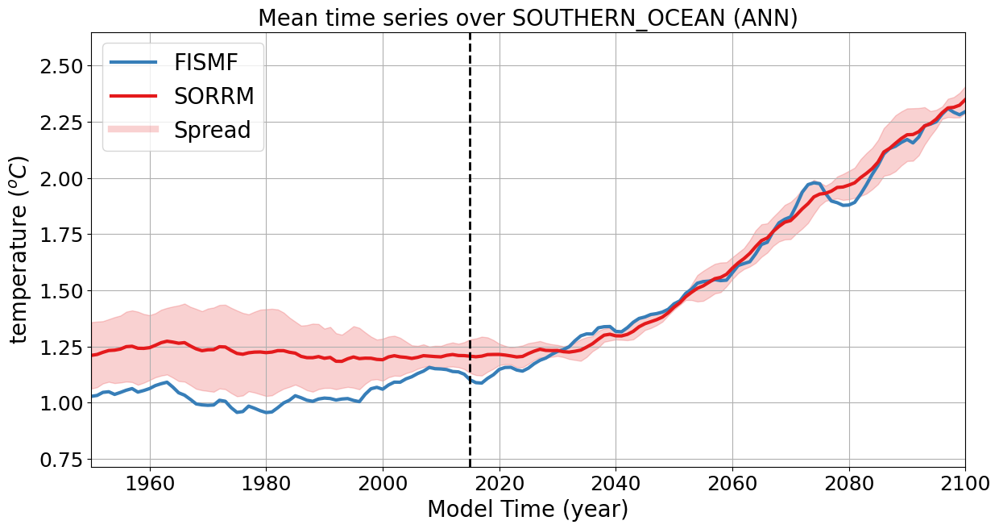

<Figure size 640x480 with 0 Axes>

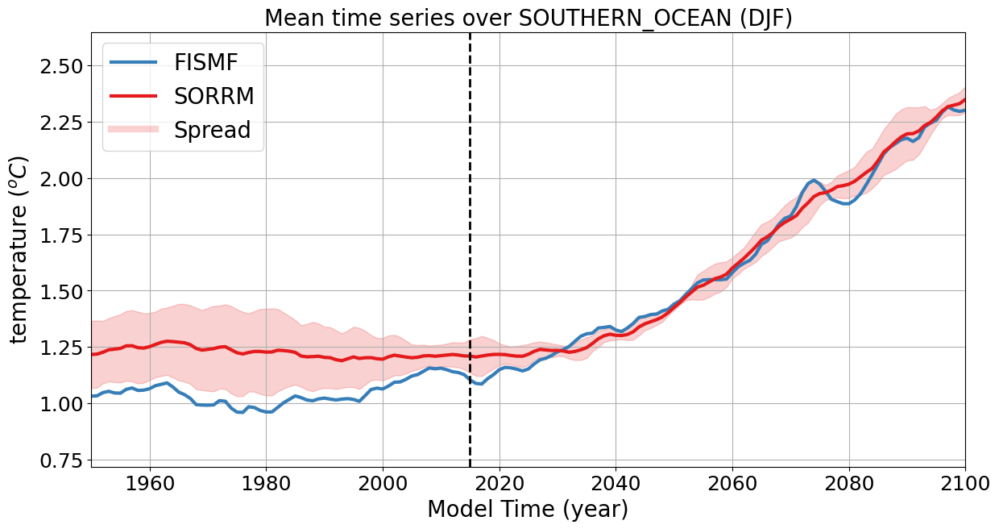

<Figure size 640x480 with 0 Axes>

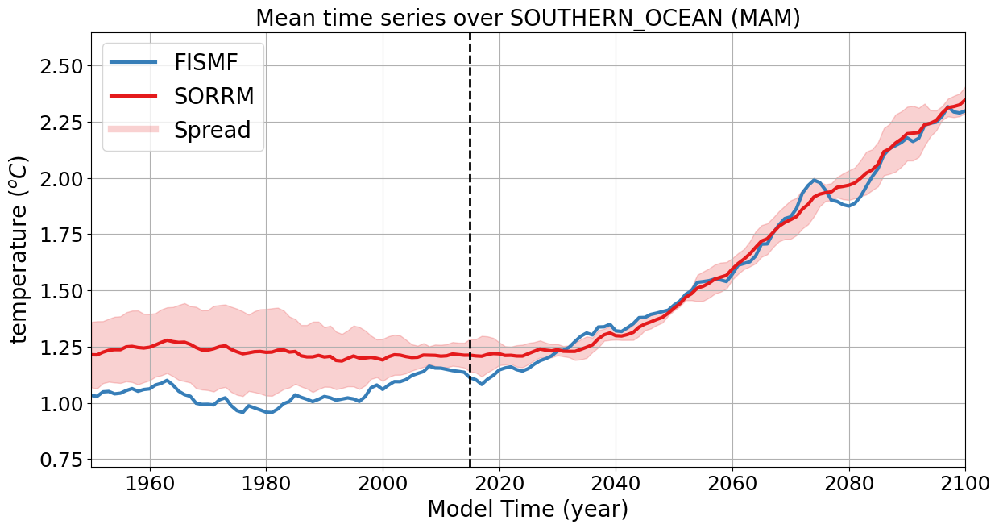

<Figure size 640x480 with 0 Axes>

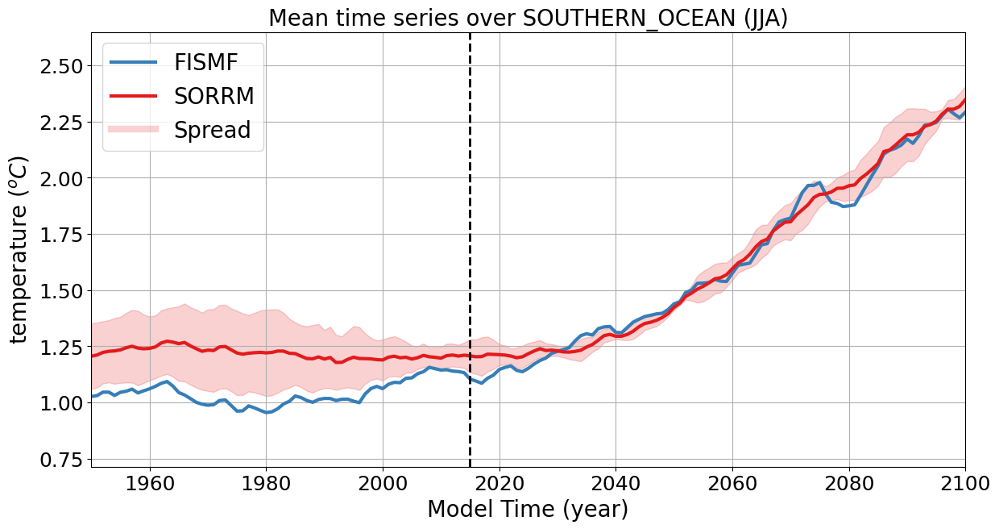

<Figure size 640x480 with 0 Axes>

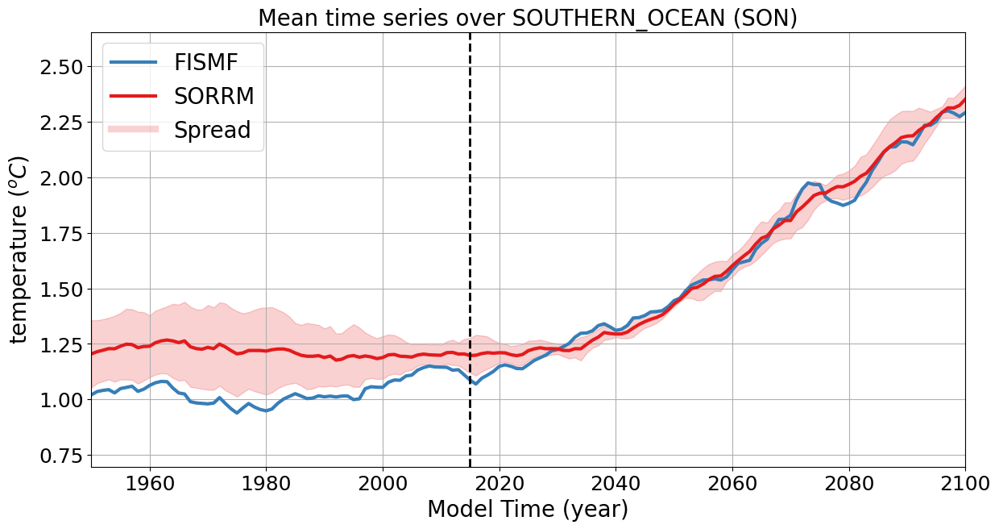

<Figure size 640x480 with 0 Axes>

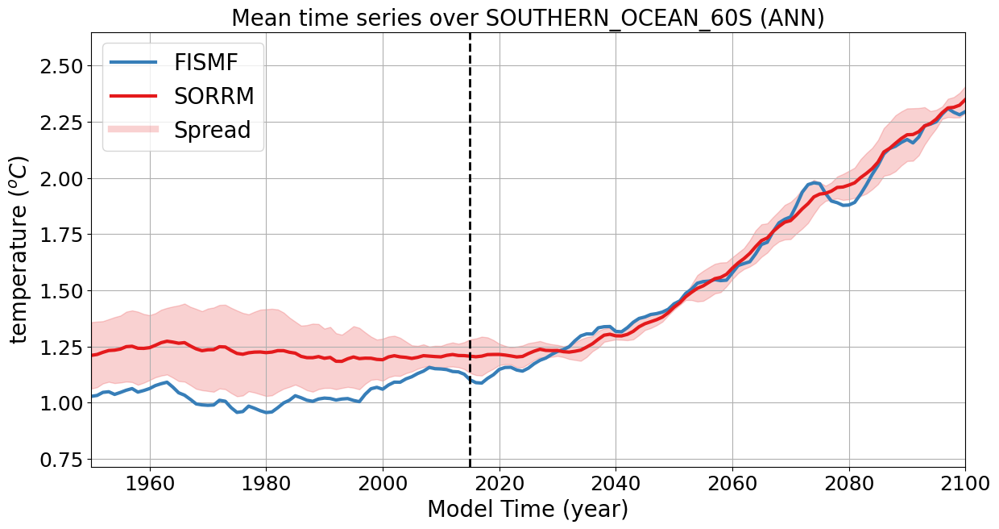

<Figure size 640x480 with 0 Axes>

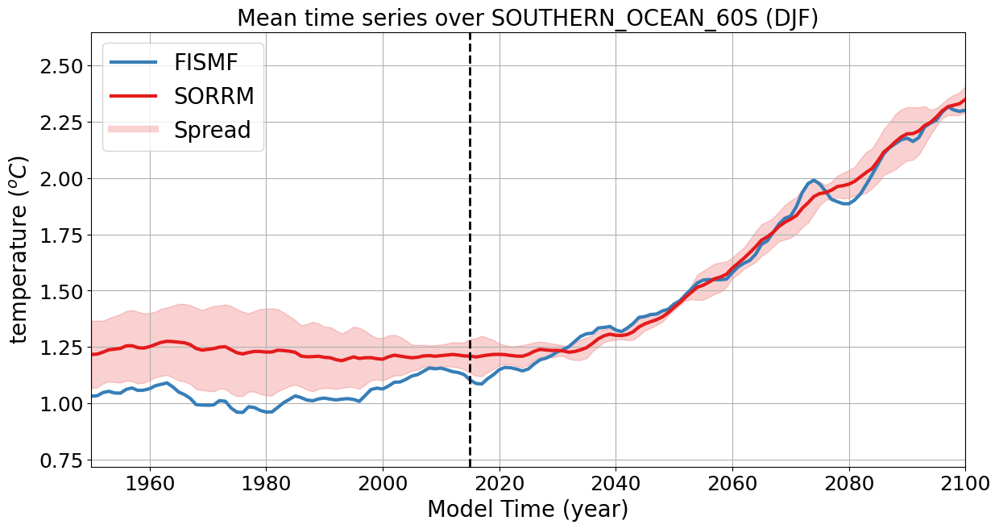

<Figure size 640x480 with 0 Axes>

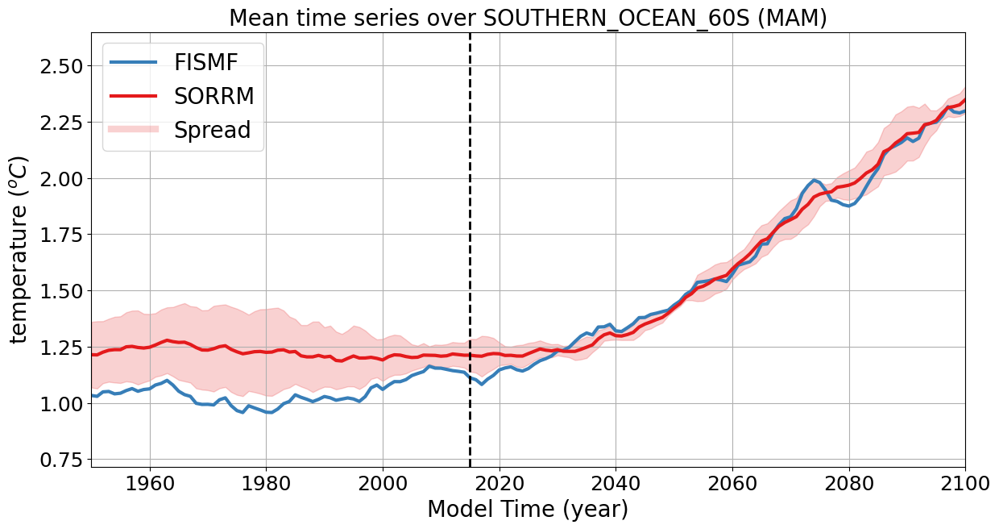

<Figure size 640x480 with 0 Axes>

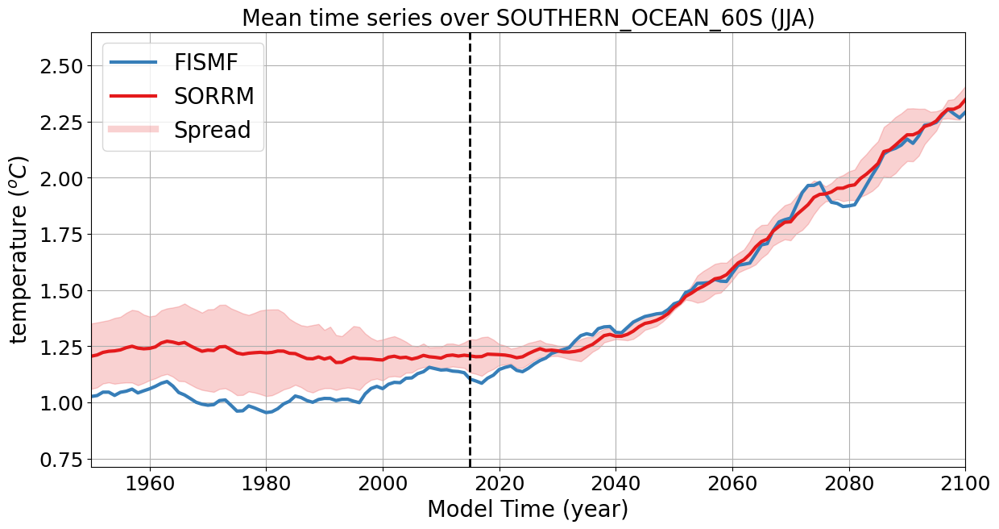

<Figure size 640x480 with 0 Axes>

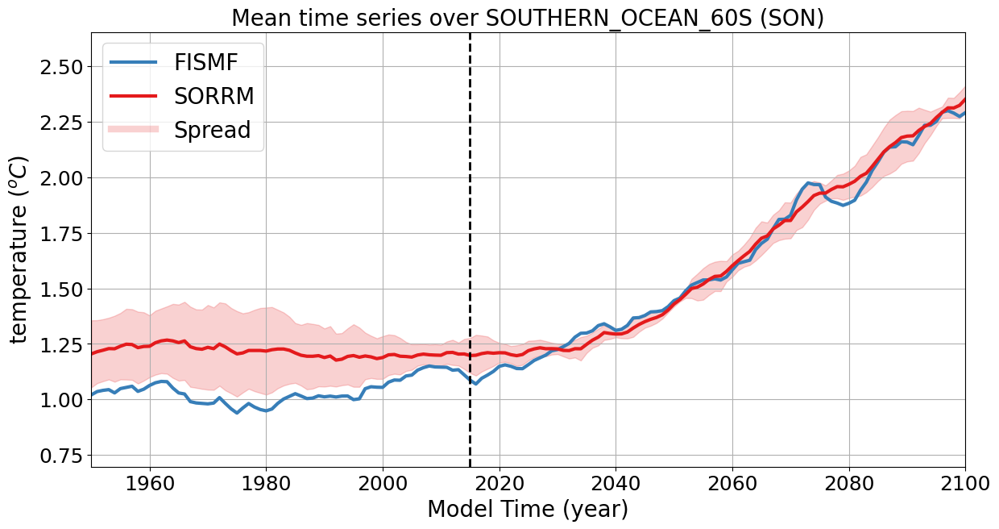

<Figure size 640x480 with 0 Axes>

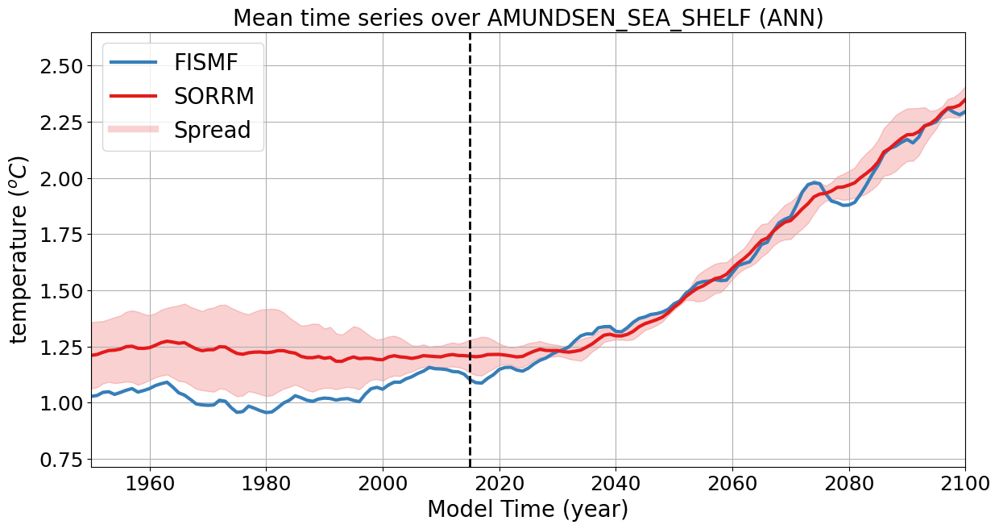

<Figure size 640x480 with 0 Axes>

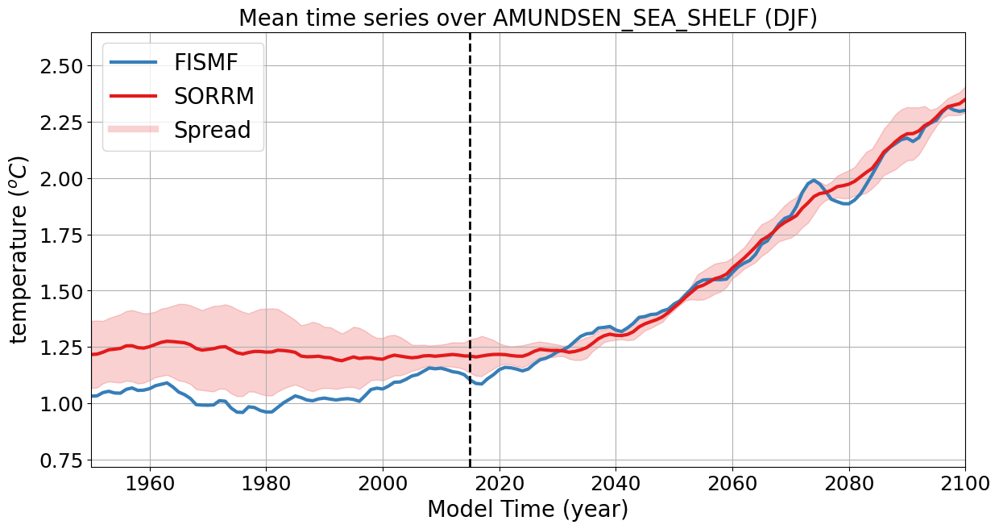

<Figure size 640x480 with 0 Axes>

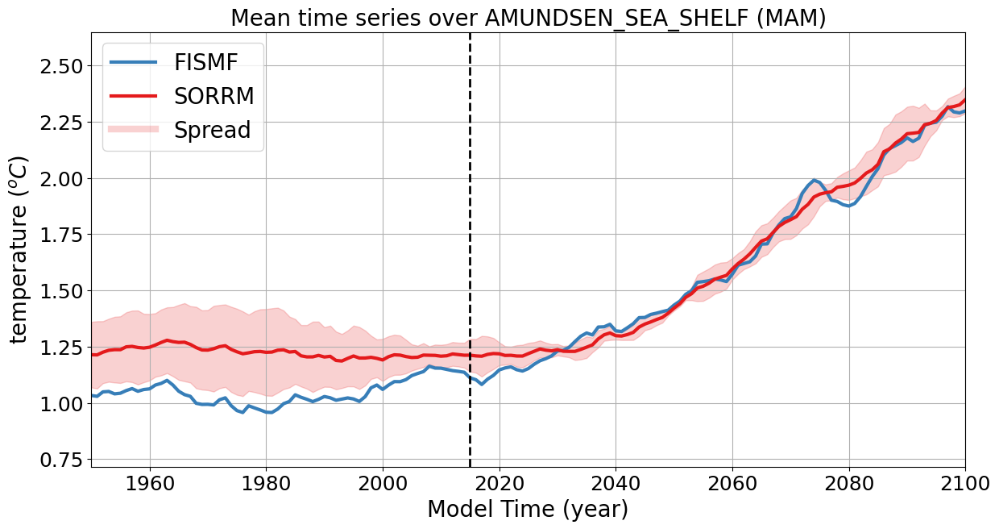

<Figure size 640x480 with 0 Axes>

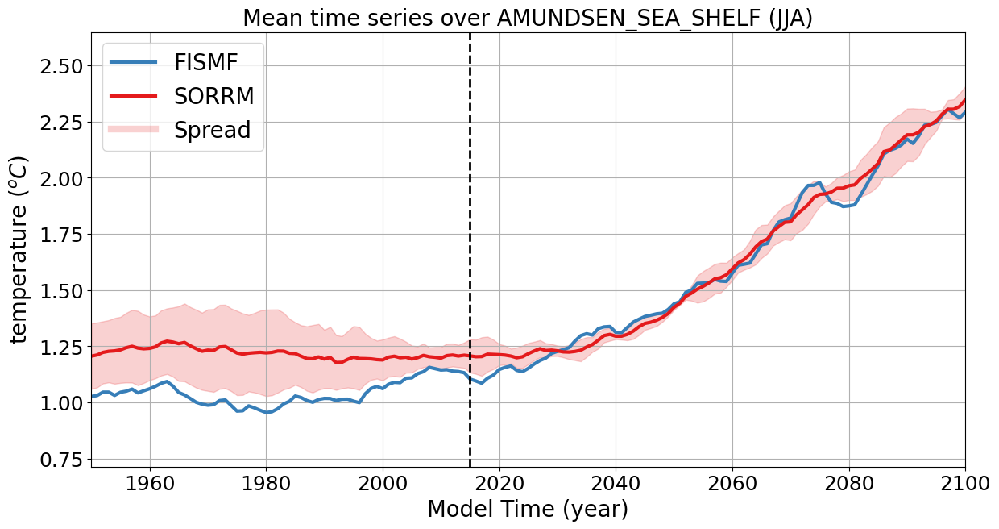

<Figure size 640x480 with 0 Axes>

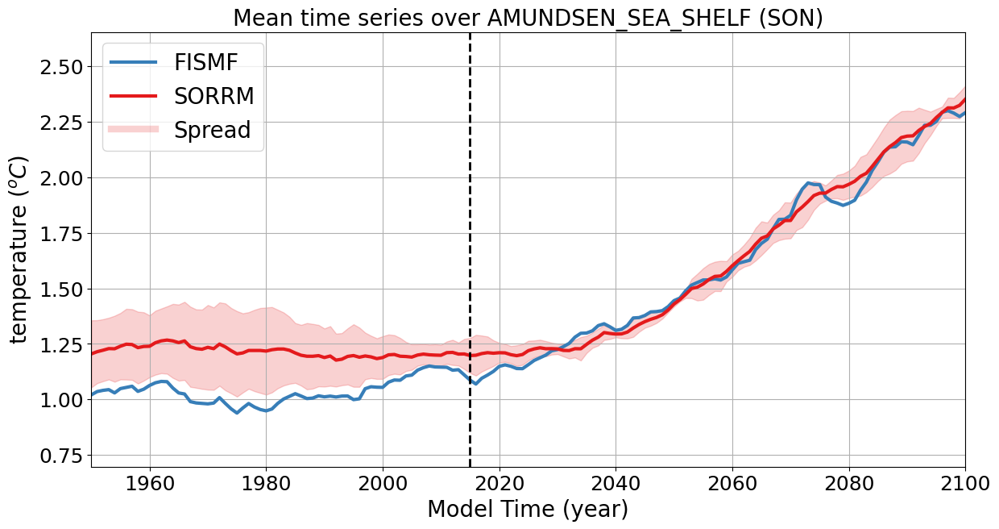

<Figure size 640x480 with 0 Axes>

In [107]:
if __name__ == "__main__":
    results_dir = "/lcrc/group/e3sm/ac.szhang/acme_scratch/e3sm_project/E3SMv21_testings/paper_material"
    top_dir = "/lcrc/group/acme/ac.szhang/acme_scratch/e3sm_project/E3SMv21_testings/paper_material"
    ts_path = os.path.join(top_dir,"fig_data","mpas_ts","raw_index")
    fig_dir = os.path.join(top_dir,"6_regional_analysis","metrics_plots","figure")
    exps = ["v2_1-SORRM.0701","v2_1-SORRM.0751","v2_1-SORRM.0801",'v2_1-SORRM-FISMF.0701']  
    seas = ['ANN','DJF','MAM','JJA','SON']

    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    
    mip = "e3sm"
    case_id = "mpas_ts"
    
    #varlist   = ['temperature','totalMeltFlux']
    #varstrs   = ['temperature','totalMeltFlux']
    var = 'temperature'
    varplt = "temperature"
    varunt = "$^oC$"
    regions = ['Southern_Ocean','Southern_Ocean_60S','Amundsen_Sea_Shelf']

    data_dict = {}
    for i,exp in enumerate(exps):
        fil1 =  os.path.join(ts_path,'{}.historical.{}.{}.{}.195001-201412.csv'.format(mip,exp,case_id,var))
        fil2 =  os.path.join(ts_path,'{}.ssp370.{}.{}.{}.201501-210012.csv'.format(mip,exp,case_id,var))
        if 'FISMF' in exp:
            fil1 = fil1.replace('-FISMF','')
        df1 = pd.read_csv(fil1)
        df2 = pd.read_csv(fil2)
        data = pd.concat([df1, df2], ignore_index=True)
        data.drop('time', axis=1, inplace=True)
        for sea in seas: 
            if sea in ['DJF']:
                sub_data  = data[data['month'].isin([12,1,2])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['JJA']:
                sub_data  = data[data['month'].isin([6,7,8])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['MAM']:
                sub_data  = data[data['month'].isin([3,4,5])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['SON']:
                sub_data  = data[data['month'].isin([9,10,11])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['ANN']:
                sub_data  = data
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['AC']:
                sub_data  = data
                datmn = sub_data.groupby(by=['month'],dropna=True).mean()
            if sea in ['Monthly']:
                sub_data  = data
                datmn = data
            time = np.array(datmn.index) 
            for col in list(datmn.columns)[1:]:
                if col not in data_dict.keys():
                    data_dict[col] = {}
                if sea not in data_dict[col].keys():
                    data_dict[col][sea] = {}
                if exp not in data_dict[col][sea].keys():
                    data_dict[col][sea][exp] = {} 
                data_dict[col][sea][exp] = datmn[col]    
        del(df1,df2,data,datmn)
    
    #plot
    for region in regions: 
        for sea in seas:
            data = data_dict[col][sea]
            plot_time_series(varplt,varunt,region,sea,exps,time,data,fig_dir)
            

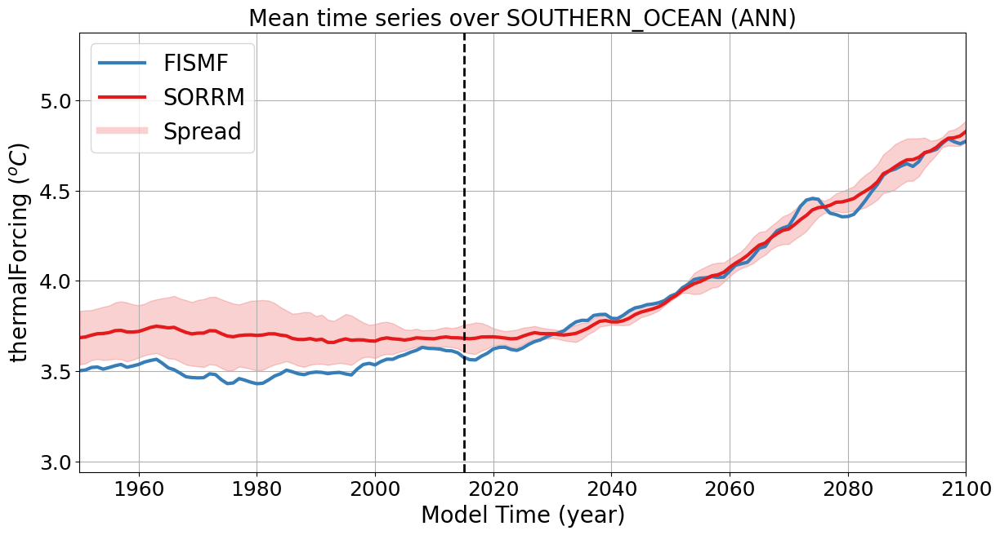

<Figure size 640x480 with 0 Axes>

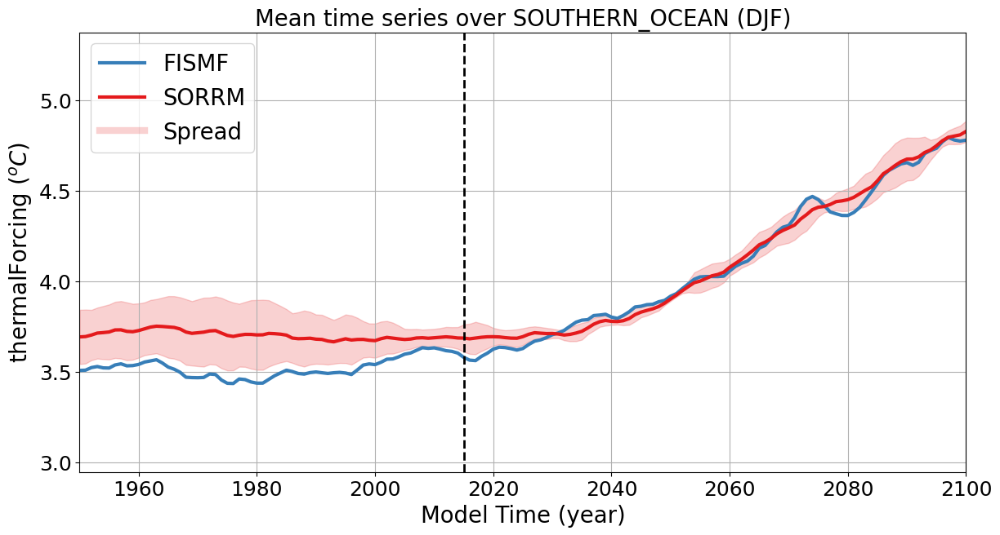

<Figure size 640x480 with 0 Axes>

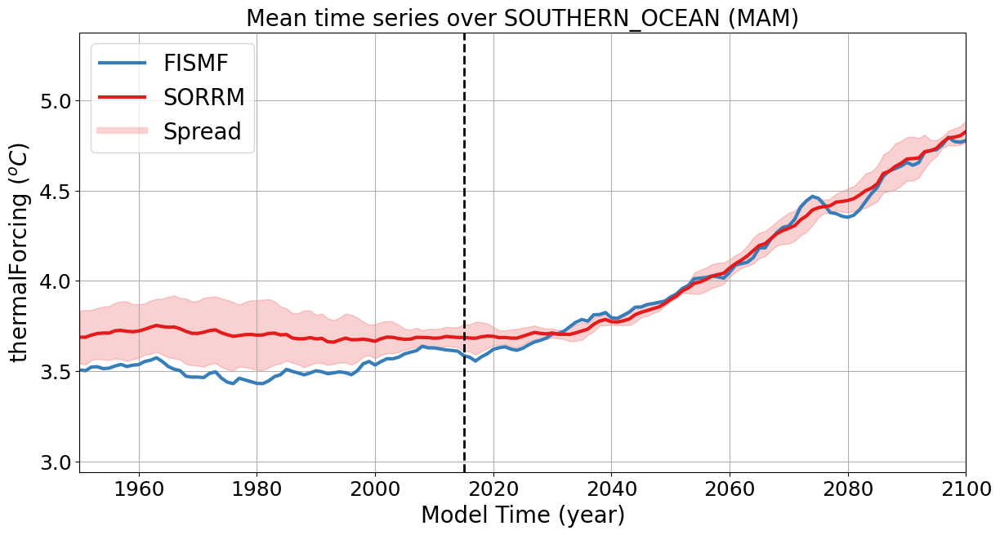

<Figure size 640x480 with 0 Axes>

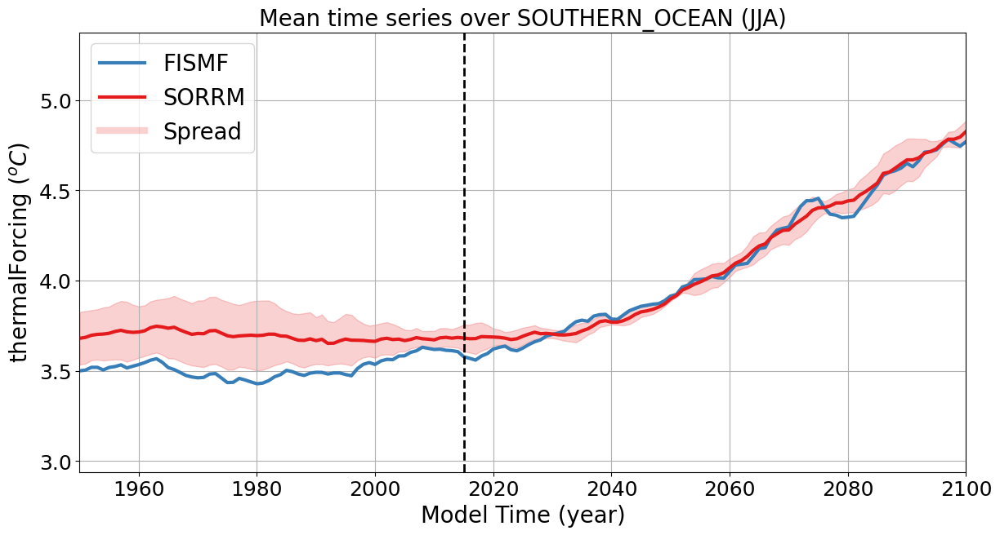

<Figure size 640x480 with 0 Axes>

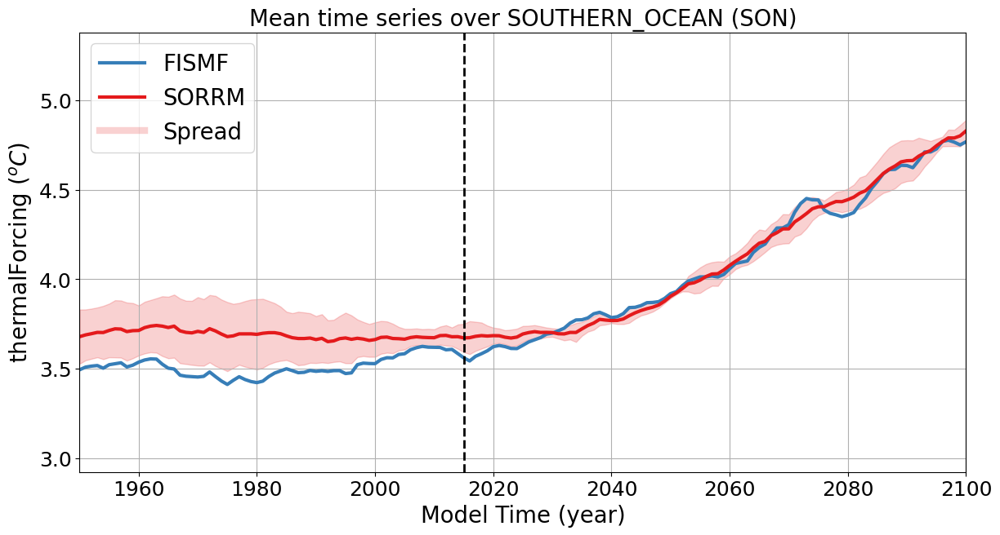

<Figure size 640x480 with 0 Axes>

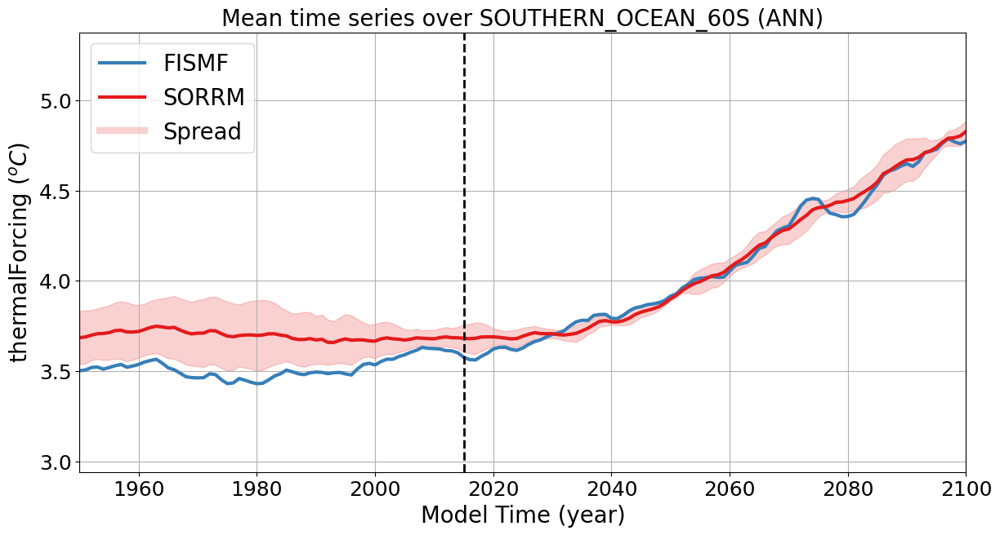

<Figure size 640x480 with 0 Axes>

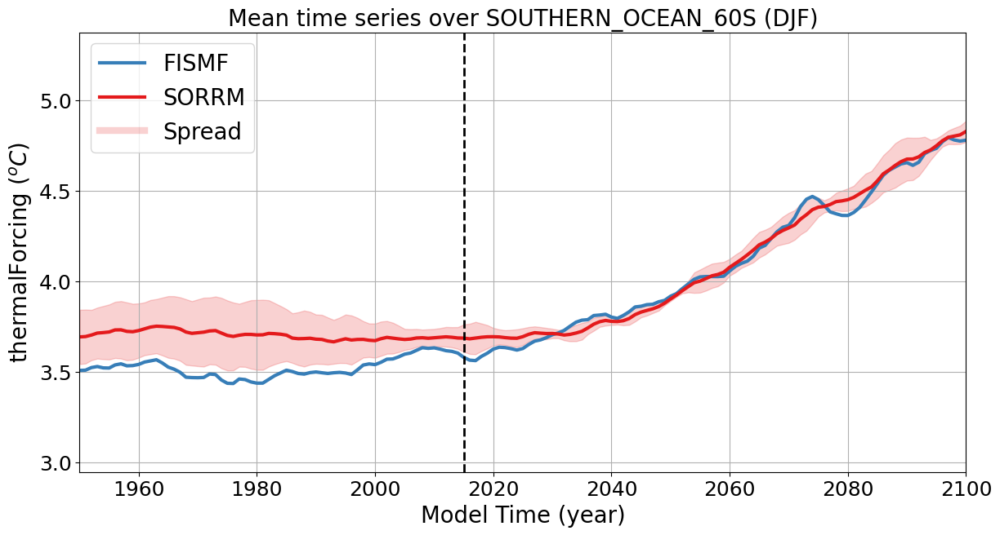

<Figure size 640x480 with 0 Axes>

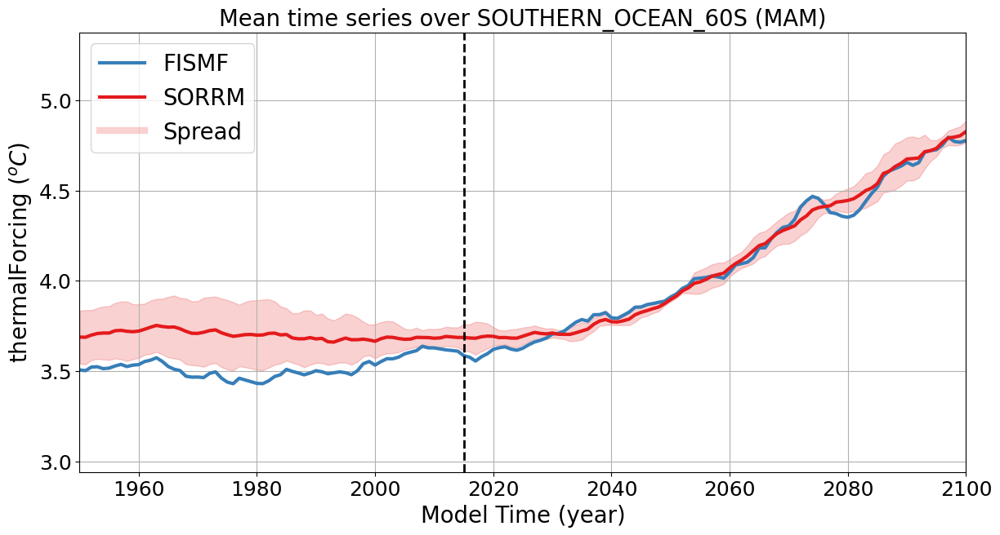

<Figure size 640x480 with 0 Axes>

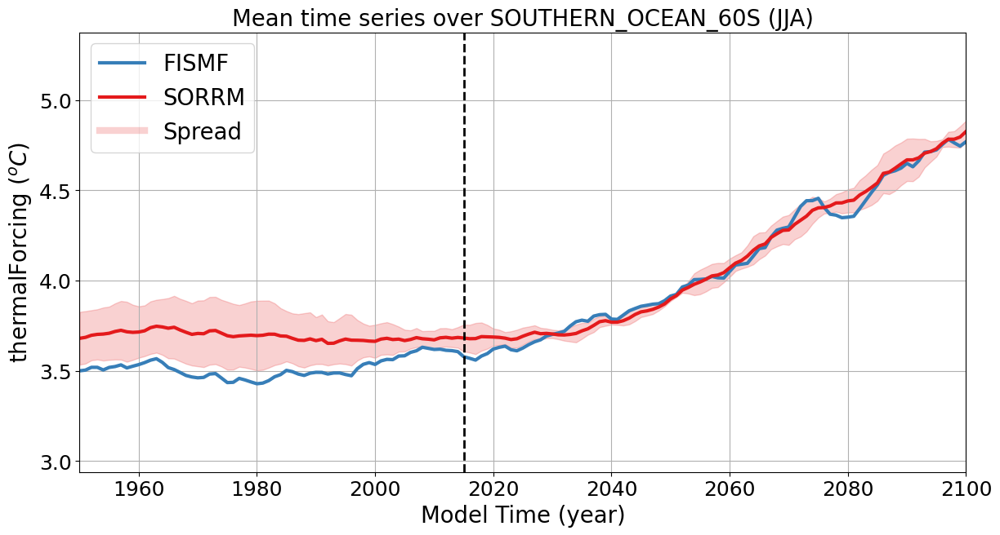

<Figure size 640x480 with 0 Axes>

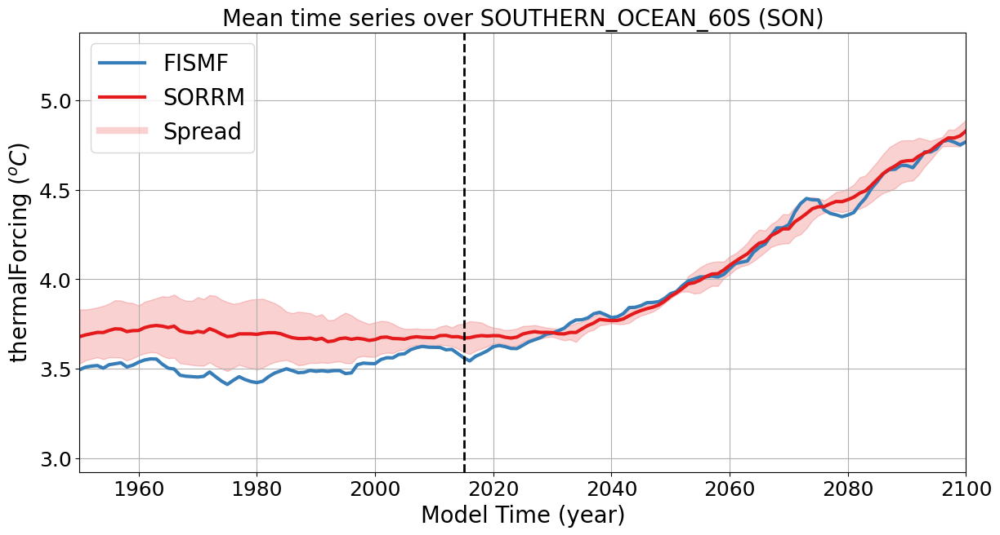

<Figure size 640x480 with 0 Axes>

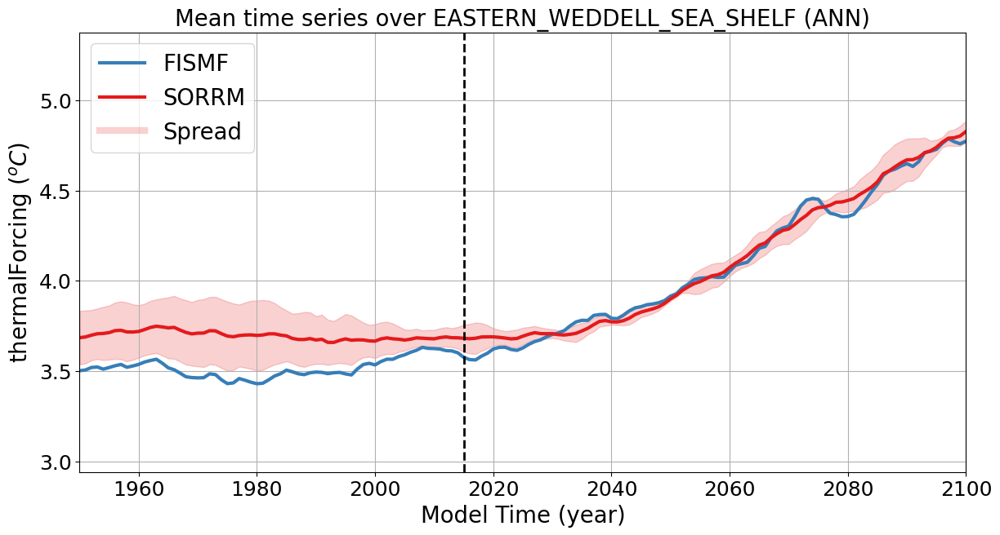

<Figure size 640x480 with 0 Axes>

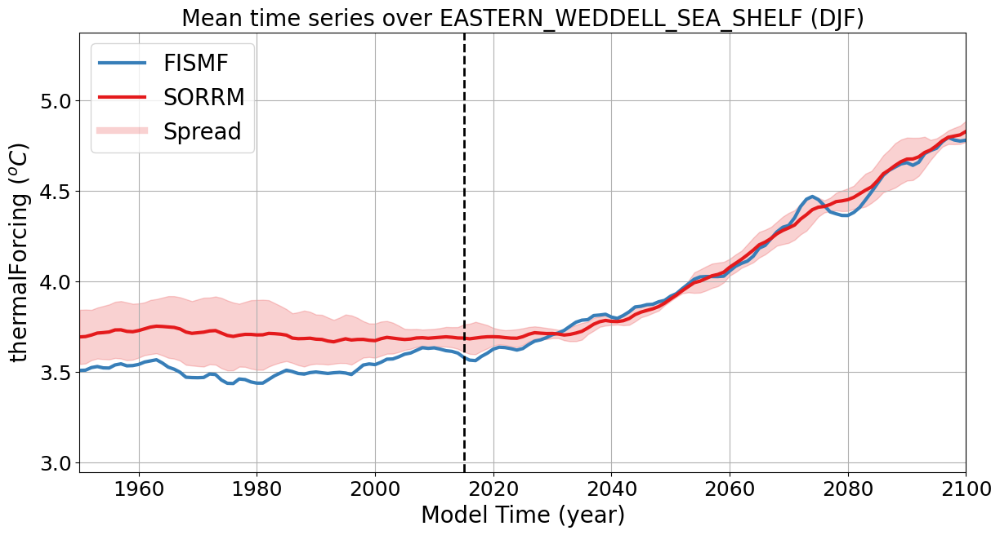

<Figure size 640x480 with 0 Axes>

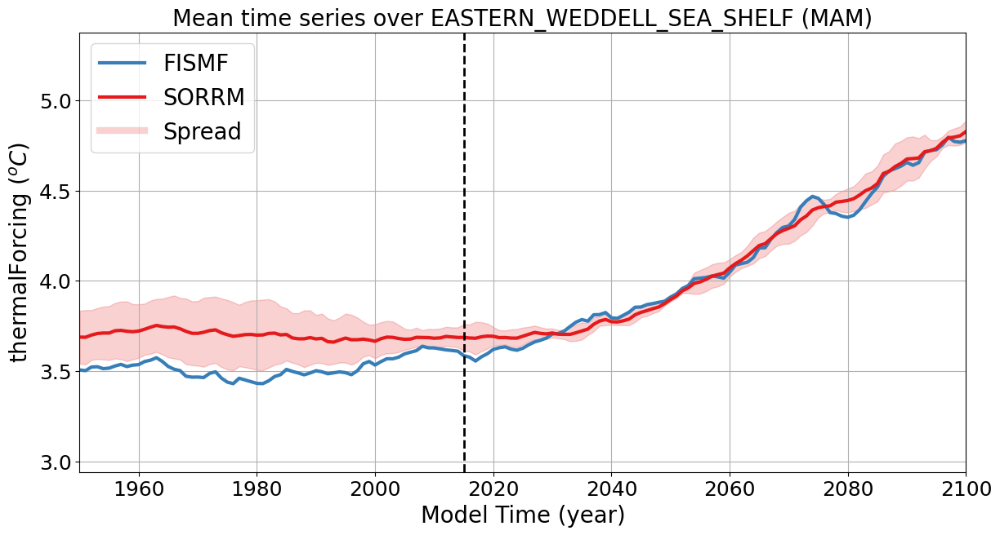

<Figure size 640x480 with 0 Axes>

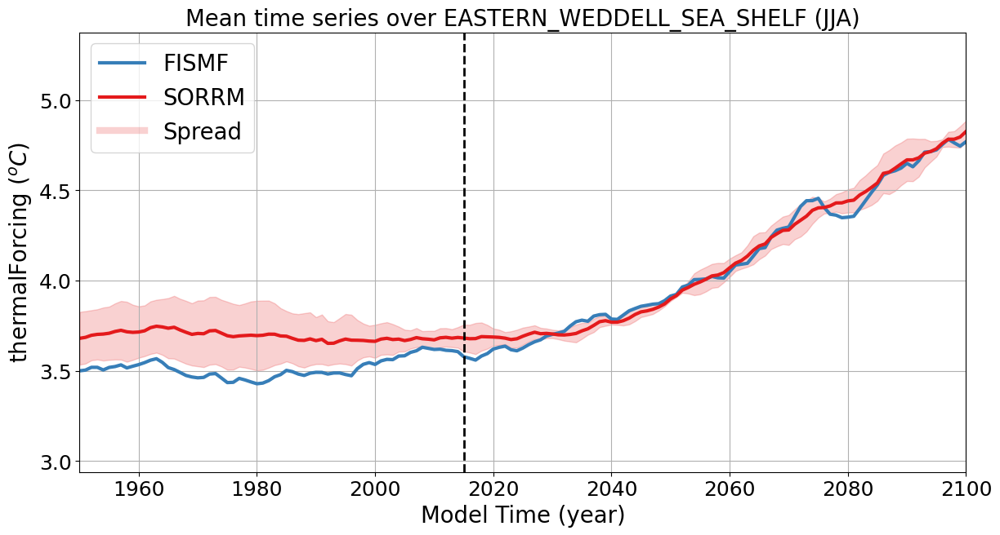

<Figure size 640x480 with 0 Axes>

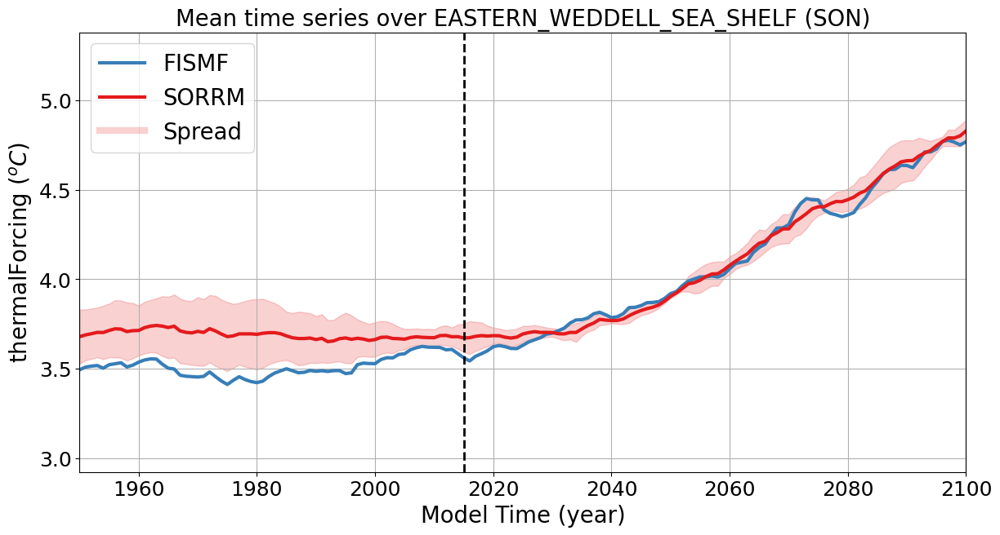

<Figure size 640x480 with 0 Axes>

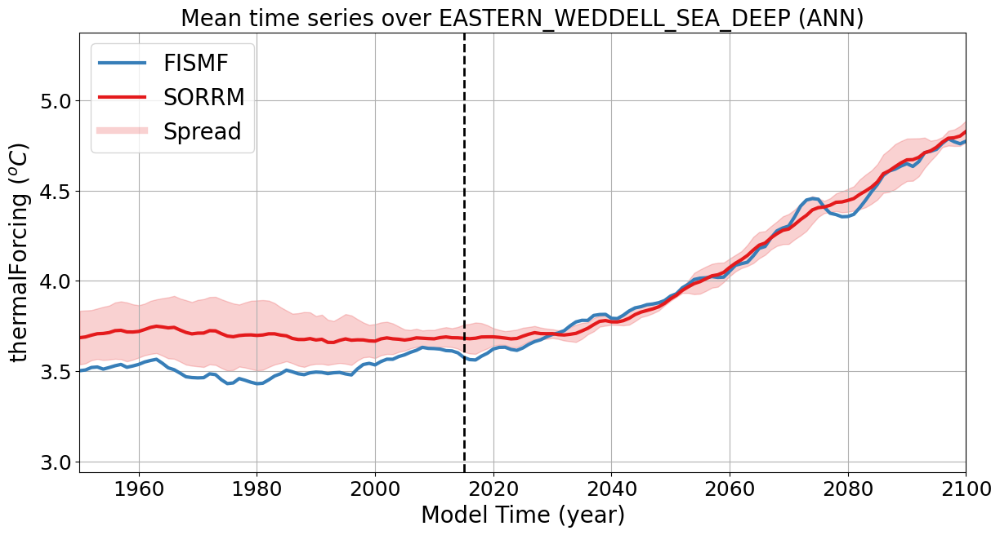

<Figure size 640x480 with 0 Axes>

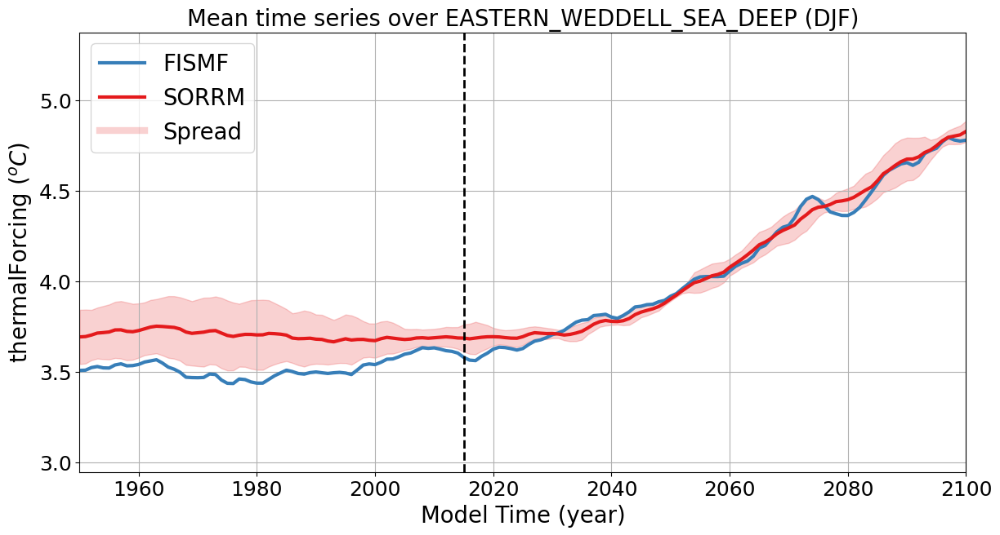

<Figure size 640x480 with 0 Axes>

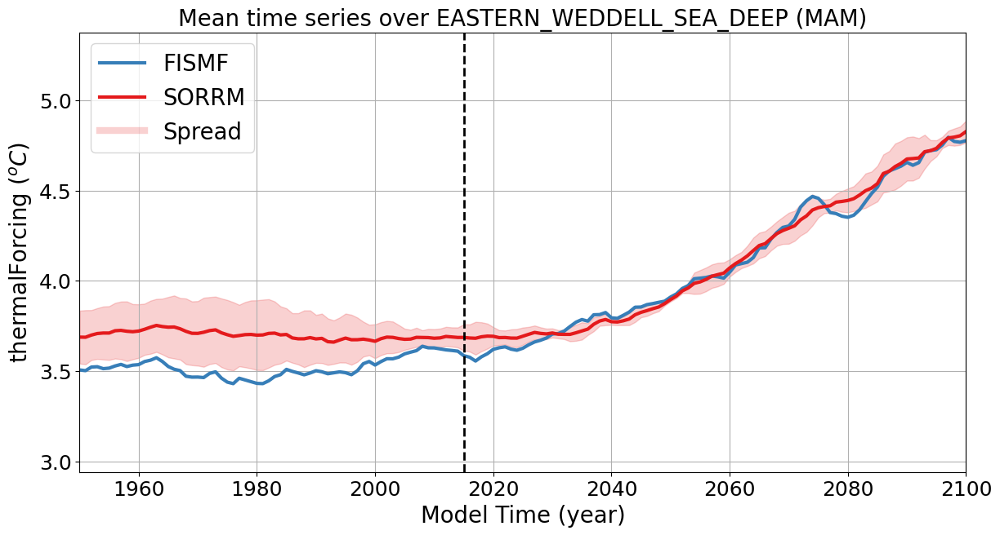

<Figure size 640x480 with 0 Axes>

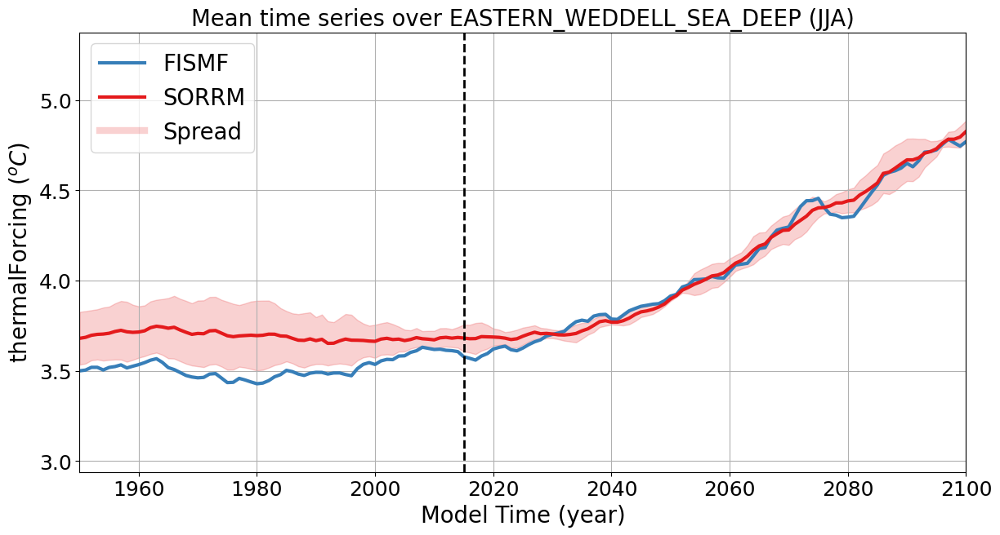

<Figure size 640x480 with 0 Axes>

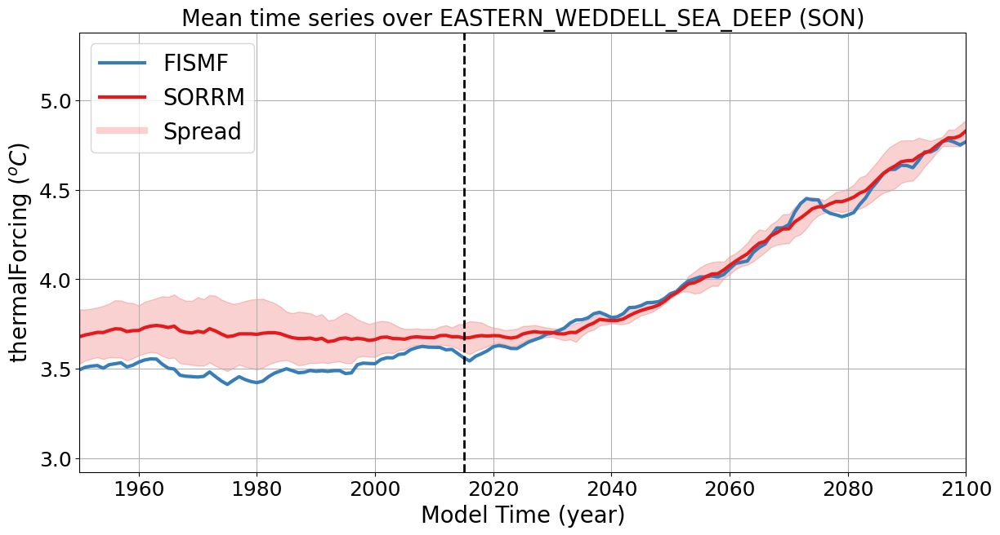

<Figure size 640x480 with 0 Axes>

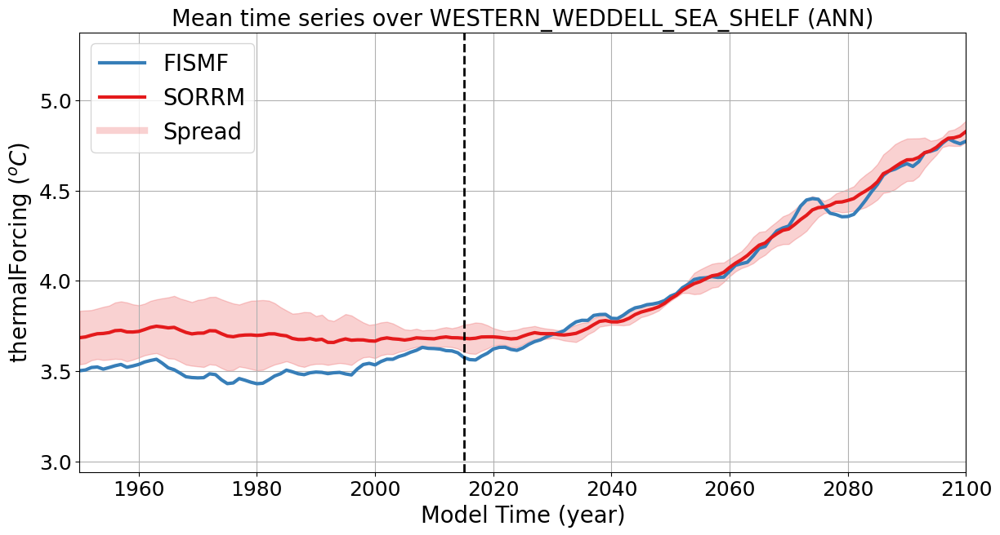

<Figure size 640x480 with 0 Axes>

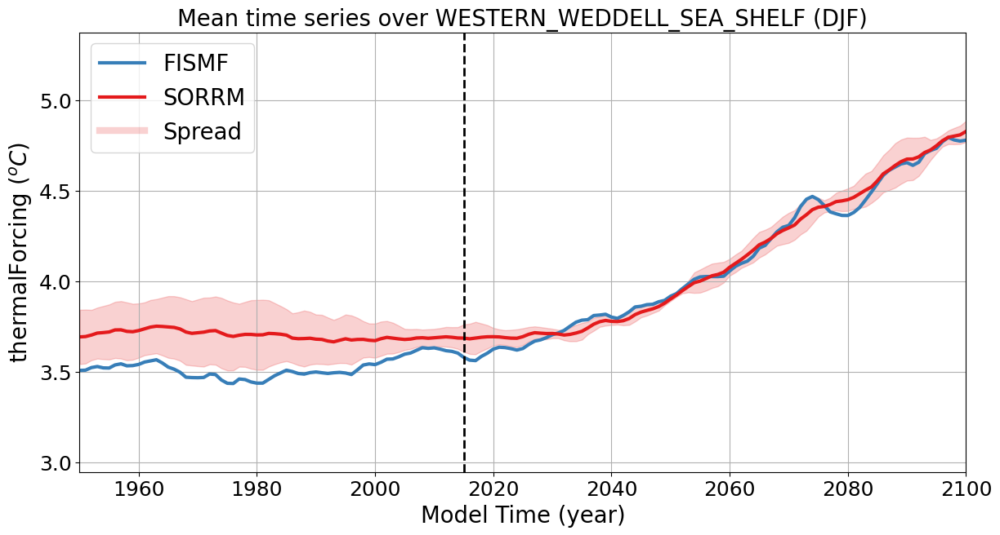

<Figure size 640x480 with 0 Axes>

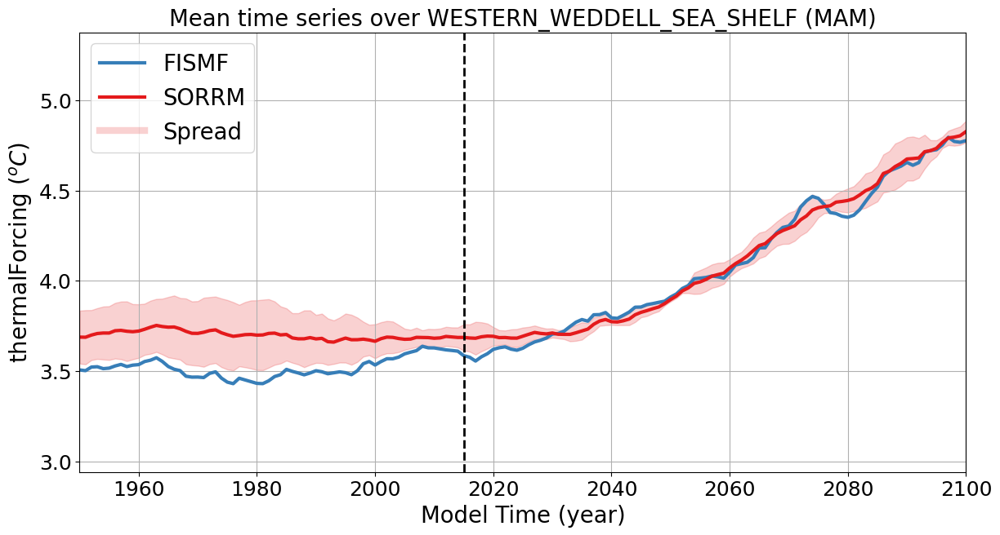

<Figure size 640x480 with 0 Axes>

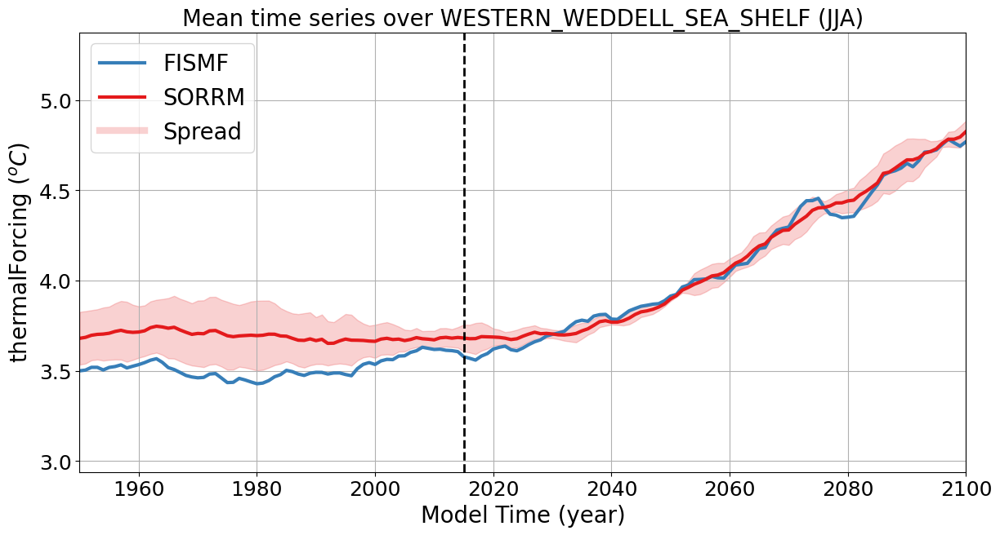

<Figure size 640x480 with 0 Axes>

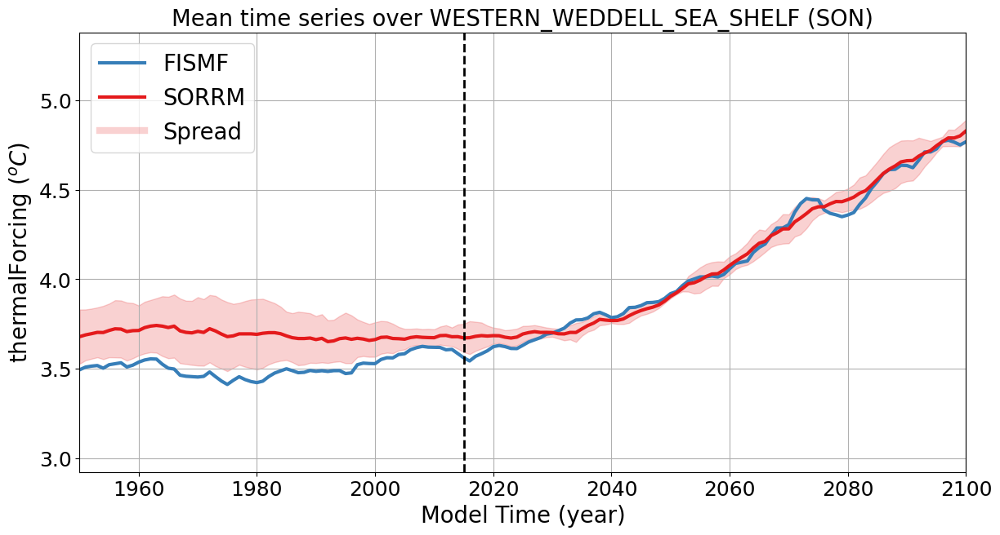

<Figure size 640x480 with 0 Axes>

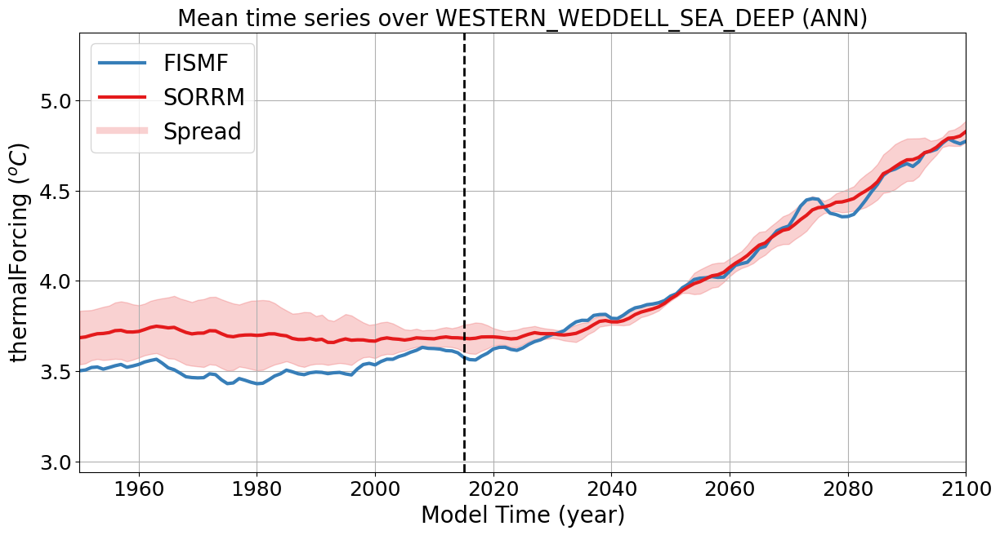

<Figure size 640x480 with 0 Axes>

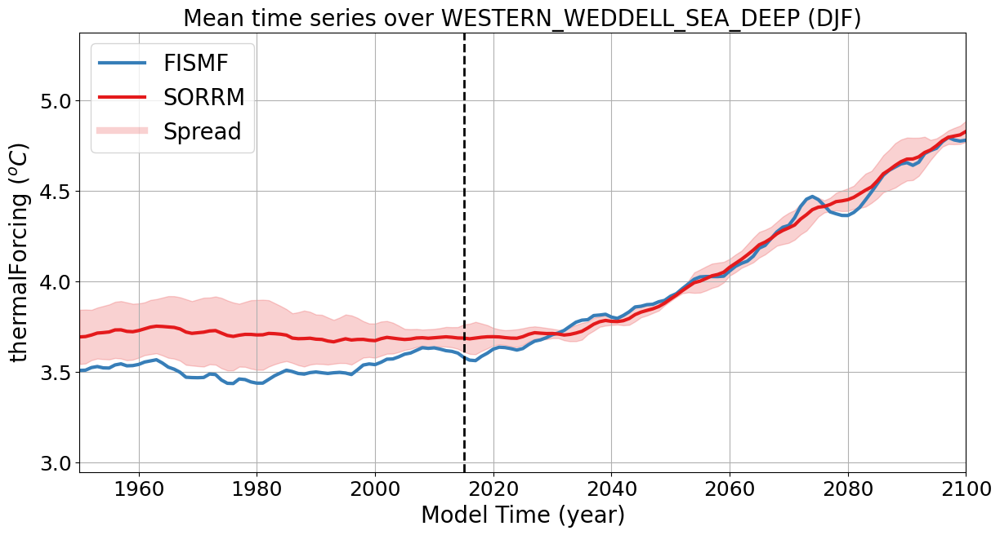

<Figure size 640x480 with 0 Axes>

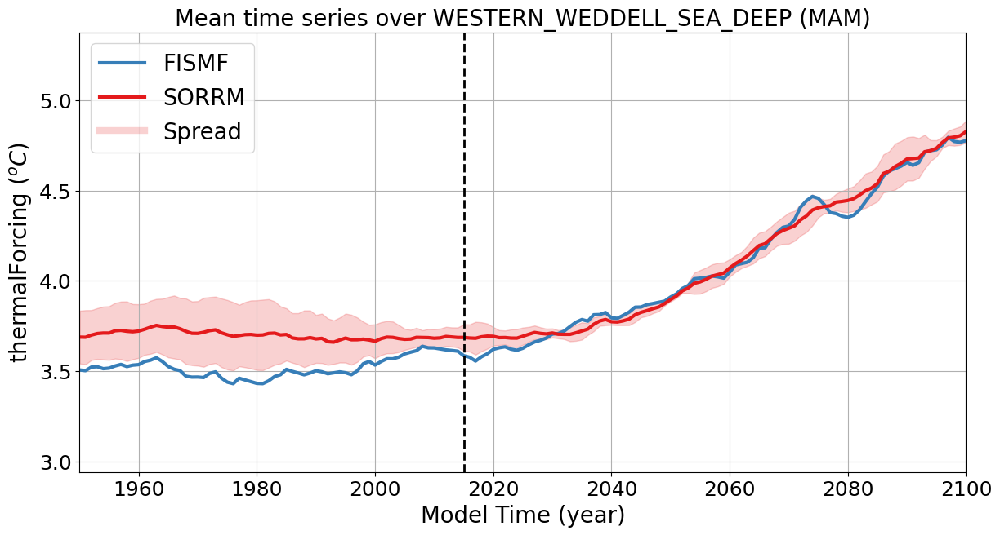

<Figure size 640x480 with 0 Axes>

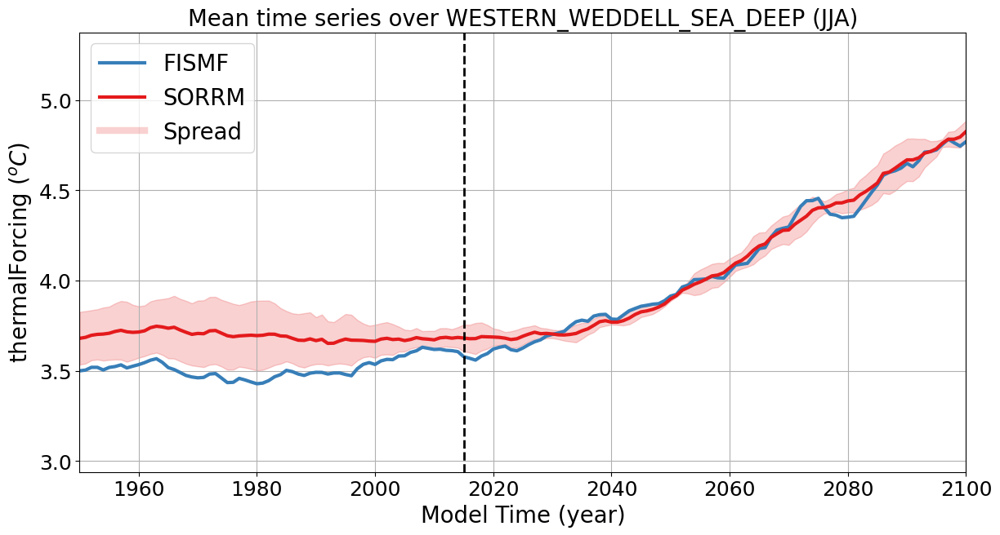

<Figure size 640x480 with 0 Axes>

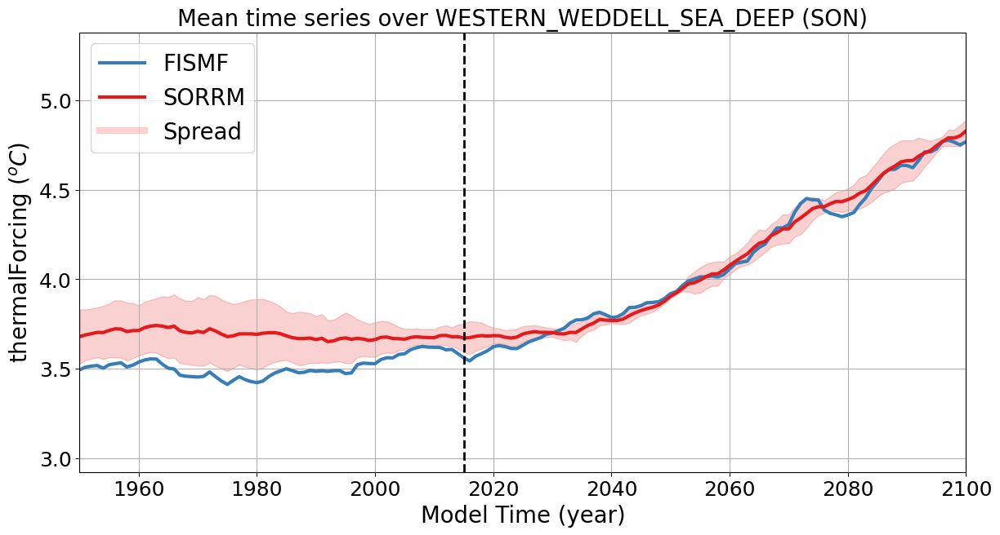

<Figure size 640x480 with 0 Axes>

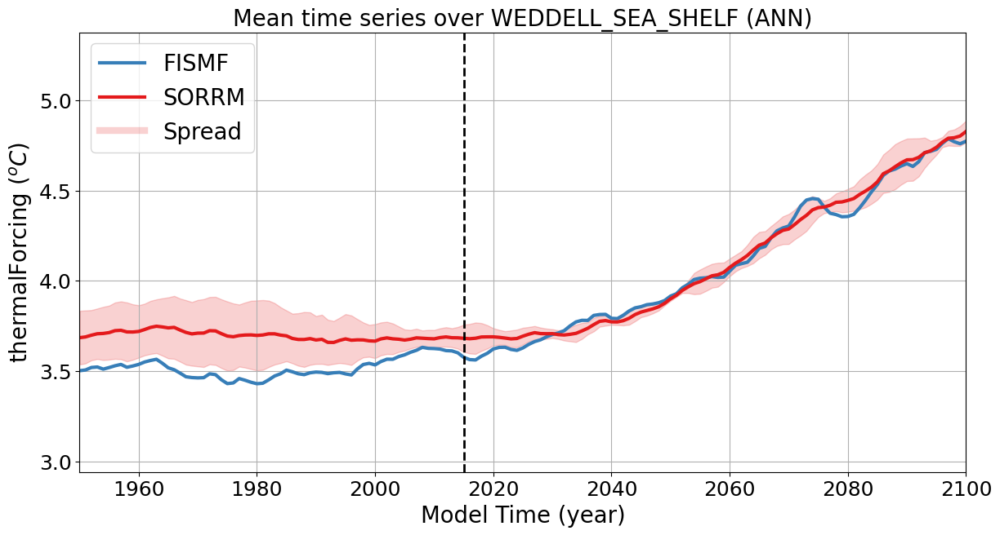

<Figure size 640x480 with 0 Axes>

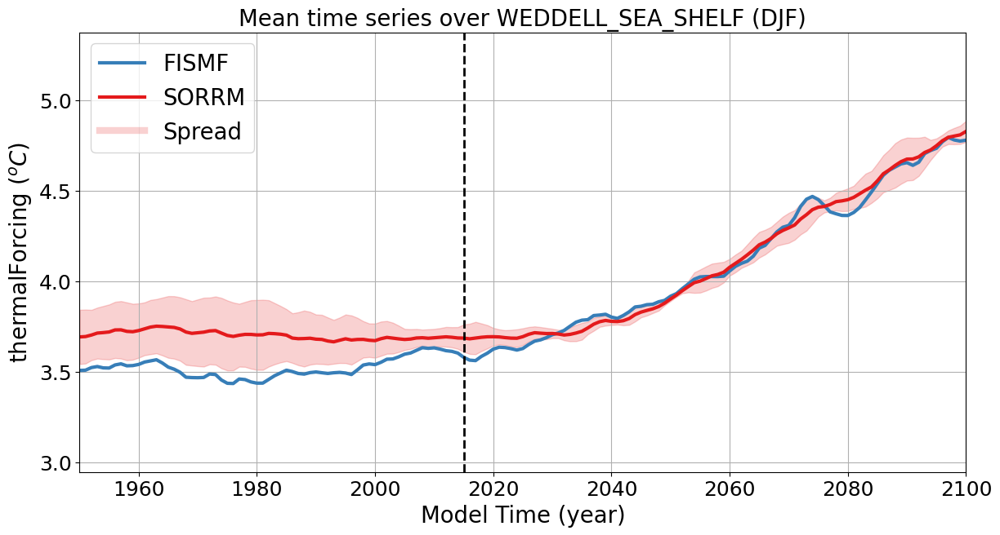

<Figure size 640x480 with 0 Axes>

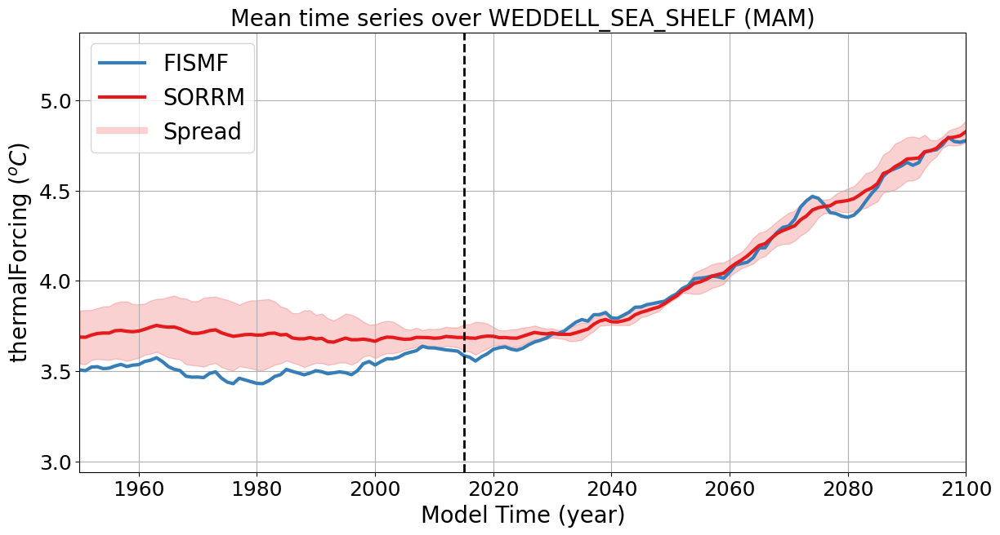

<Figure size 640x480 with 0 Axes>

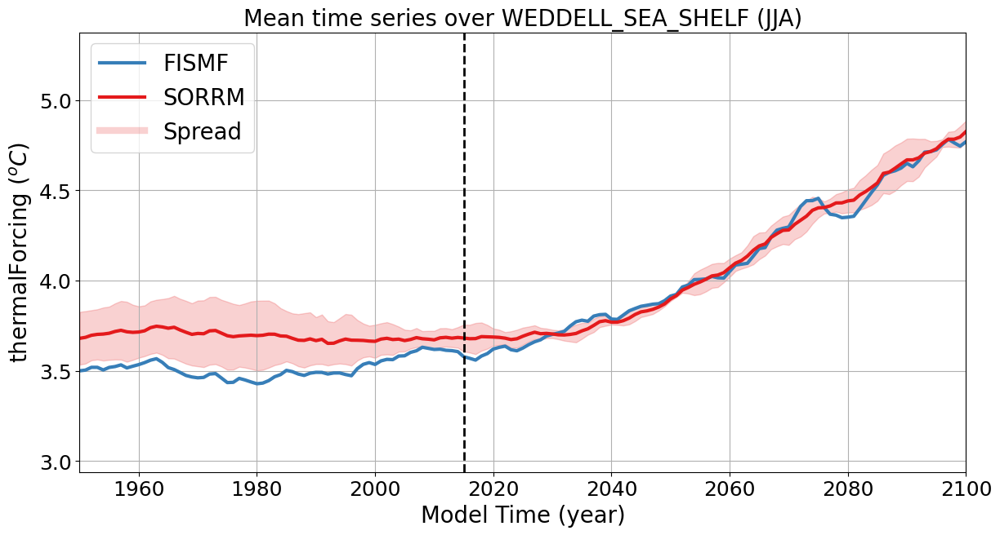

<Figure size 640x480 with 0 Axes>

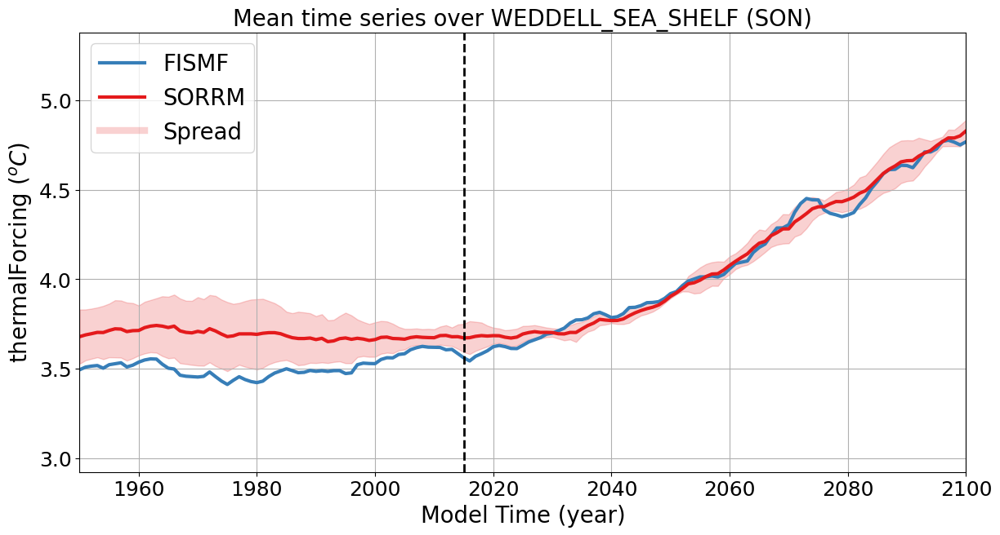

<Figure size 640x480 with 0 Axes>

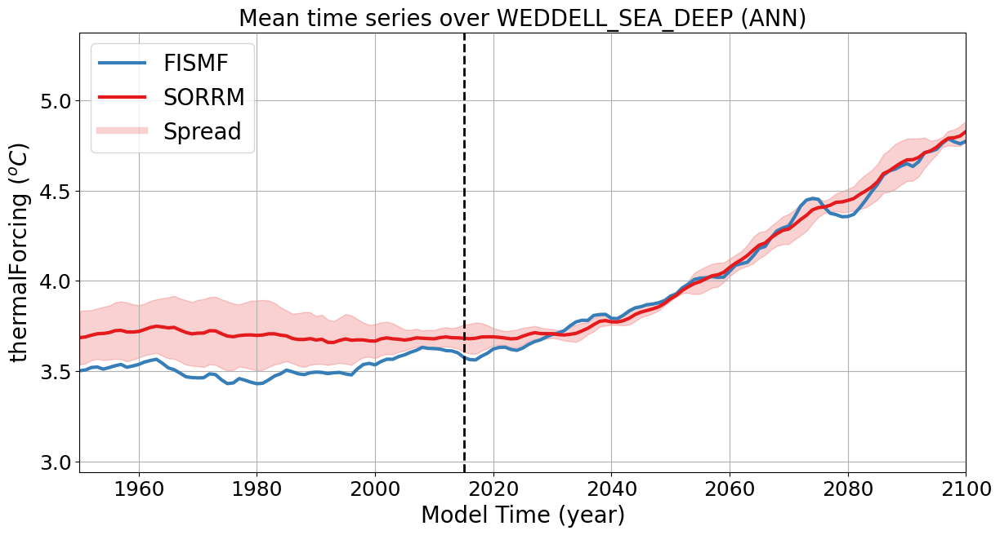

<Figure size 640x480 with 0 Axes>

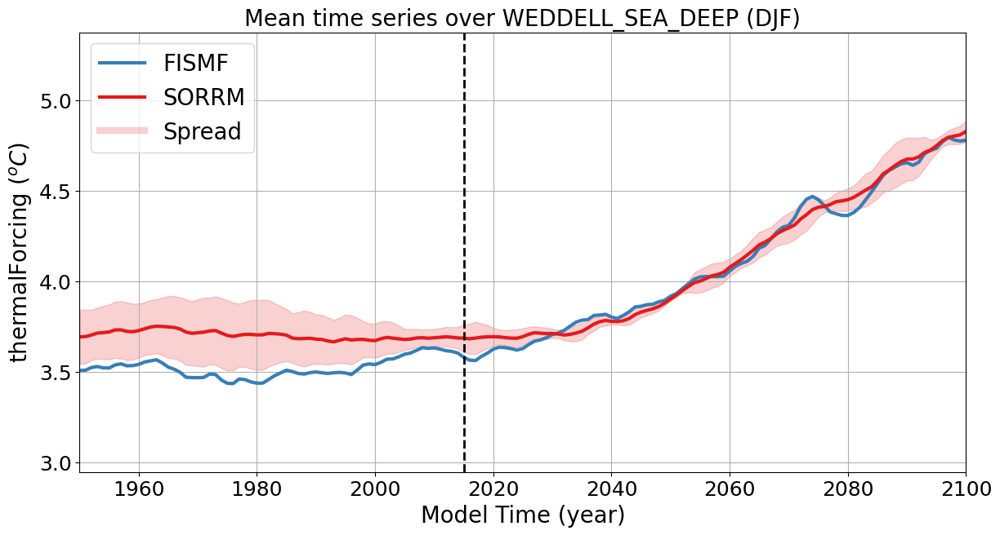

<Figure size 640x480 with 0 Axes>

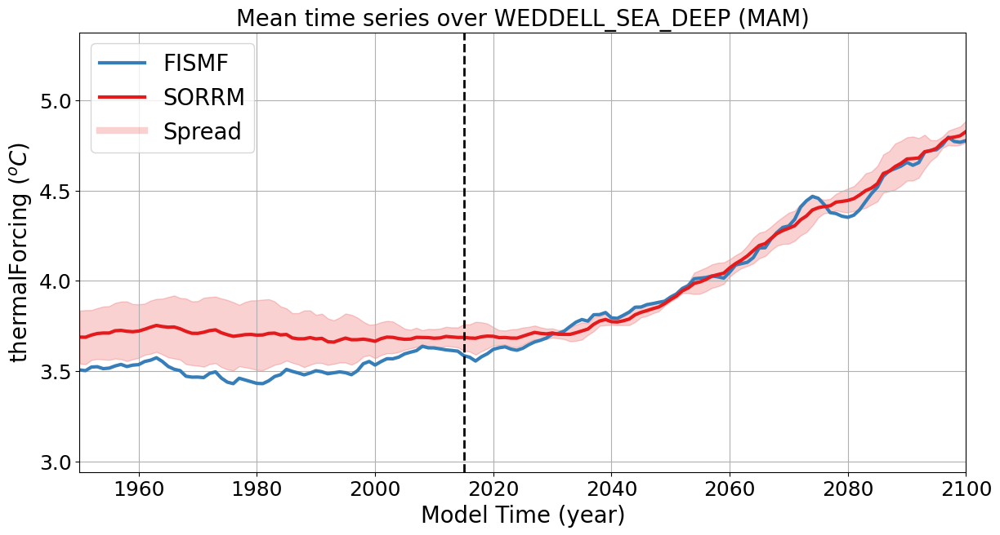

<Figure size 640x480 with 0 Axes>

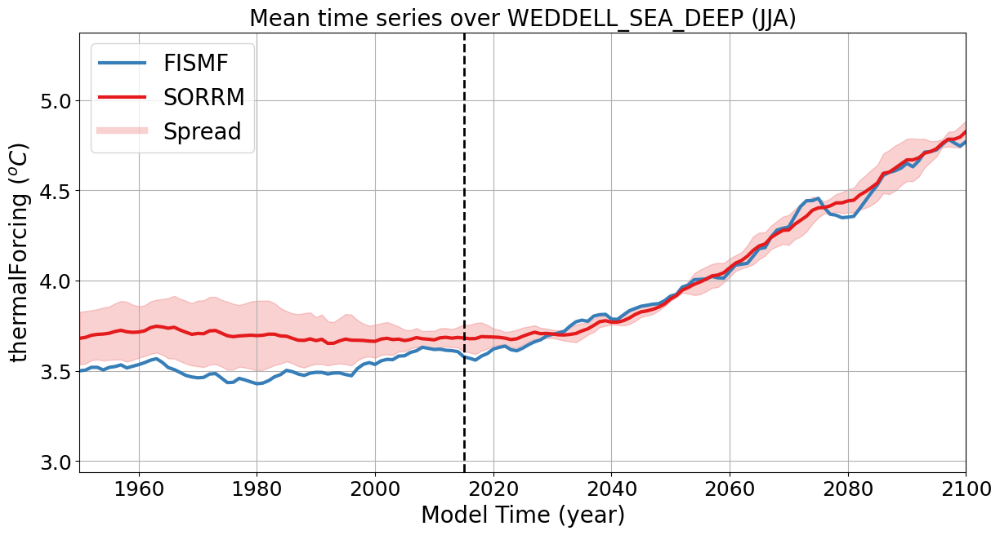

<Figure size 640x480 with 0 Axes>

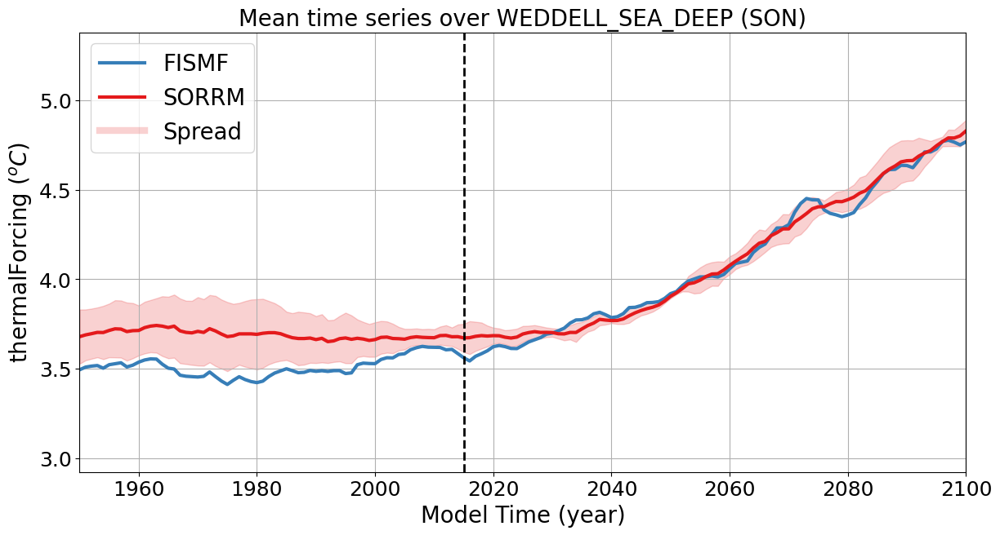

<Figure size 640x480 with 0 Axes>

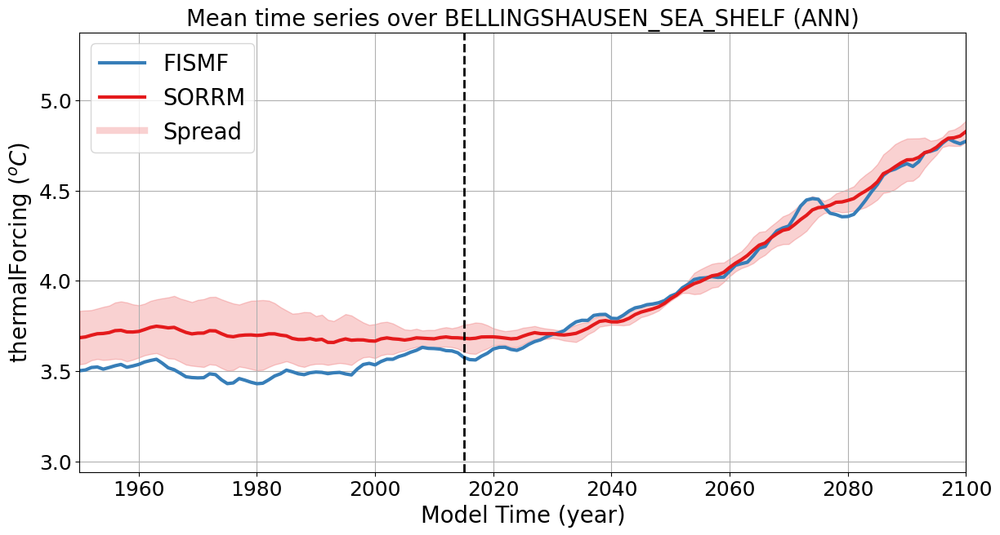

<Figure size 640x480 with 0 Axes>

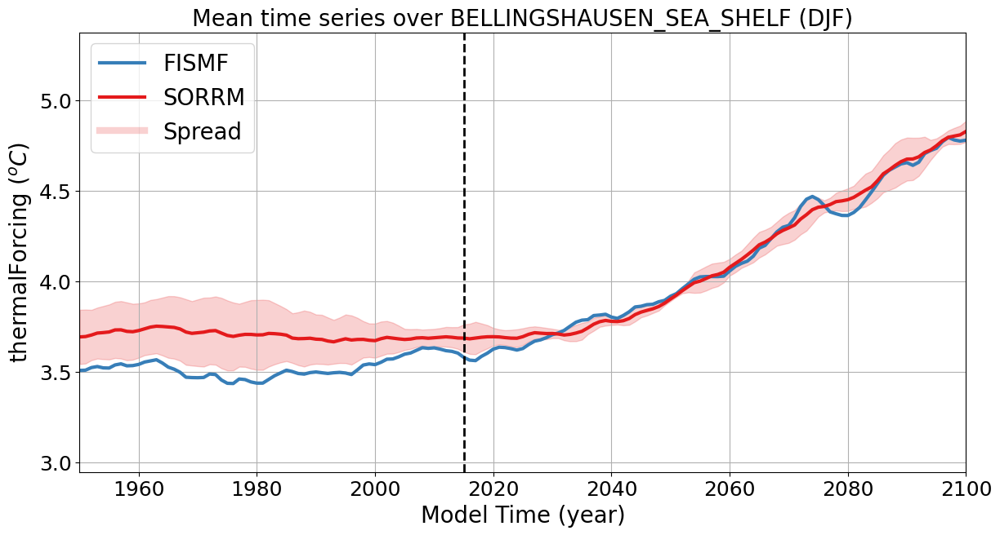

<Figure size 640x480 with 0 Axes>

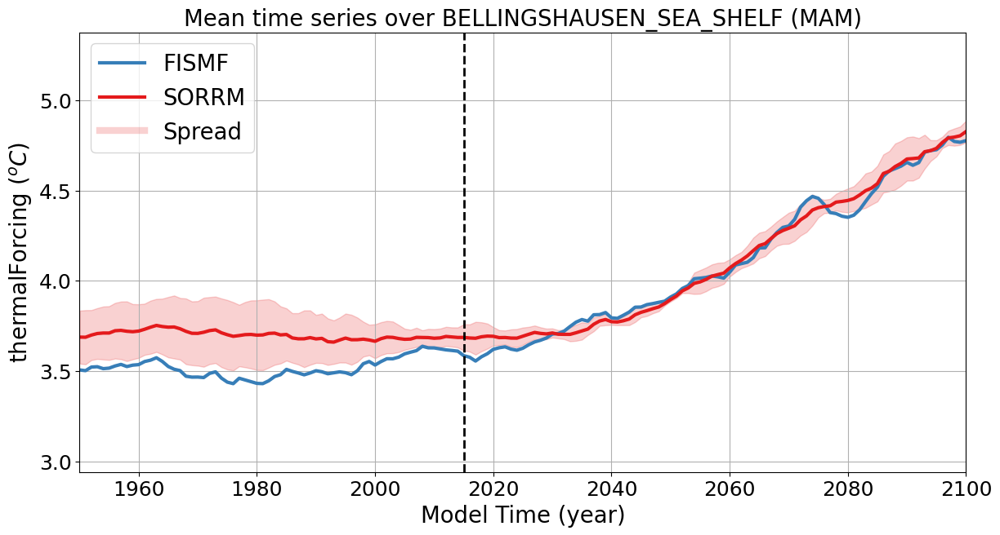

<Figure size 640x480 with 0 Axes>

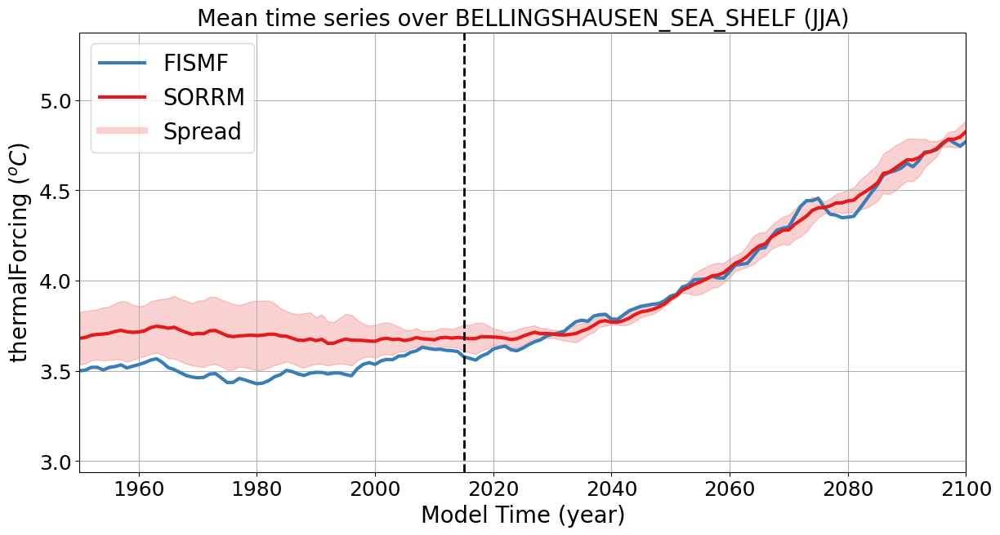

<Figure size 640x480 with 0 Axes>

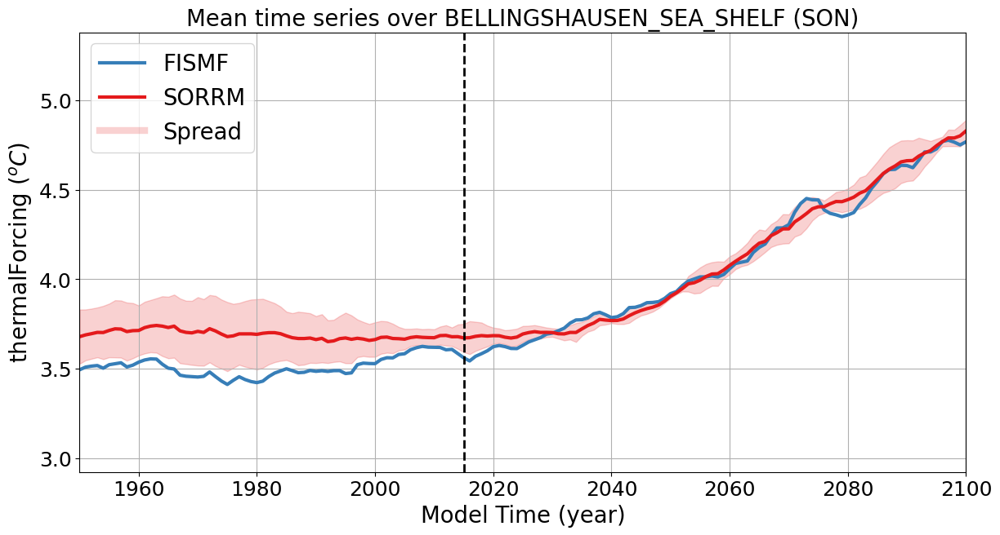

<Figure size 640x480 with 0 Axes>

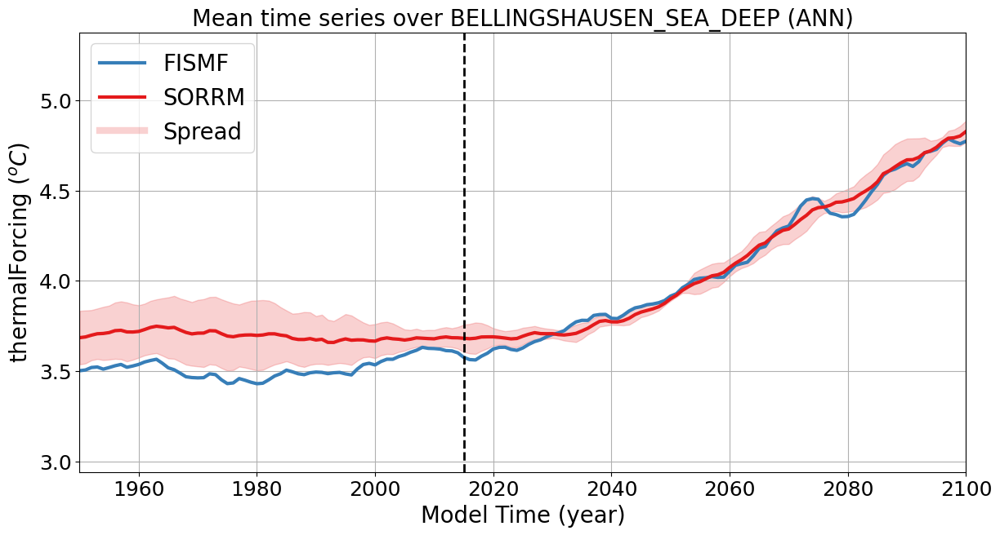

<Figure size 640x480 with 0 Axes>

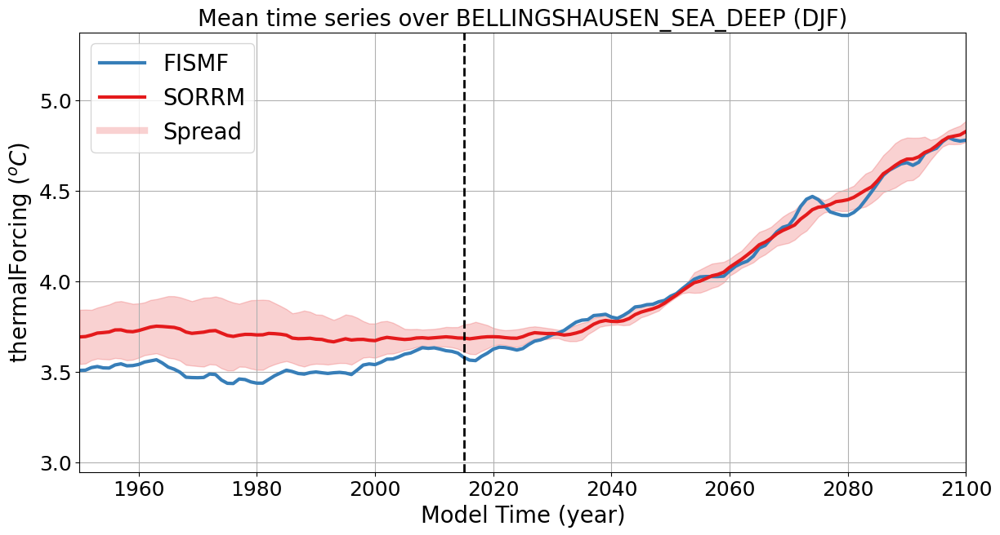

<Figure size 640x480 with 0 Axes>

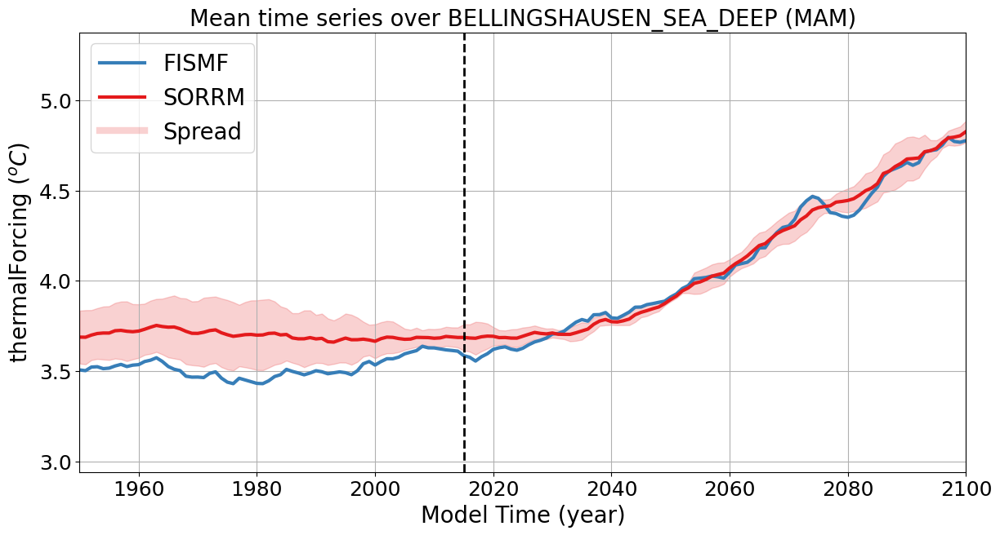

<Figure size 640x480 with 0 Axes>

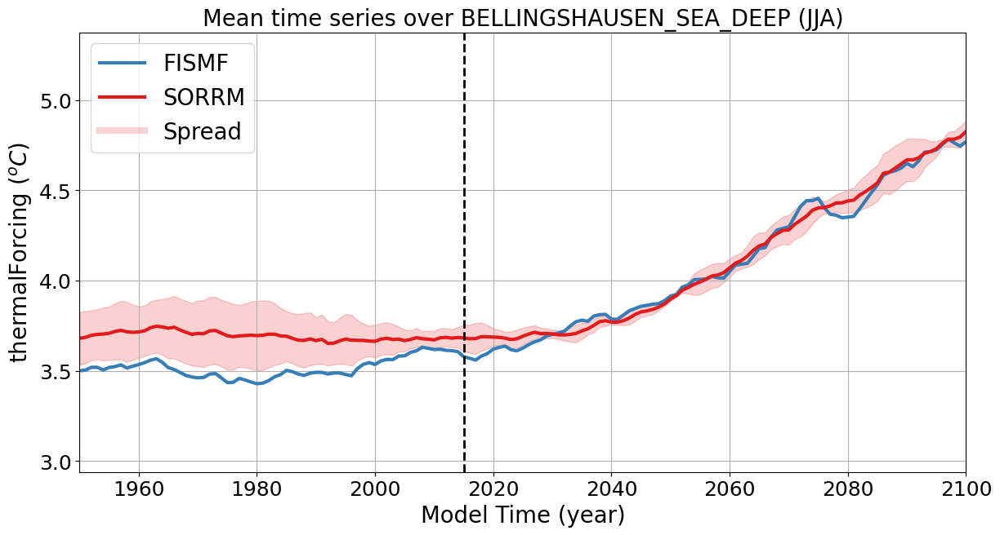

<Figure size 640x480 with 0 Axes>

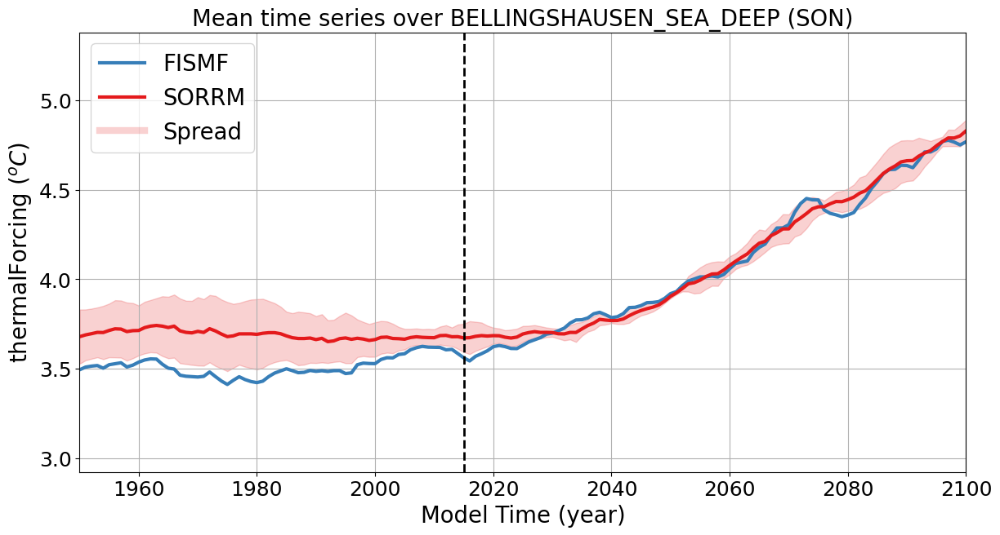

<Figure size 640x480 with 0 Axes>

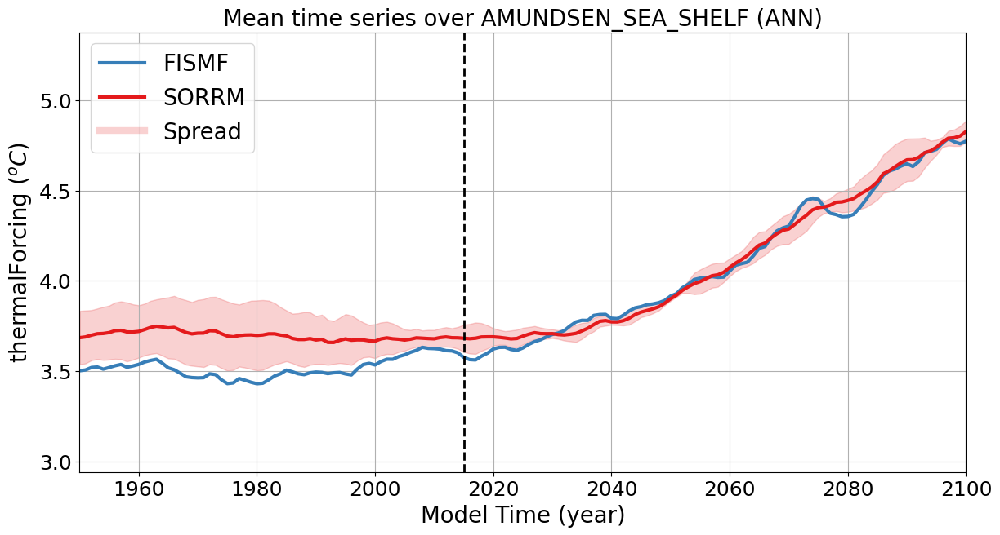

<Figure size 640x480 with 0 Axes>

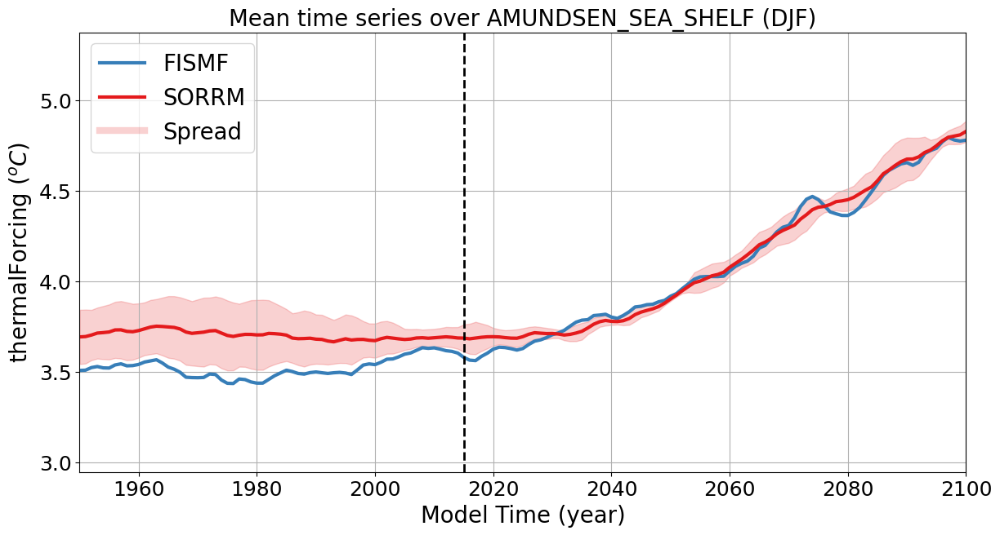

<Figure size 640x480 with 0 Axes>

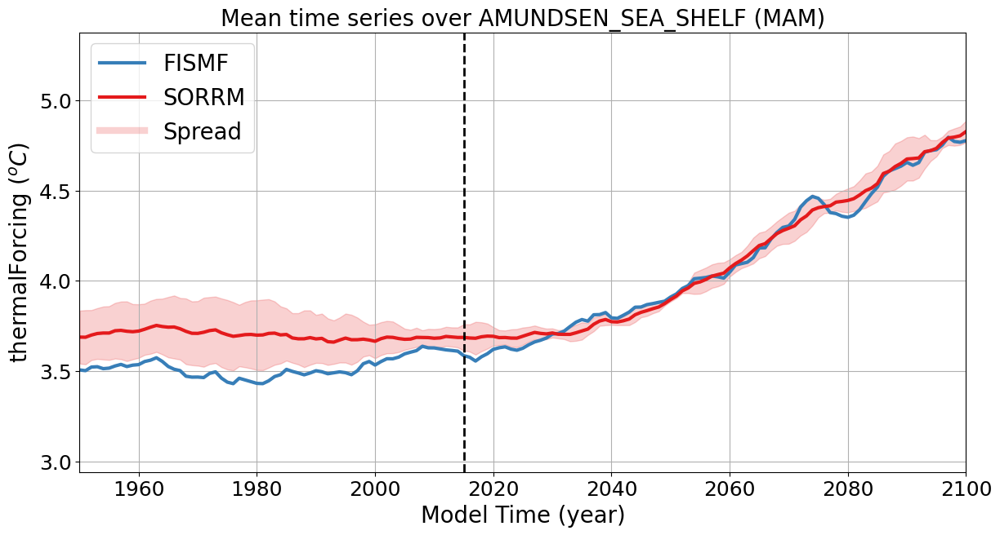

<Figure size 640x480 with 0 Axes>

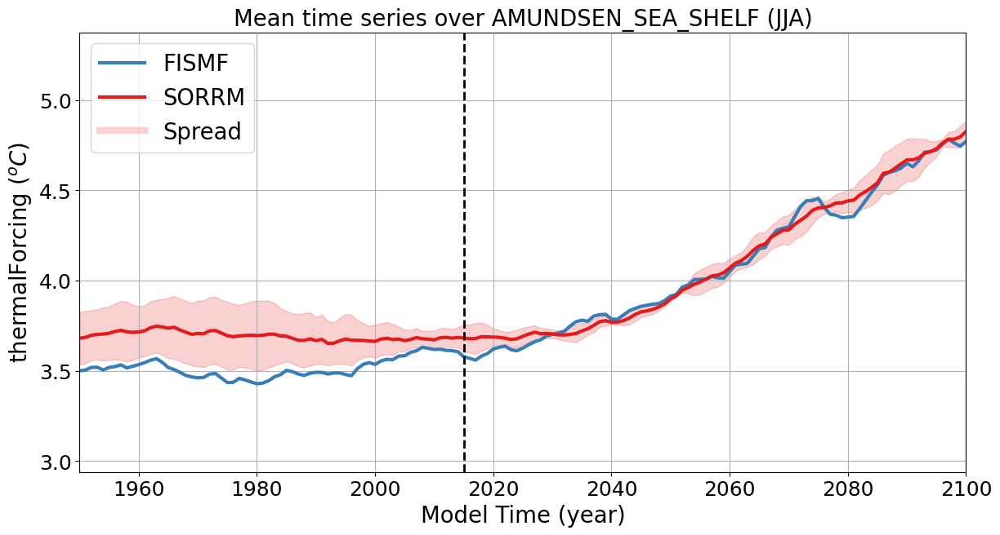

<Figure size 640x480 with 0 Axes>

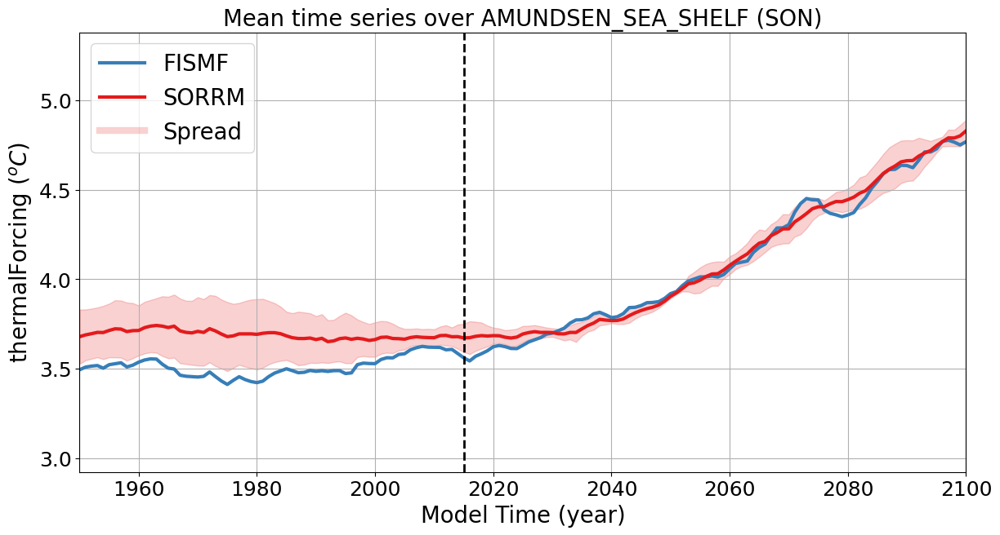

<Figure size 640x480 with 0 Axes>

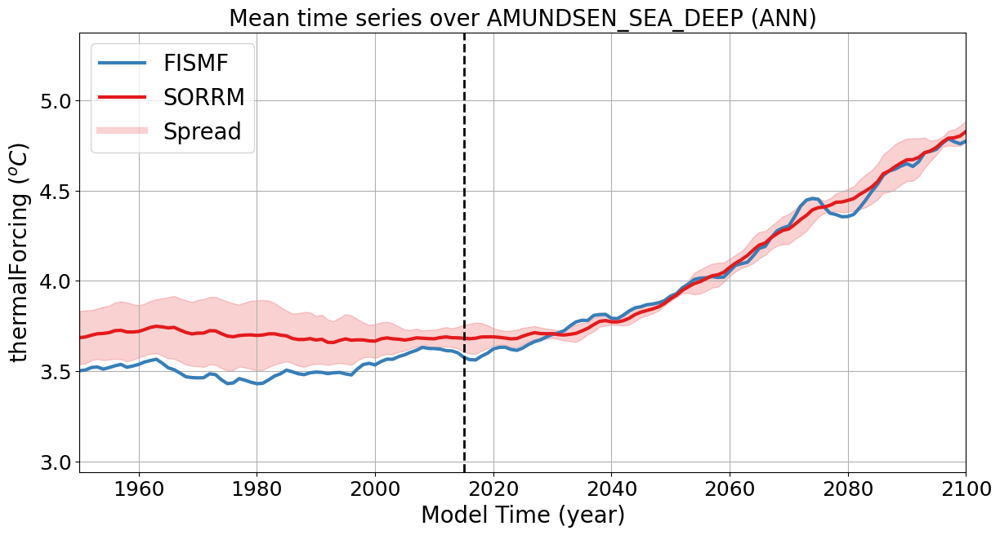

<Figure size 640x480 with 0 Axes>

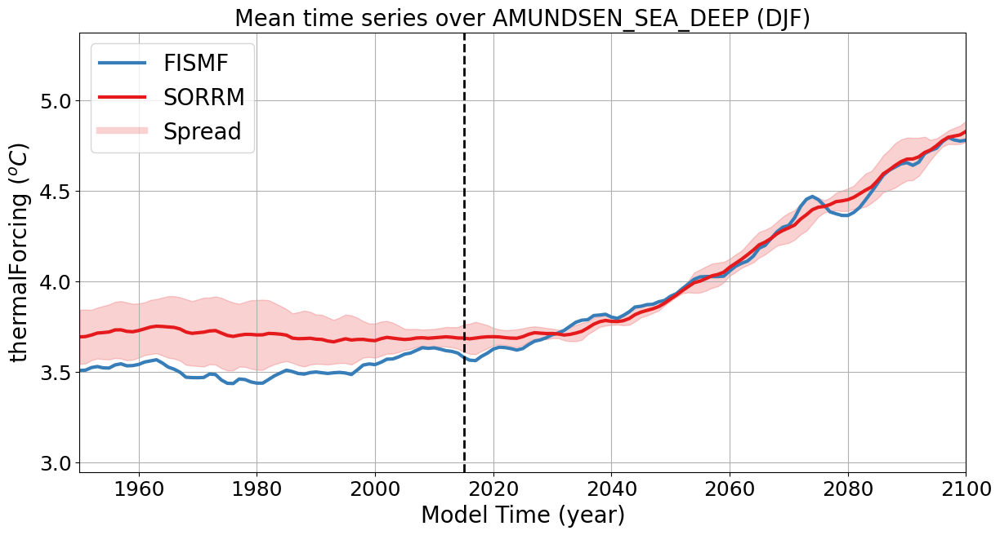

<Figure size 640x480 with 0 Axes>

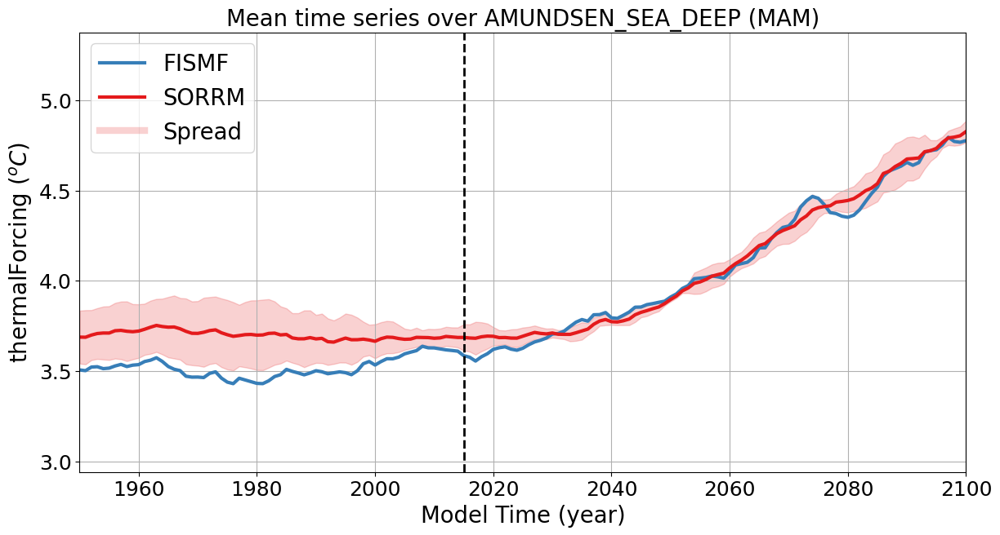

<Figure size 640x480 with 0 Axes>

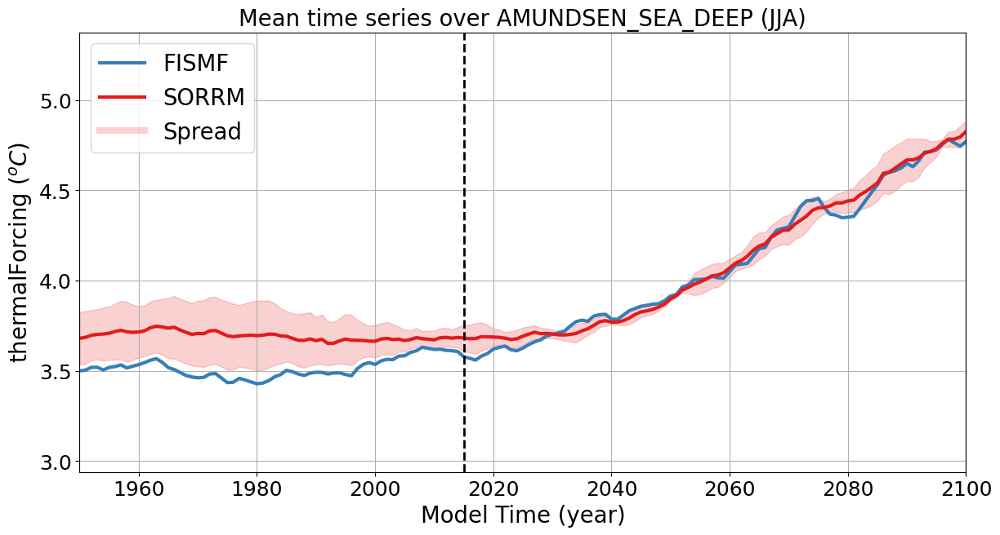

<Figure size 640x480 with 0 Axes>

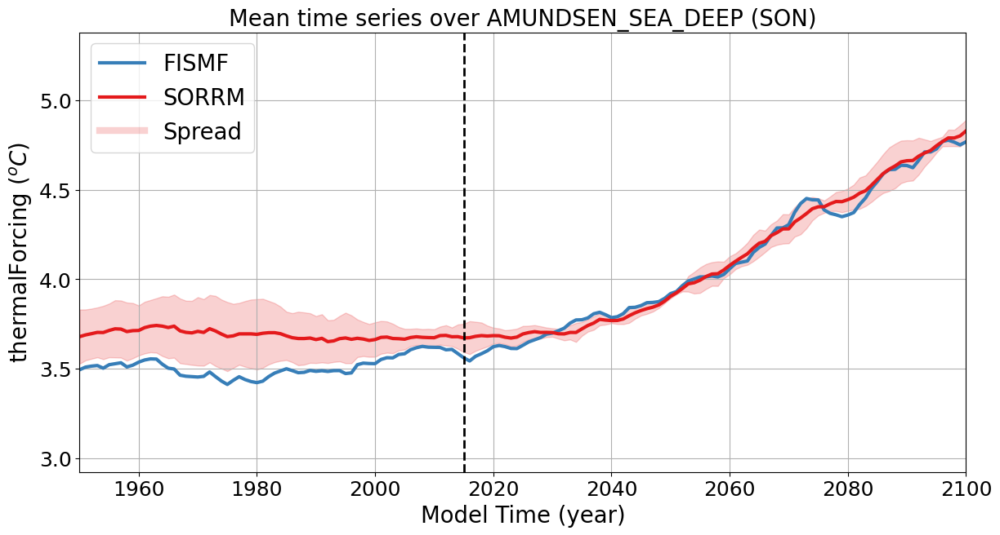

<Figure size 640x480 with 0 Axes>

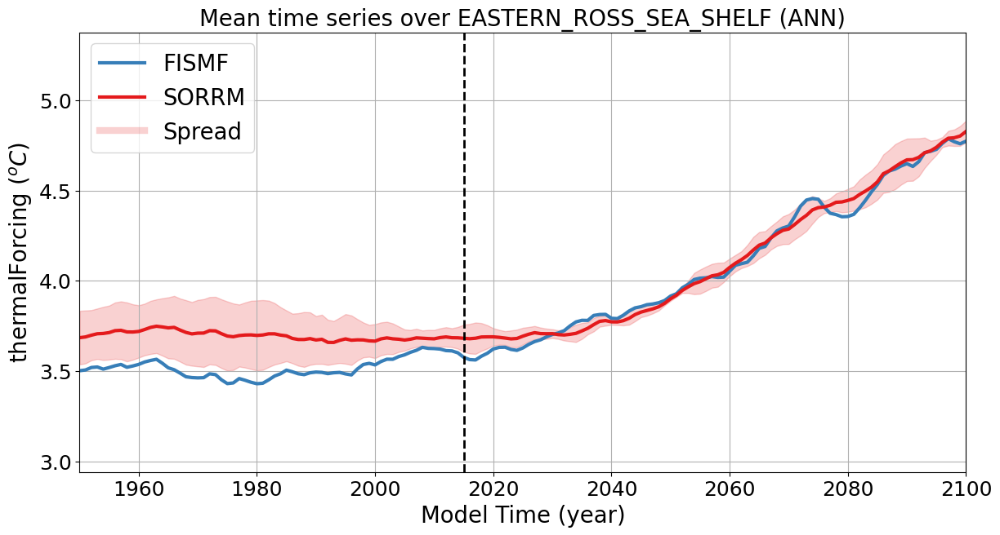

<Figure size 640x480 with 0 Axes>

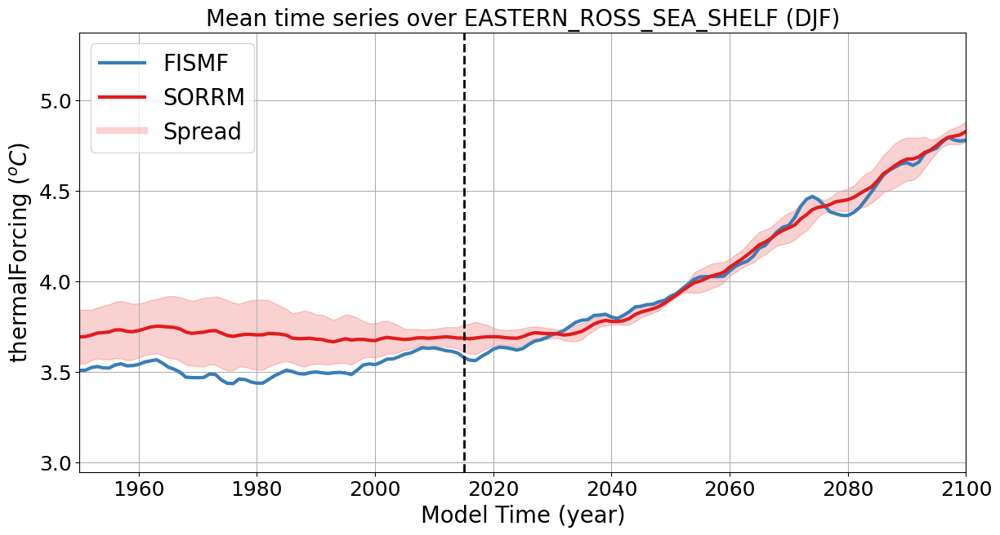

<Figure size 640x480 with 0 Axes>

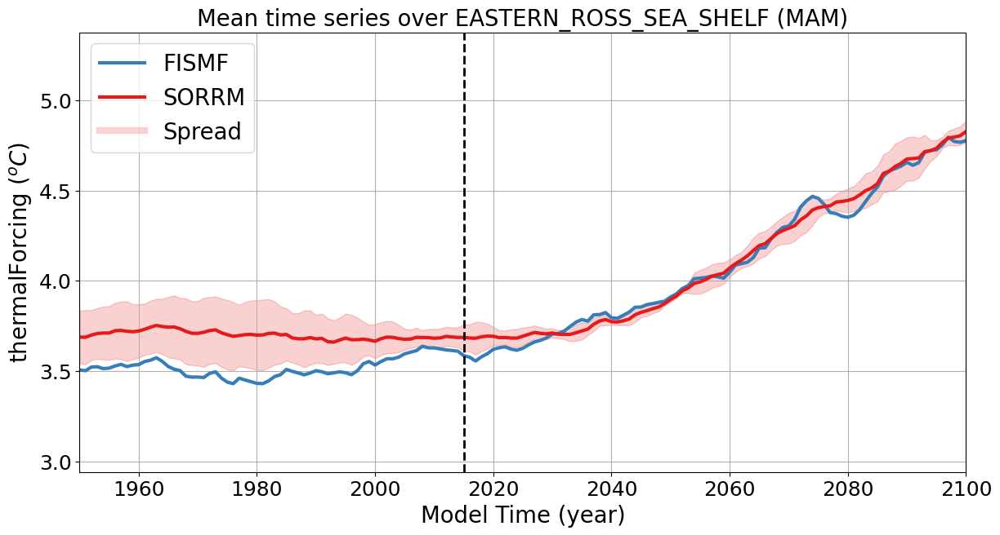

<Figure size 640x480 with 0 Axes>

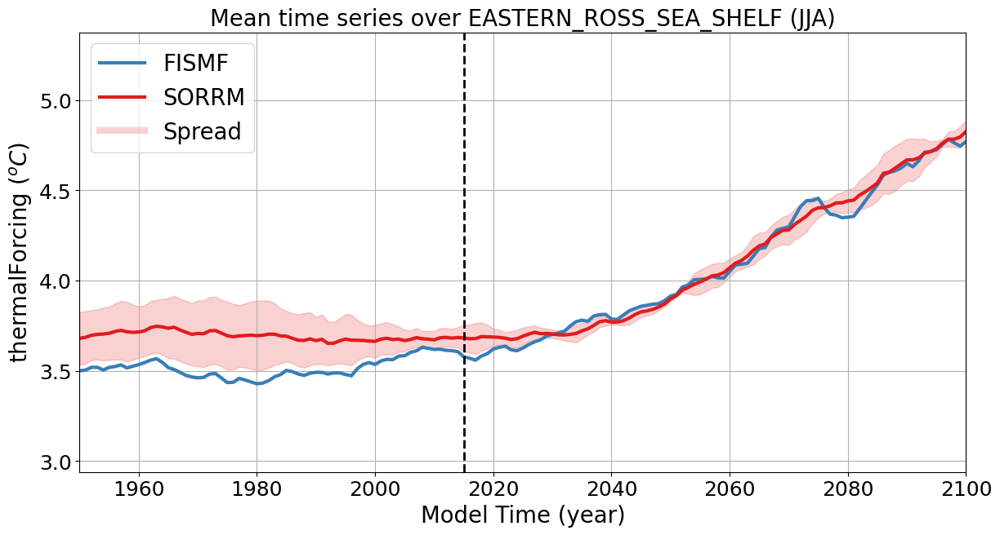

<Figure size 640x480 with 0 Axes>

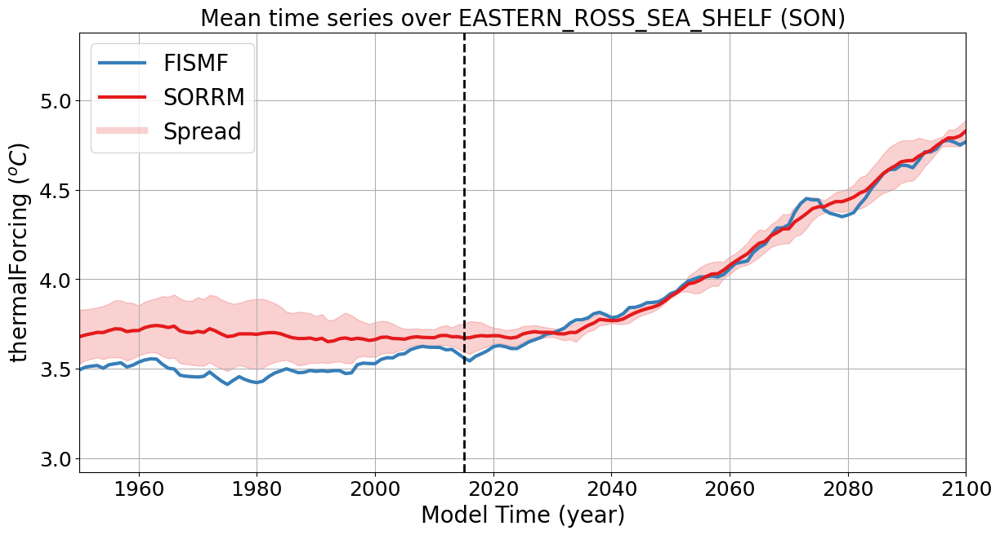

<Figure size 640x480 with 0 Axes>

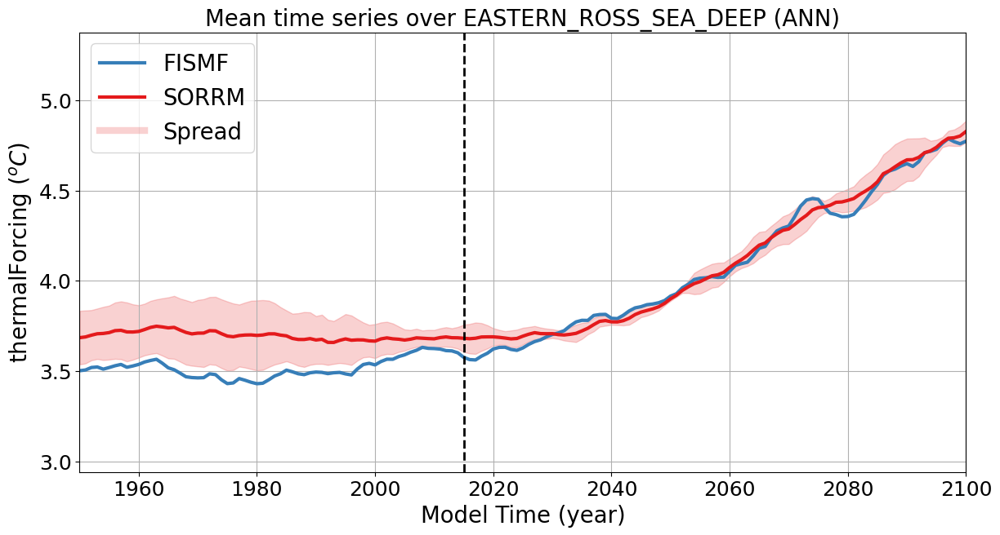

<Figure size 640x480 with 0 Axes>

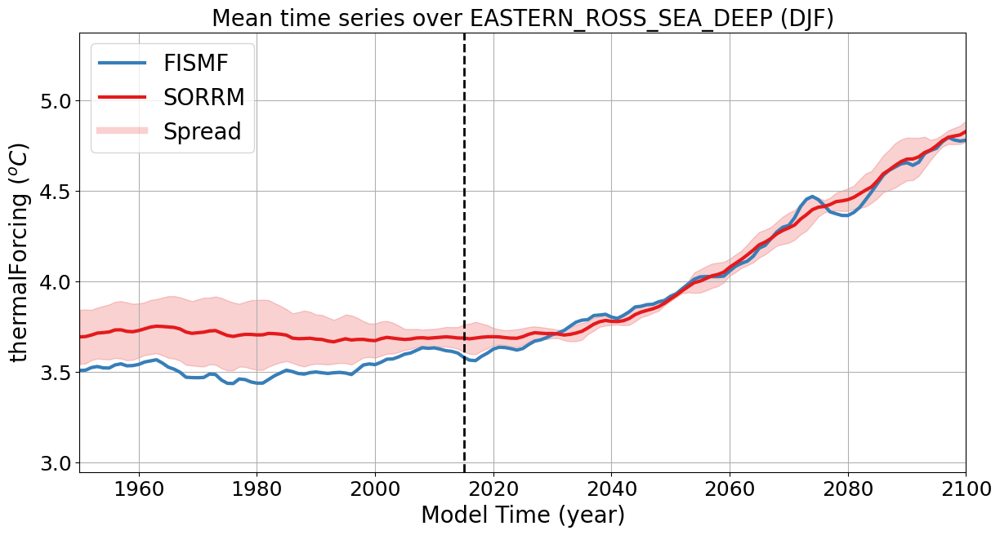

<Figure size 640x480 with 0 Axes>

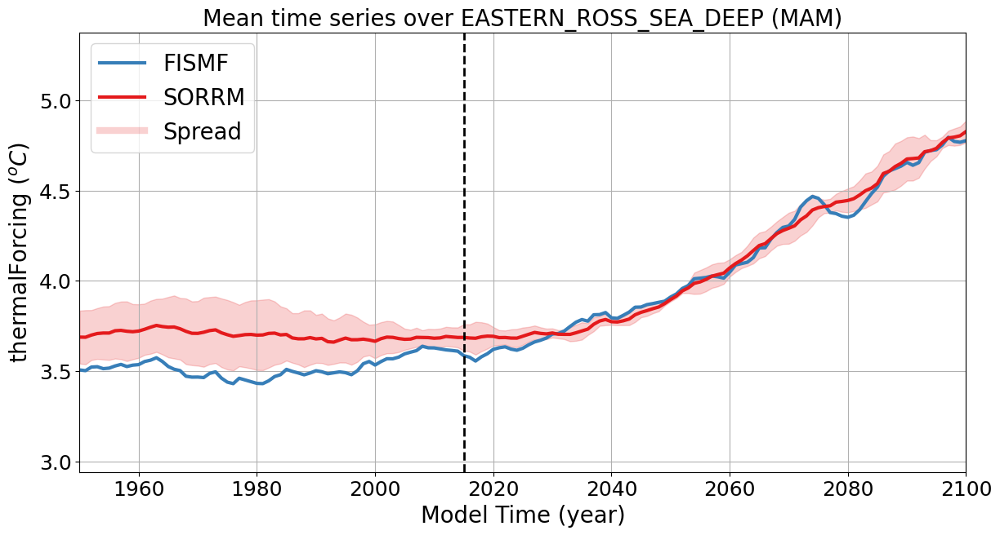

<Figure size 640x480 with 0 Axes>

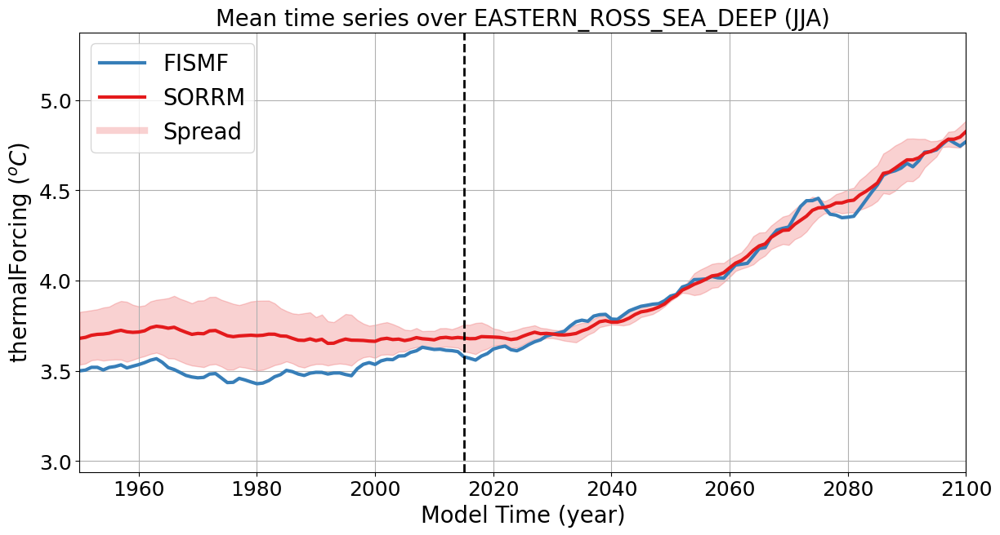

<Figure size 640x480 with 0 Axes>

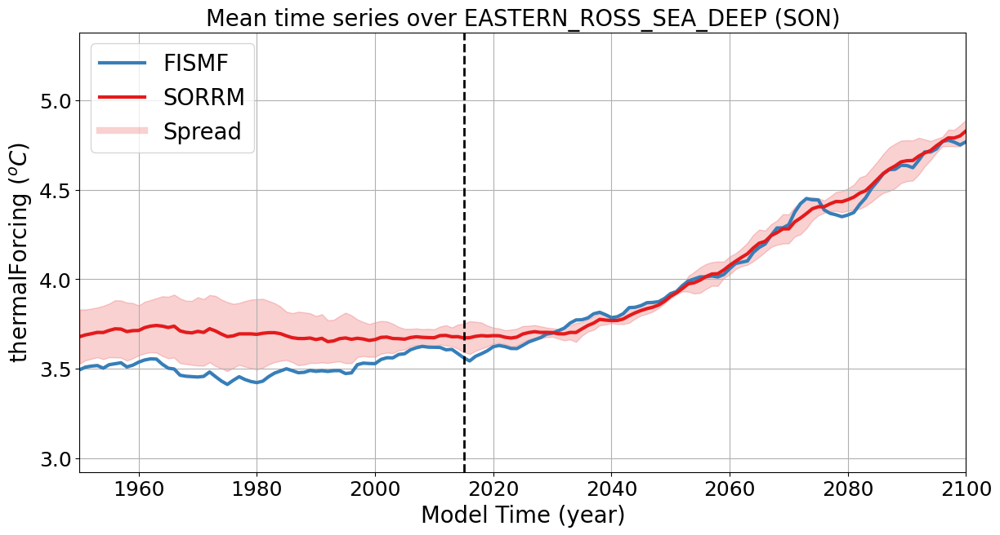

<Figure size 640x480 with 0 Axes>

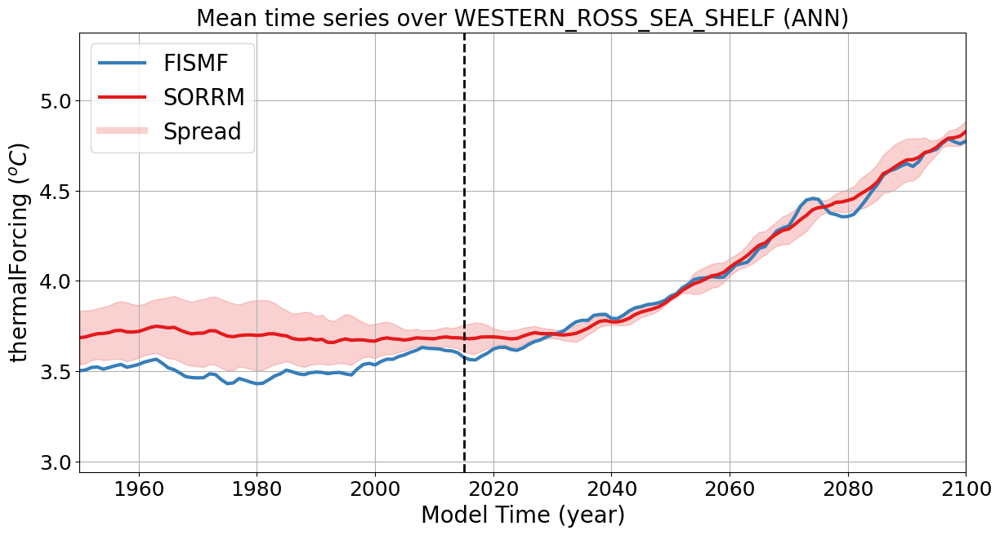

<Figure size 640x480 with 0 Axes>

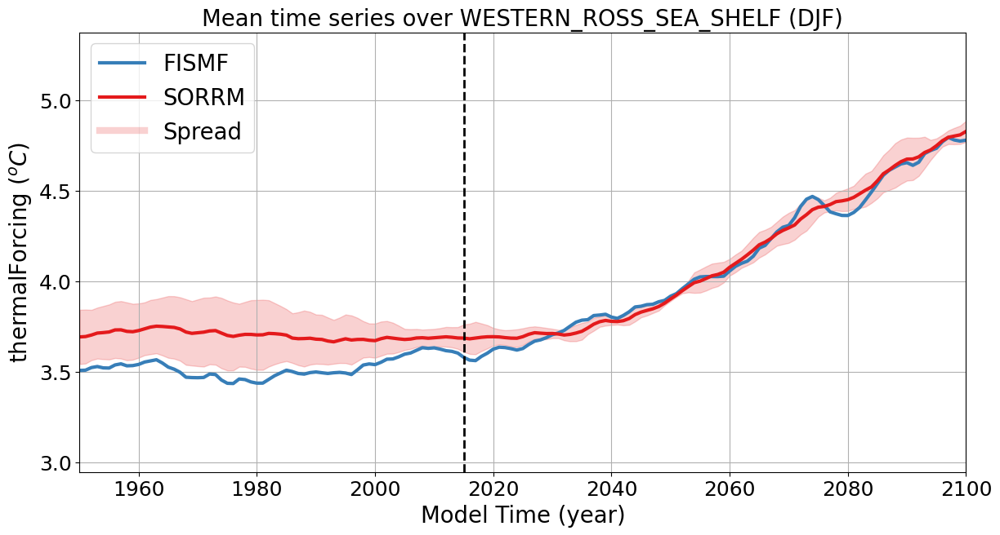

<Figure size 640x480 with 0 Axes>

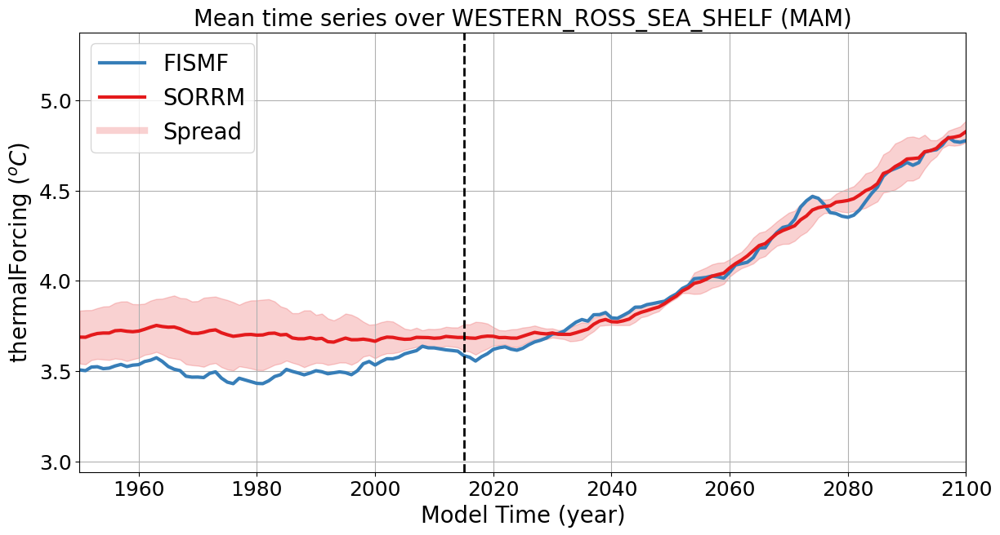

<Figure size 640x480 with 0 Axes>

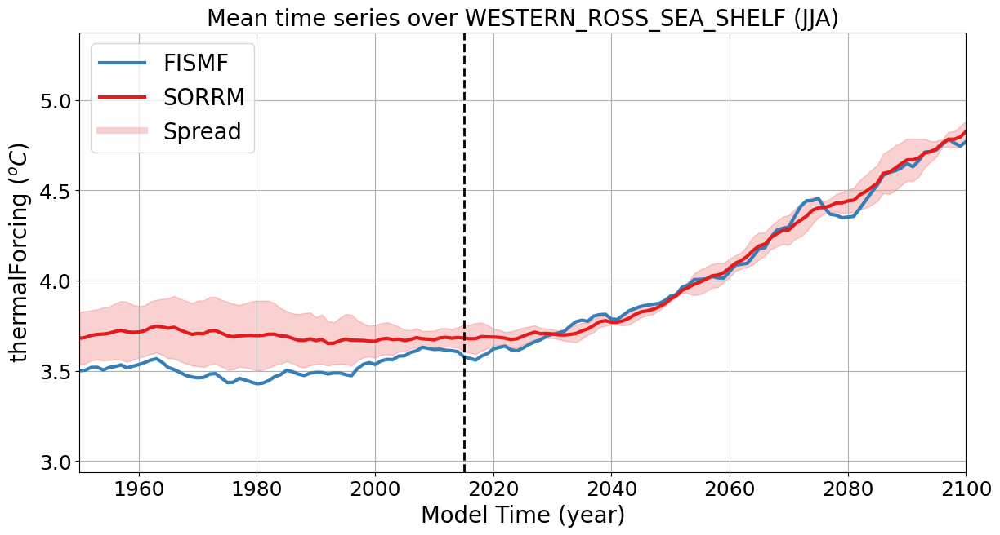

<Figure size 640x480 with 0 Axes>

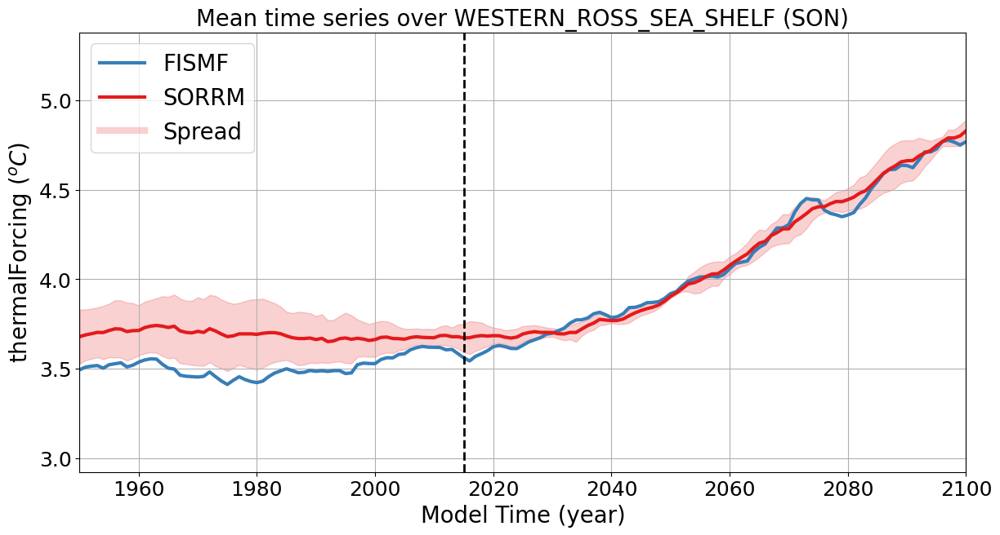

<Figure size 640x480 with 0 Axes>

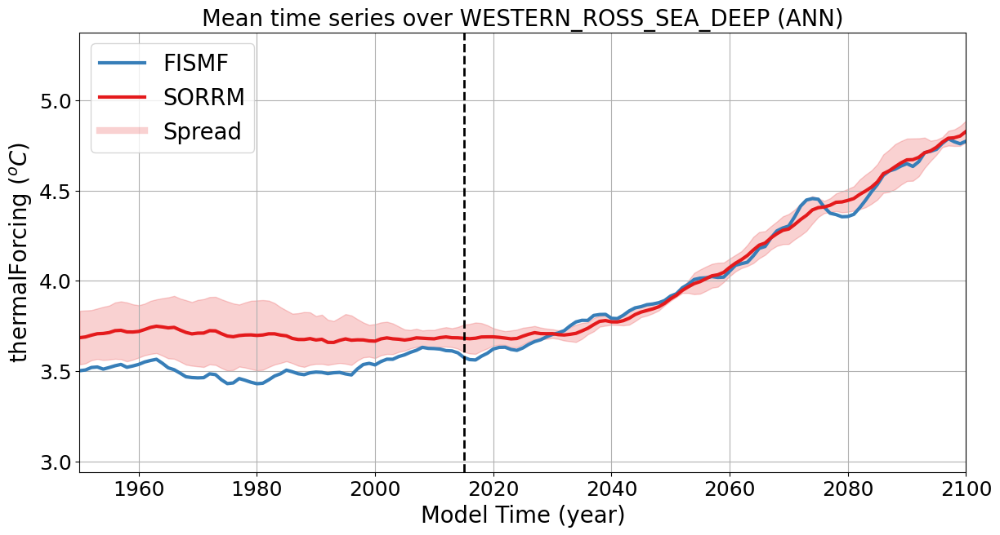

<Figure size 640x480 with 0 Axes>

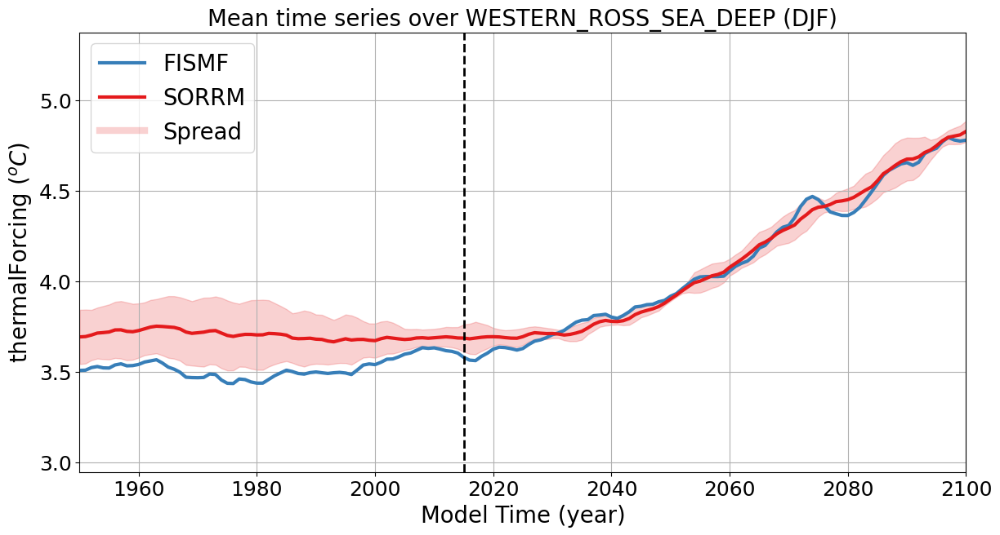

<Figure size 640x480 with 0 Axes>

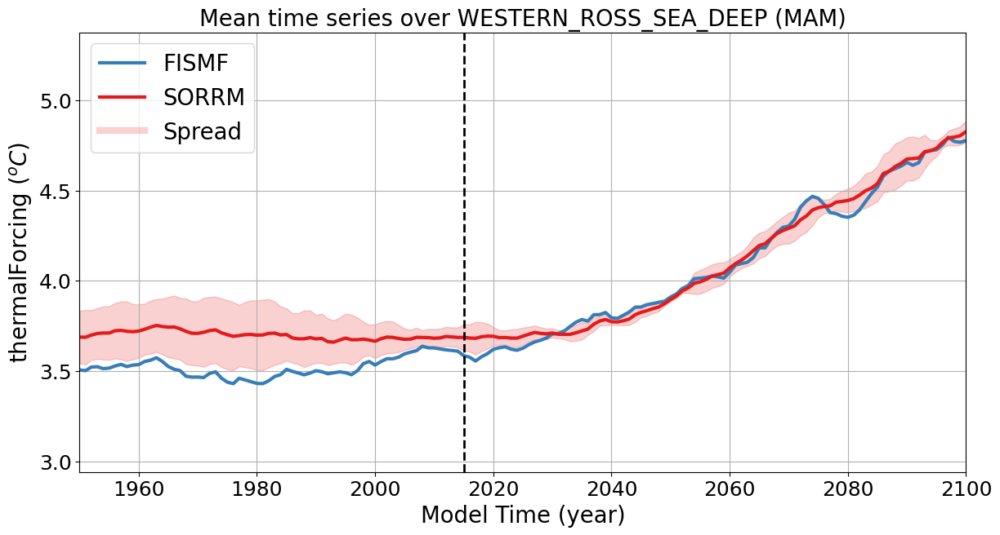

<Figure size 640x480 with 0 Axes>

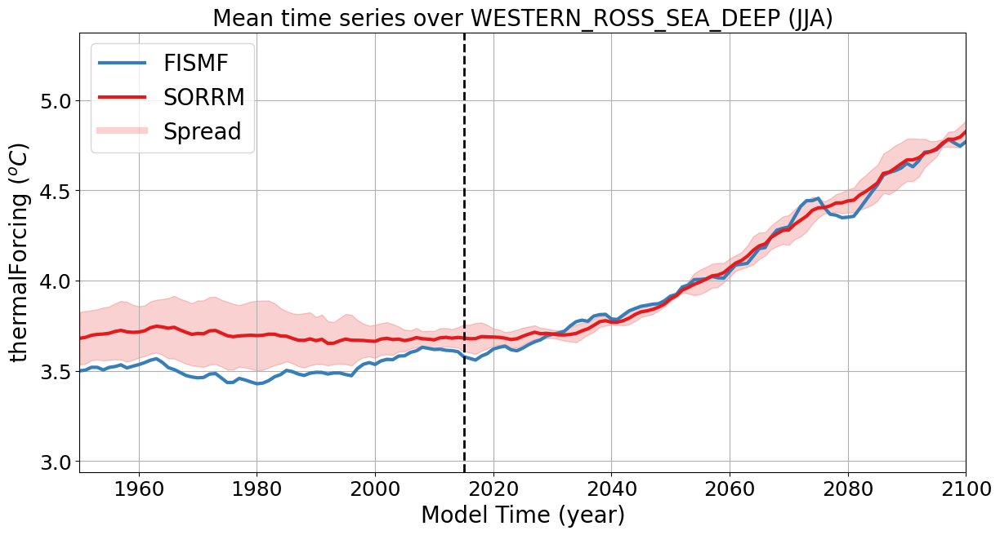

<Figure size 640x480 with 0 Axes>

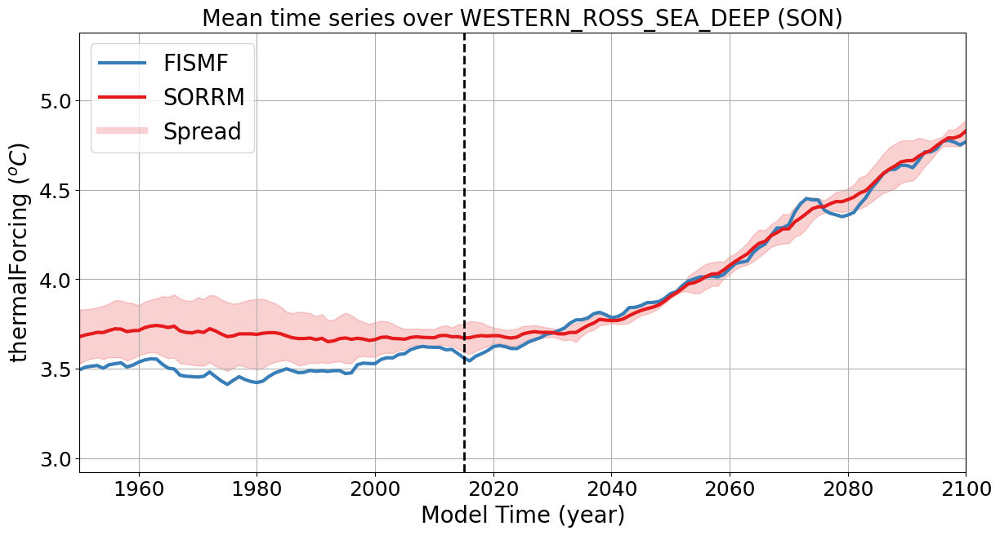

<Figure size 640x480 with 0 Axes>

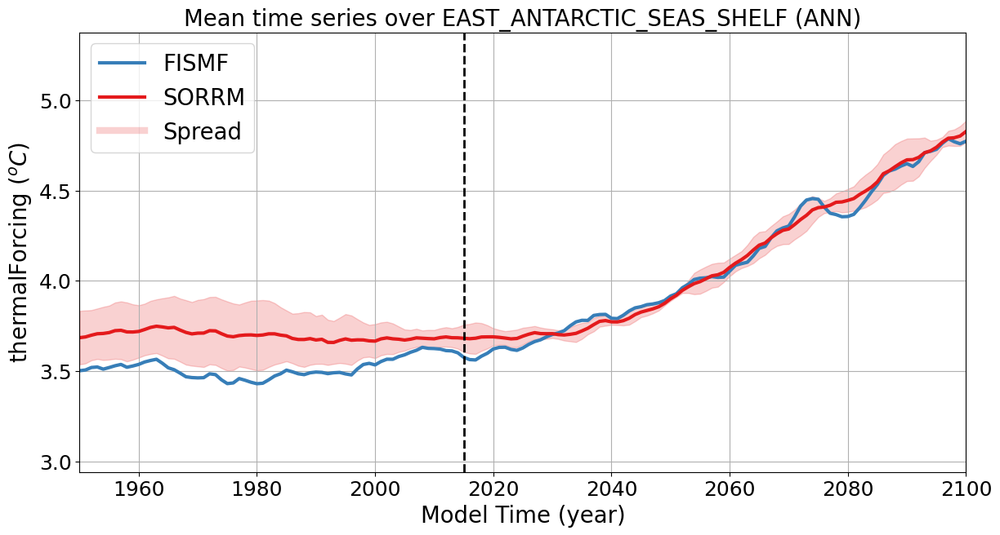

<Figure size 640x480 with 0 Axes>

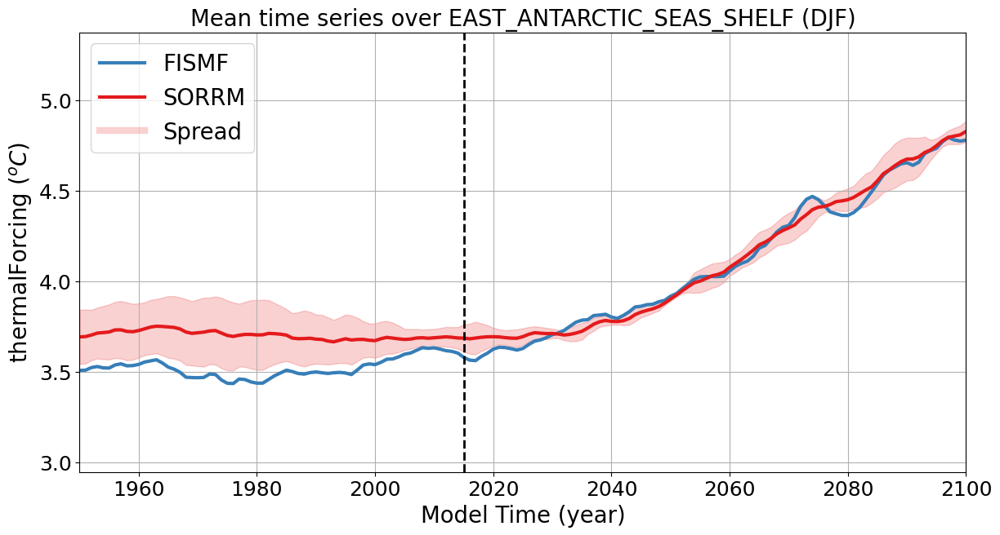

<Figure size 640x480 with 0 Axes>

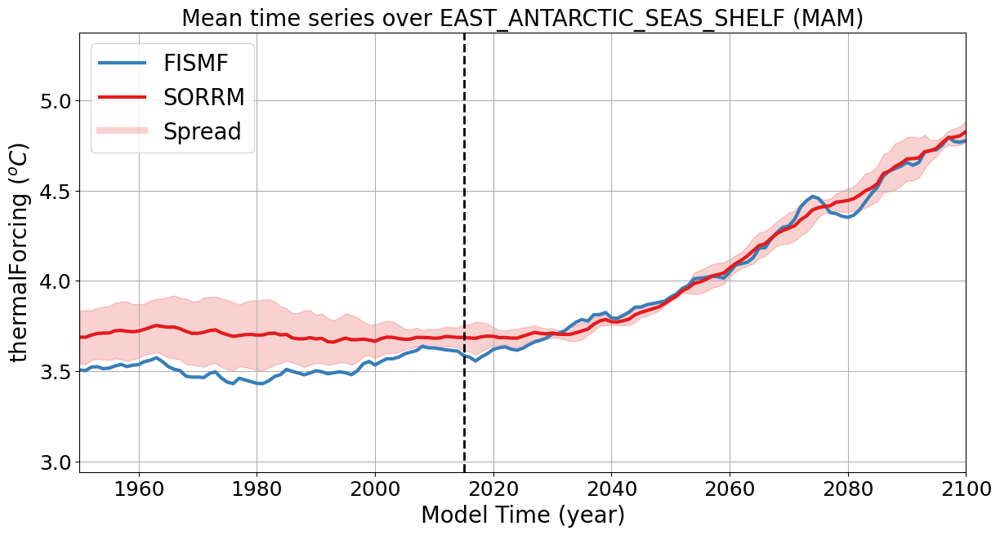

<Figure size 640x480 with 0 Axes>

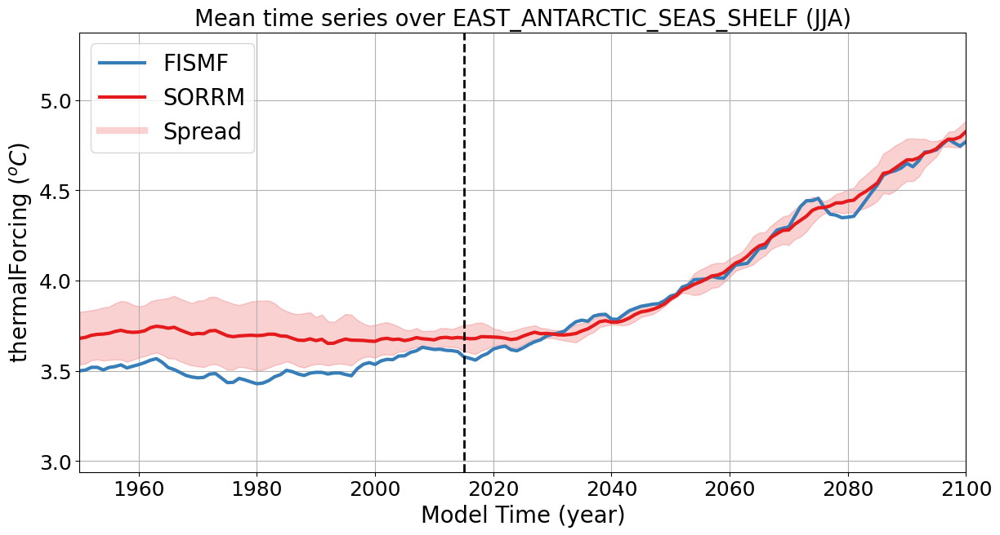

<Figure size 640x480 with 0 Axes>

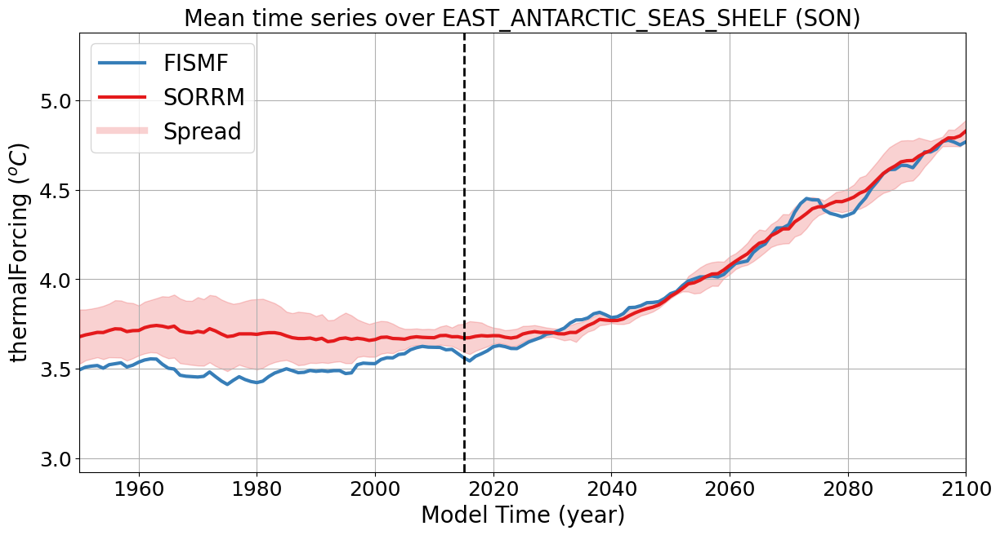

<Figure size 640x480 with 0 Axes>

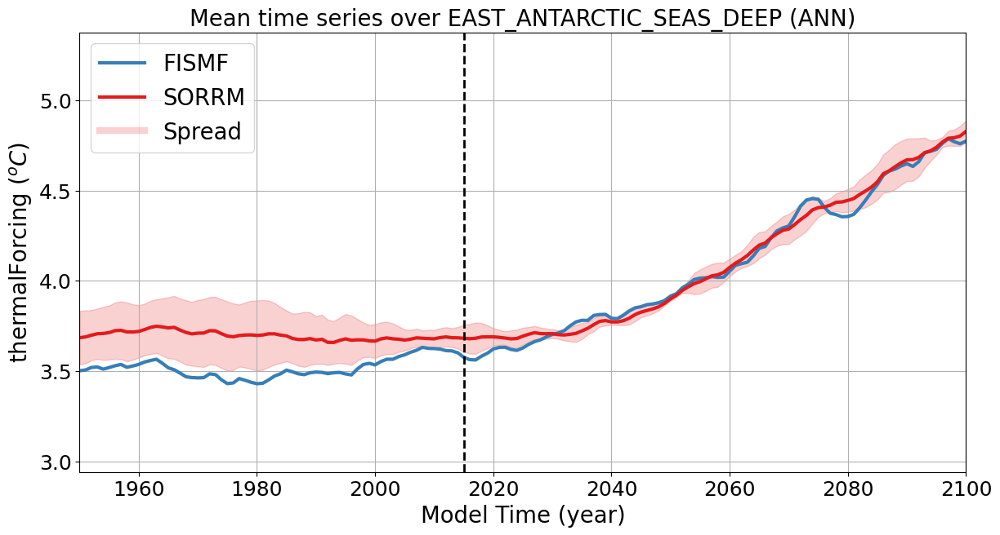

<Figure size 640x480 with 0 Axes>

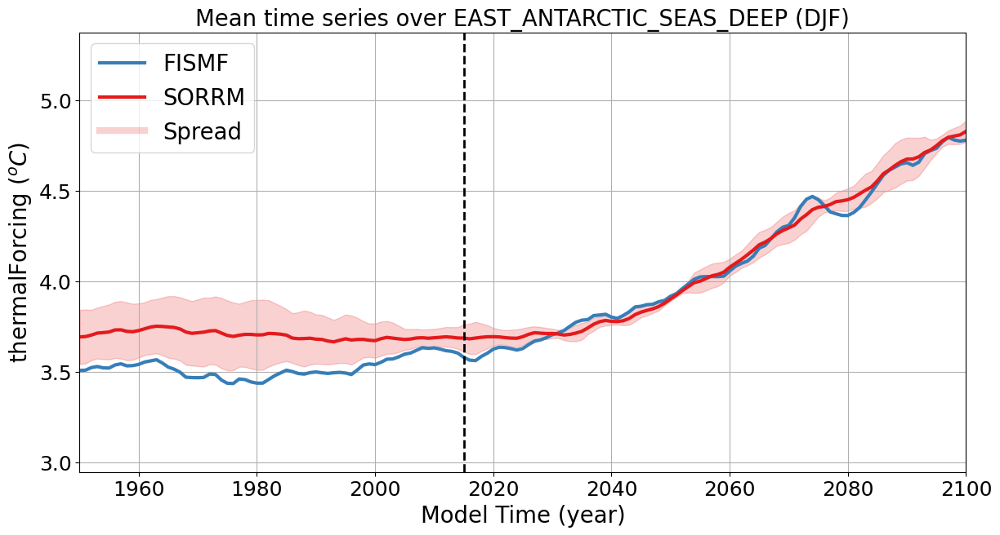

<Figure size 640x480 with 0 Axes>

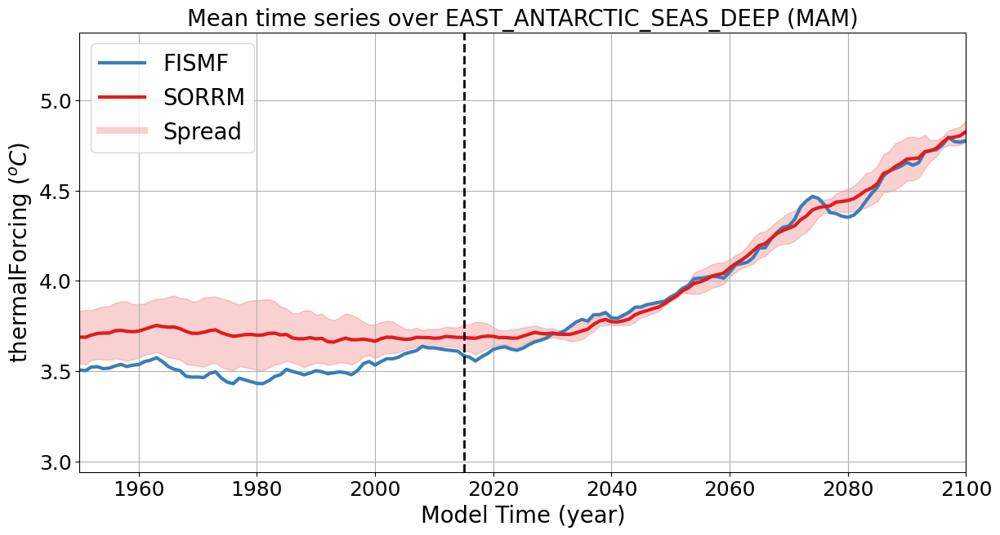

<Figure size 640x480 with 0 Axes>

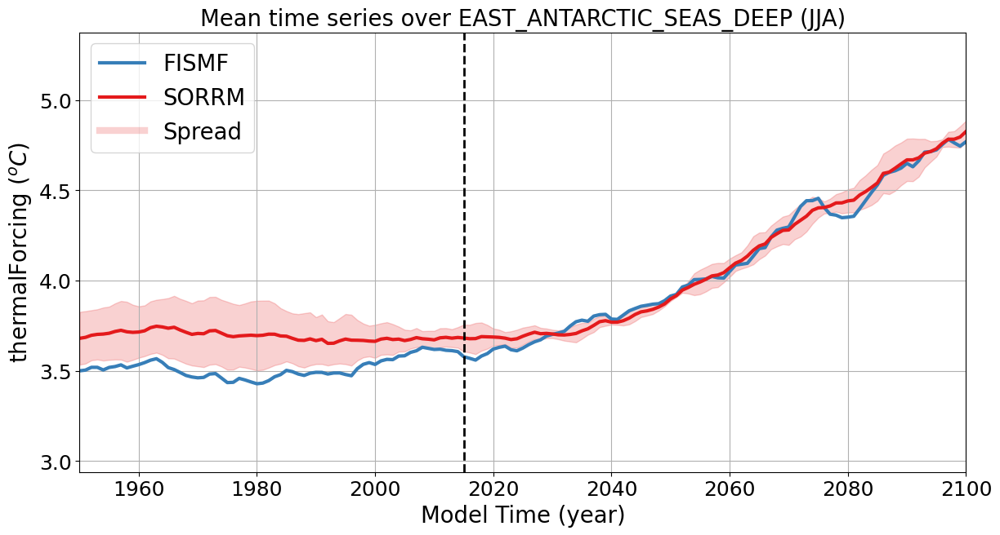

<Figure size 640x480 with 0 Axes>

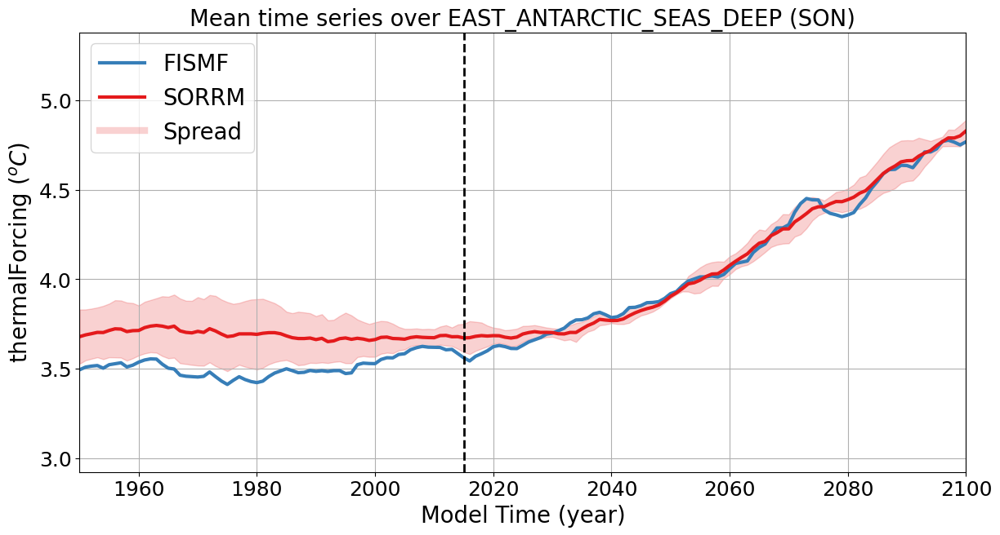

<Figure size 640x480 with 0 Axes>

In [113]:
if __name__ == "__main__":
    results_dir = "/lcrc/group/e3sm/ac.szhang/acme_scratch/e3sm_project/E3SMv21_testings/paper_material"
    top_dir = "/lcrc/group/acme/ac.szhang/acme_scratch/e3sm_project/E3SMv21_testings/paper_material"
    ts_path = os.path.join(top_dir,"fig_data","mpas_ts","raw_index")
    fig_dir = os.path.join(top_dir,"6_regional_analysis","metrics_plots","figure")
    exps = ["v2_1-SORRM.0701","v2_1-SORRM.0751","v2_1-SORRM.0801",'v2_1-SORRM-FISMF.0701']  
    seas = ['ANN','DJF','MAM','JJA','SON']

    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    
    mip = "e3sm"
    case_id = "mpas_ts"
    
    var = 'thermalForcing'
    varplt = "thermalForcing"
    varunt = "$^oC$"
    regions = ['Southern_Ocean','Southern_Ocean_60S',
               'Eastern_Weddell_Sea_Shelf','Eastern_Weddell_Sea_Deep',
               'Western_Weddell_Sea_Shelf','Western_Weddell_Sea_Deep',
               'Weddell_Sea_Shelf','Weddell_Sea_Deep',
               'Bellingshausen_Sea_Shelf','Bellingshausen_Sea_Deep',
               'Amundsen_Sea_Shelf','Amundsen_Sea_Deep',
               'Eastern_Ross_Sea_Shelf','Eastern_Ross_Sea_Deep',
               'Western_Ross_Sea_Shelf','Western_Ross_Sea_Deep',
               'East_Antarctic_Seas_Shelf','East_Antarctic_Seas_Deep']
    
    data_dict = {}
    for i,exp in enumerate(exps):
        fil1 =  os.path.join(ts_path,'{}.historical.{}.{}.{}.195001-201412.csv'.format(mip,exp,case_id,var))
        fil2 =  os.path.join(ts_path,'{}.ssp370.{}.{}.{}.201501-210012.csv'.format(mip,exp,case_id,var))
        if 'FISMF' in exp:
            fil1 = fil1.replace('-FISMF','')
        df1 = pd.read_csv(fil1)
        df2 = pd.read_csv(fil2)
        data = pd.concat([df1, df2], ignore_index=True)
        data.drop('time', axis=1, inplace=True)
        for sea in seas: 
            if sea in ['DJF']:
                sub_data  = data[data['month'].isin([12,1,2])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['JJA']:
                sub_data  = data[data['month'].isin([6,7,8])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['MAM']:
                sub_data  = data[data['month'].isin([3,4,5])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['SON']:
                sub_data  = data[data['month'].isin([9,10,11])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['ANN']:
                sub_data  = data
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['AC']:
                sub_data  = data
                datmn = sub_data.groupby(by=['month'],dropna=True).mean()
            if sea in ['Monthly']:
                sub_data  = data
                datmn = data
            #print(np.array(datmn.index))
            time = np.array(datmn.index) 
            for col in list(datmn.columns)[2:]:
                if col not in data_dict.keys():
                    data_dict[col] = {}
                if sea not in data_dict[col].keys():
                    data_dict[col][sea] = {}
                if exp not in data_dict[col][sea].keys():
                    data_dict[col][sea][exp] = {} 
                data_dict[col][sea][exp] = datmn[col]    
        del(df1,df2,data,datmn)
    
    #plot
    for region in regions: 
        for sea in seas:
            data = data_dict[col][sea]
            plot_time_series(varplt,varunt,region,sea,exps,time,data,fig_dir)
            

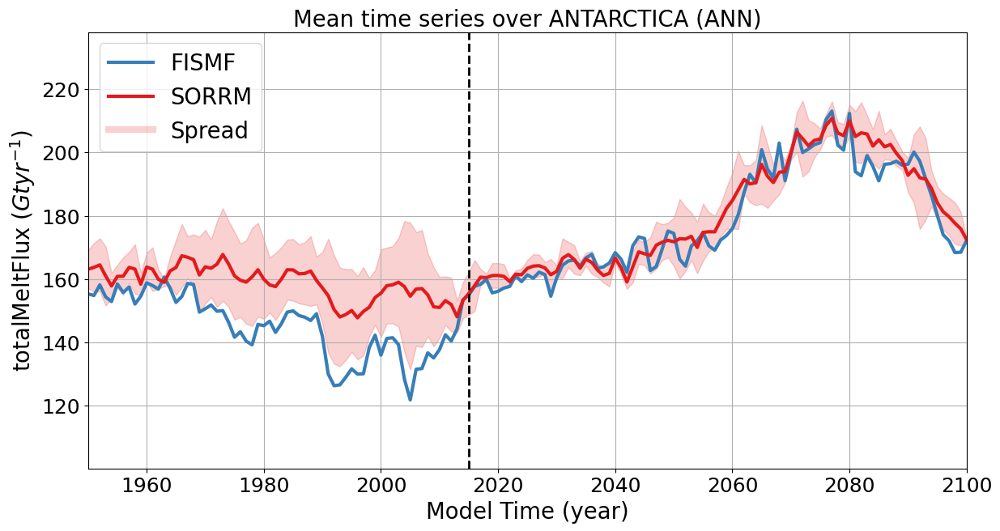

<Figure size 640x480 with 0 Axes>

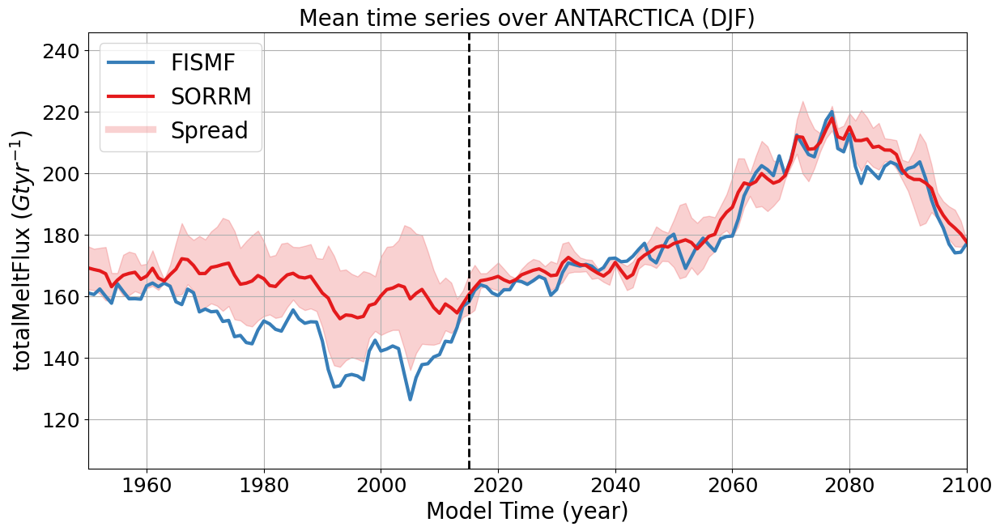

<Figure size 640x480 with 0 Axes>

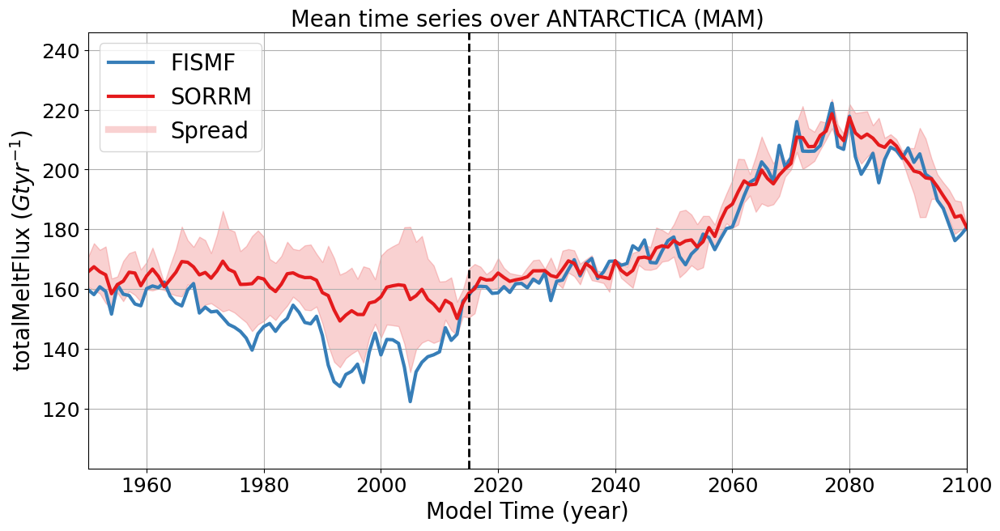

<Figure size 640x480 with 0 Axes>

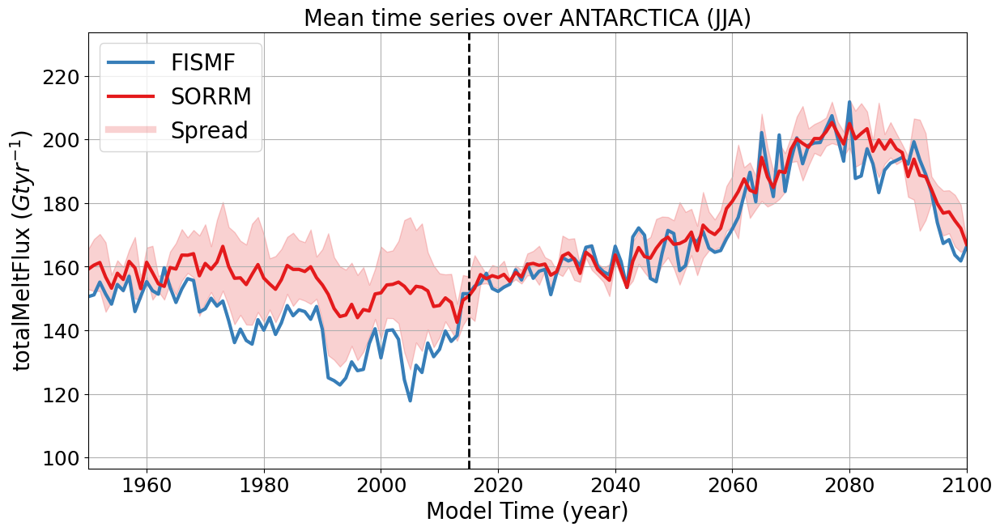

<Figure size 640x480 with 0 Axes>

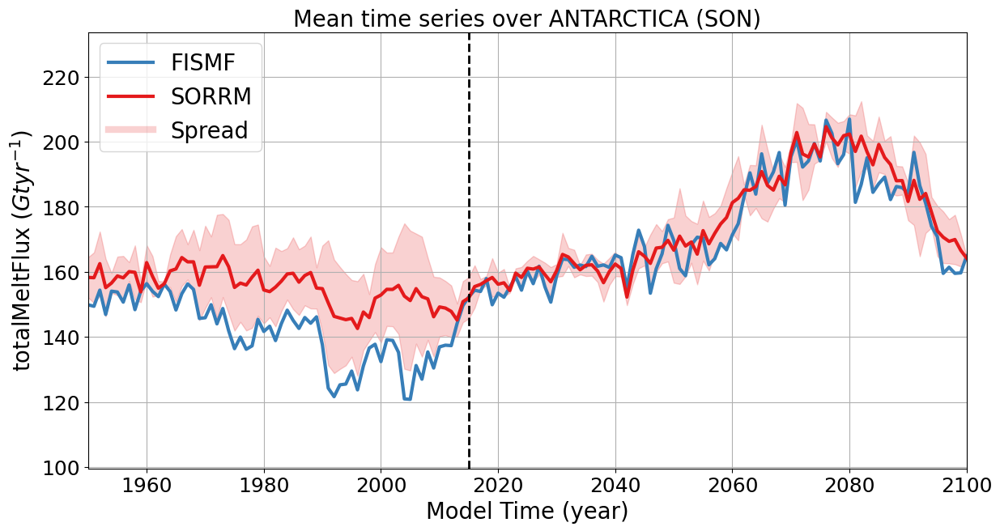

<Figure size 640x480 with 0 Axes>

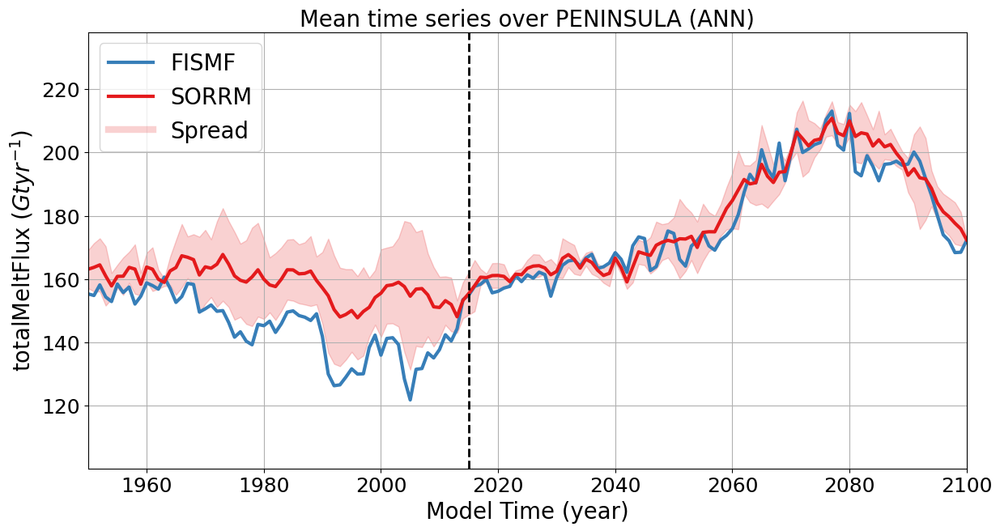

<Figure size 640x480 with 0 Axes>

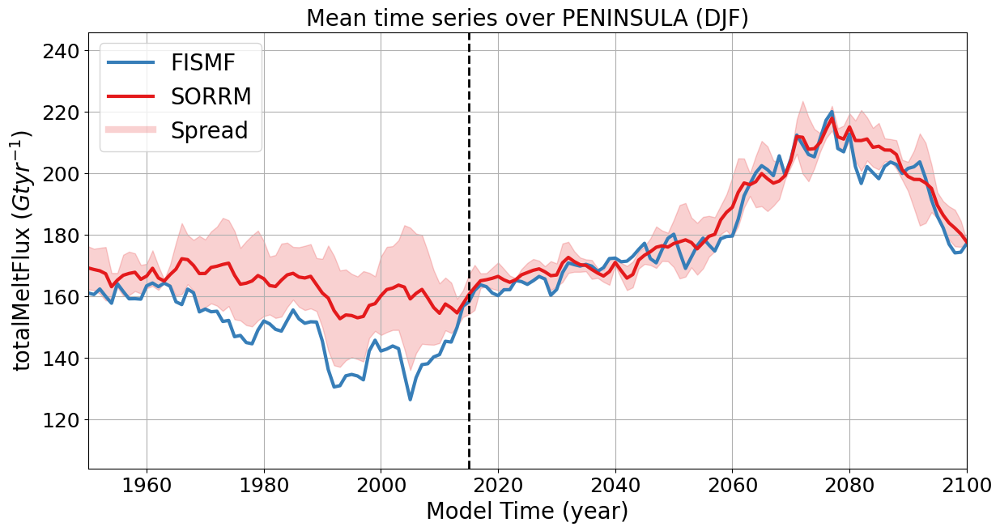

<Figure size 640x480 with 0 Axes>

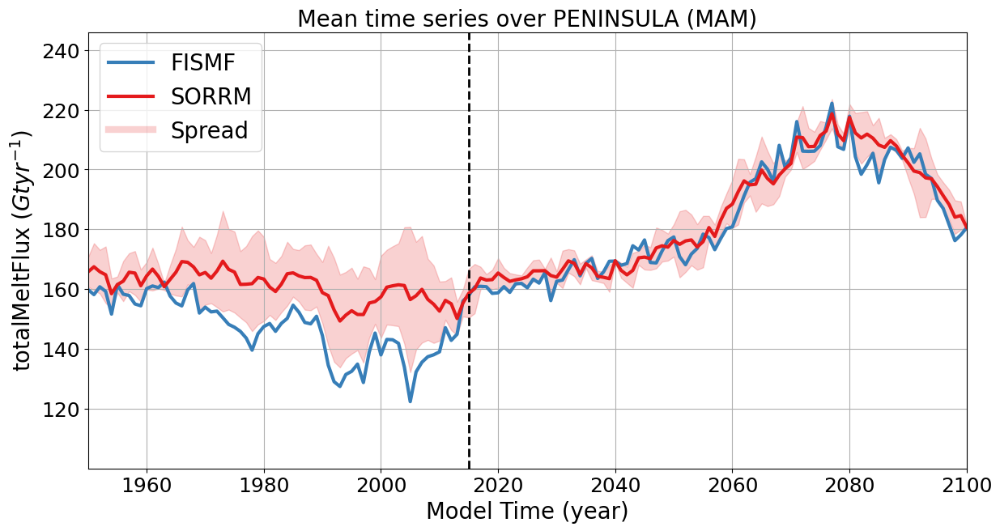

<Figure size 640x480 with 0 Axes>

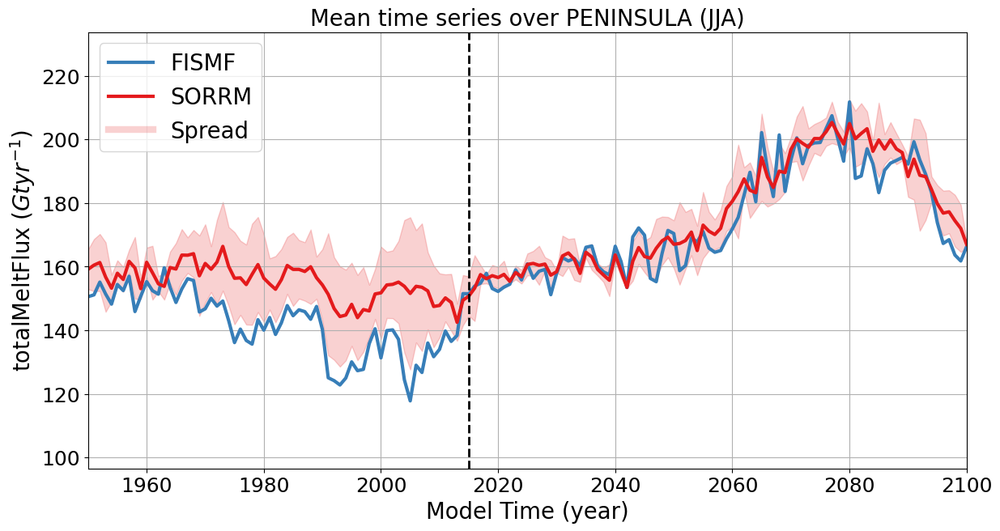

<Figure size 640x480 with 0 Axes>

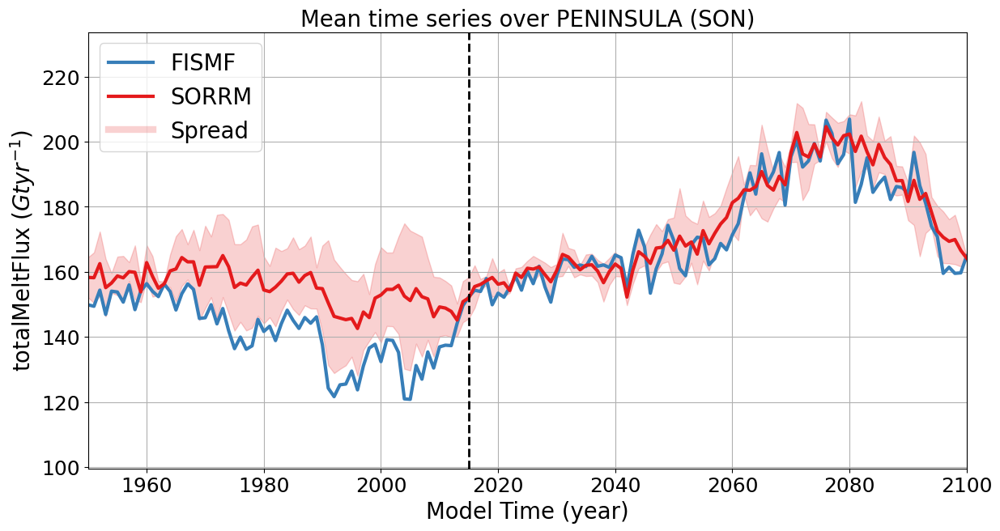

<Figure size 640x480 with 0 Axes>

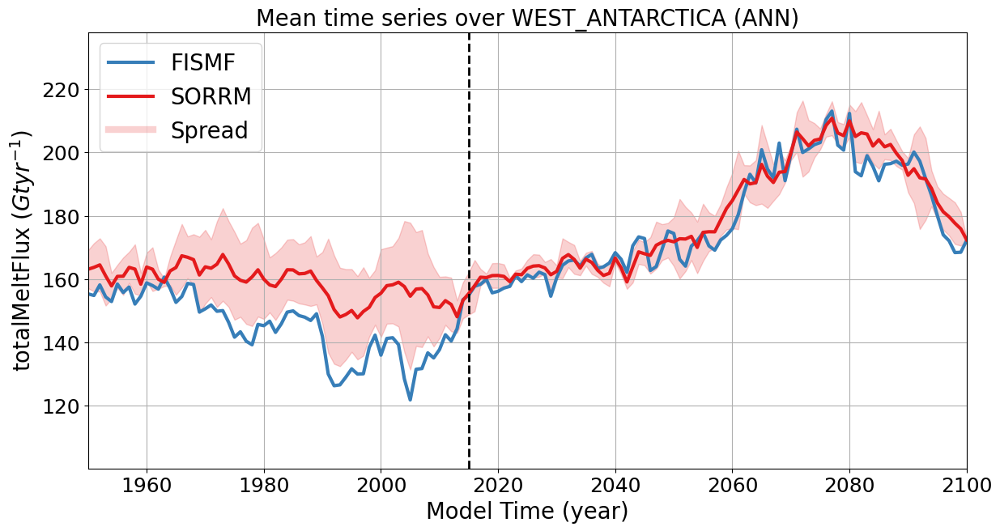

<Figure size 640x480 with 0 Axes>

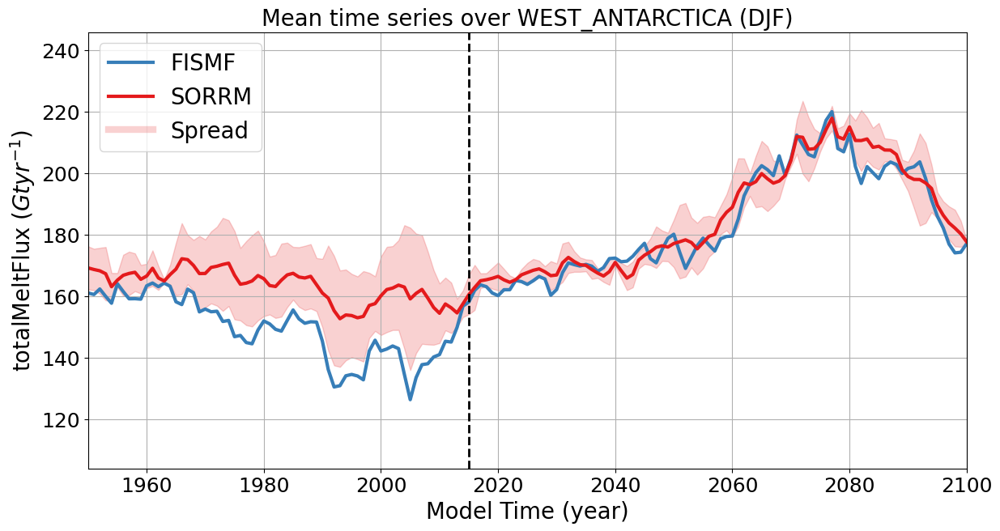

<Figure size 640x480 with 0 Axes>

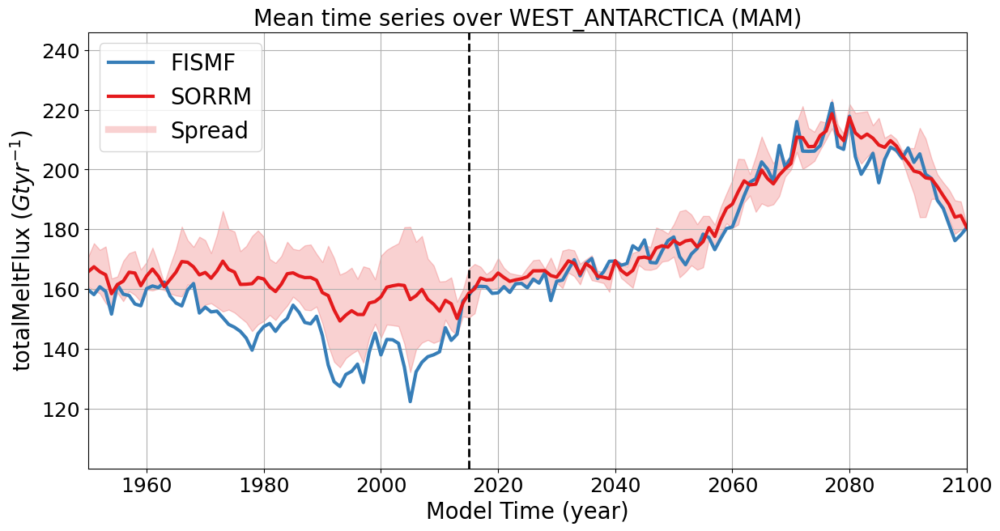

<Figure size 640x480 with 0 Axes>

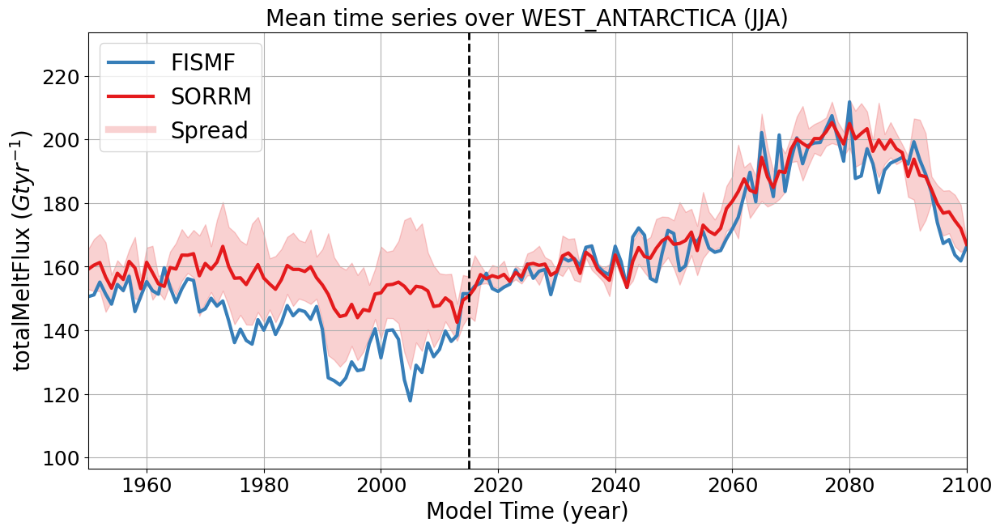

<Figure size 640x480 with 0 Axes>

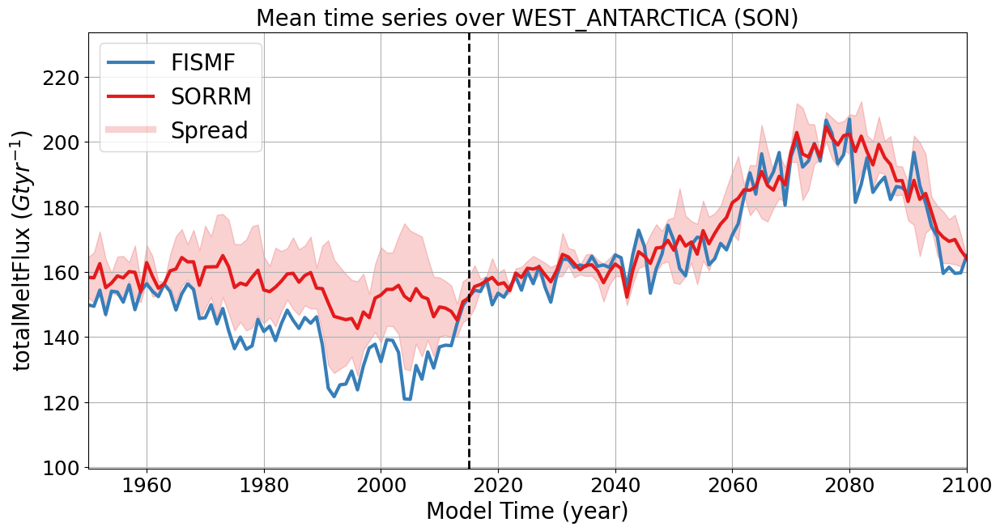

<Figure size 640x480 with 0 Axes>

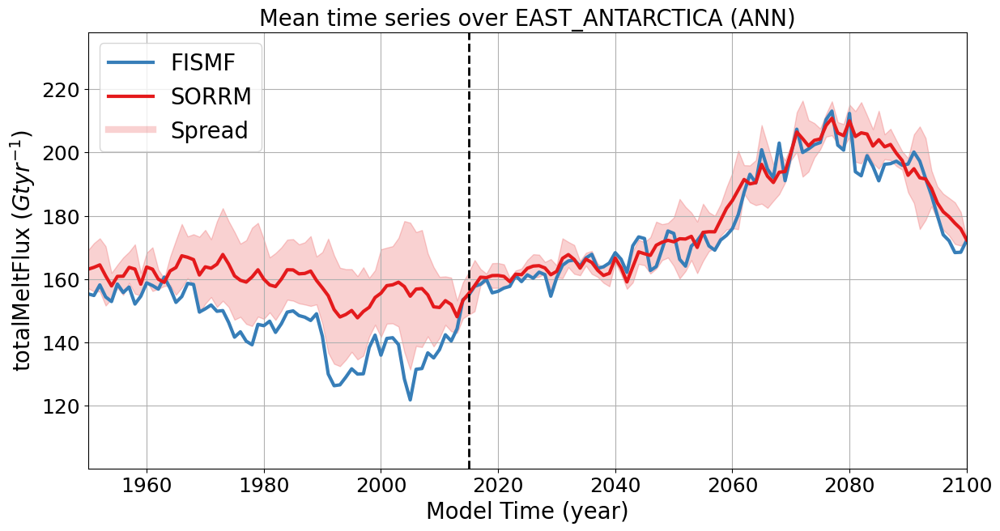

<Figure size 640x480 with 0 Axes>

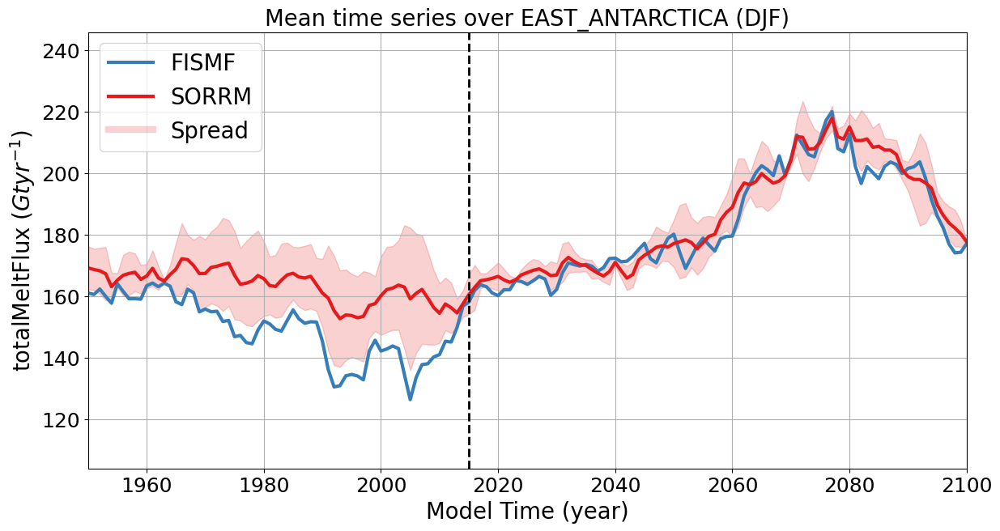

<Figure size 640x480 with 0 Axes>

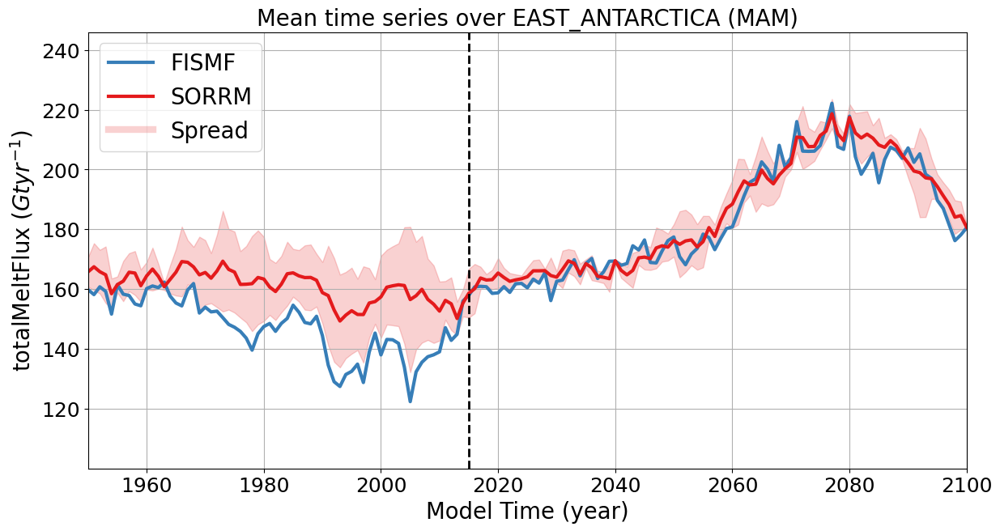

<Figure size 640x480 with 0 Axes>

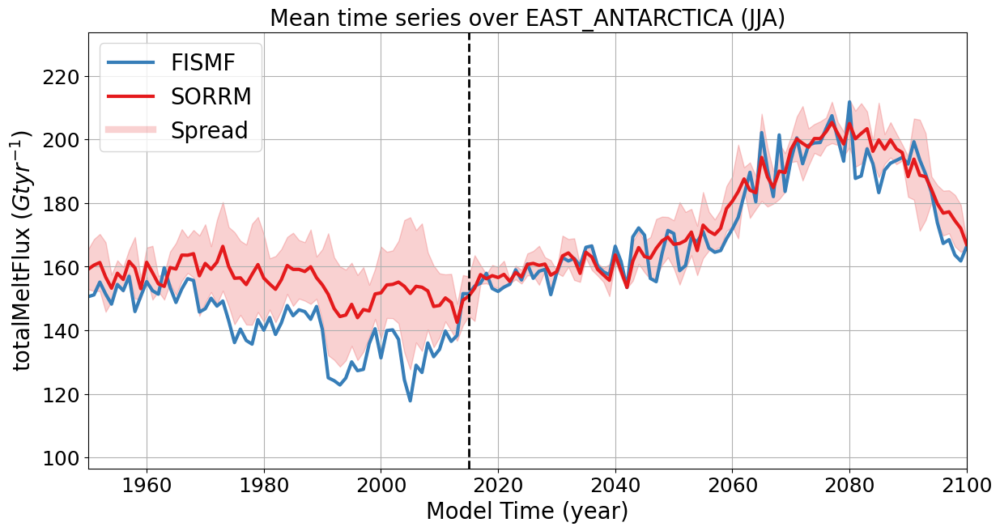

<Figure size 640x480 with 0 Axes>

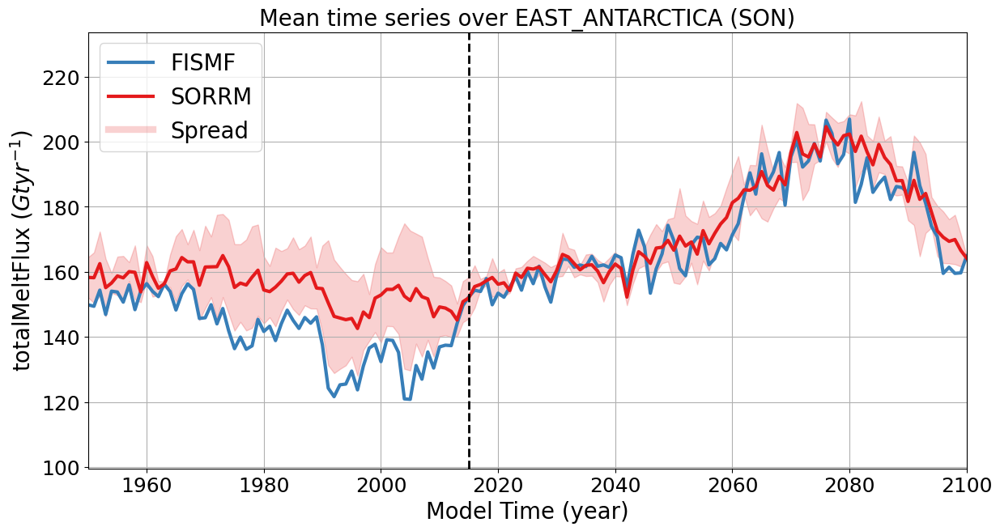

<Figure size 640x480 with 0 Axes>

In [111]:
if __name__ == "__main__":
    results_dir = "/lcrc/group/e3sm/ac.szhang/acme_scratch/e3sm_project/E3SMv21_testings/paper_material"
    top_dir = "/lcrc/group/acme/ac.szhang/acme_scratch/e3sm_project/E3SMv21_testings/paper_material"
    ts_path = os.path.join(top_dir,"fig_data","mpas_ts","raw_index")
    fig_dir = os.path.join(top_dir,"6_regional_analysis","metrics_plots","figure")
    exps = ["v2_1-SORRM.0701","v2_1-SORRM.0751","v2_1-SORRM.0801",'v2_1-SORRM-FISMF.0701']  
    seas = ['ANN','DJF','MAM','JJA','SON']

    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    
    mip = "e3sm"
    case_id = "mpas_ts"
    
    var = 'totalMeltFlux'
    varplt = "totalMeltFlux"
    varunt = "$Gt yr^{-1}$"
    regions = ['Antarctica','Peninsula','West_Antarctica','East_Antarctica']
    
    data_dict = {}
    for i,exp in enumerate(exps):
        fil1 =  os.path.join(ts_path,'{}.historical.{}.{}.{}.195001-201412.csv'.format(mip,exp,case_id,var))
        fil2 =  os.path.join(ts_path,'{}.ssp370.{}.{}.{}.201501-210012.csv'.format(mip,exp,case_id,var))
        if 'FISMF' in exp:
            fil1 = fil1.replace('-FISMF','')
        df1 = pd.read_csv(fil1)
        df2 = pd.read_csv(fil2)
        data = pd.concat([df1, df2], ignore_index=True)
        data.drop('time', axis=1, inplace=True)
        for sea in seas: 
            if sea in ['DJF']:
                sub_data  = data[data['month'].isin([12,1,2])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['JJA']:
                sub_data  = data[data['month'].isin([6,7,8])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['MAM']:
                sub_data  = data[data['month'].isin([3,4,5])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['SON']:
                sub_data  = data[data['month'].isin([9,10,11])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['ANN']:
                sub_data  = data
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['AC']:
                sub_data  = data
                datmn = sub_data.groupby(by=['month'],dropna=True).mean()
            if sea in ['Monthly']:
                sub_data  = data
                datmn = data
            #print(np.array(datmn.index))
            time = np.array(datmn.index) 
            for col in list(datmn.columns)[2:]:
                if col not in data_dict.keys():
                    data_dict[col] = {}
                if sea not in data_dict[col].keys():
                    data_dict[col][sea] = {}
                if exp not in data_dict[col][sea].keys():
                    data_dict[col][sea][exp] = {} 
                data_dict[col][sea][exp] = datmn[col]    
        del(df1,df2,data,datmn)
    
    #plot
    for region in regions: 
        for sea in seas:
            data = data_dict[col][sea]
            plot_time_series(varplt,varunt,region,sea,exps,time,data,fig_dir)
            

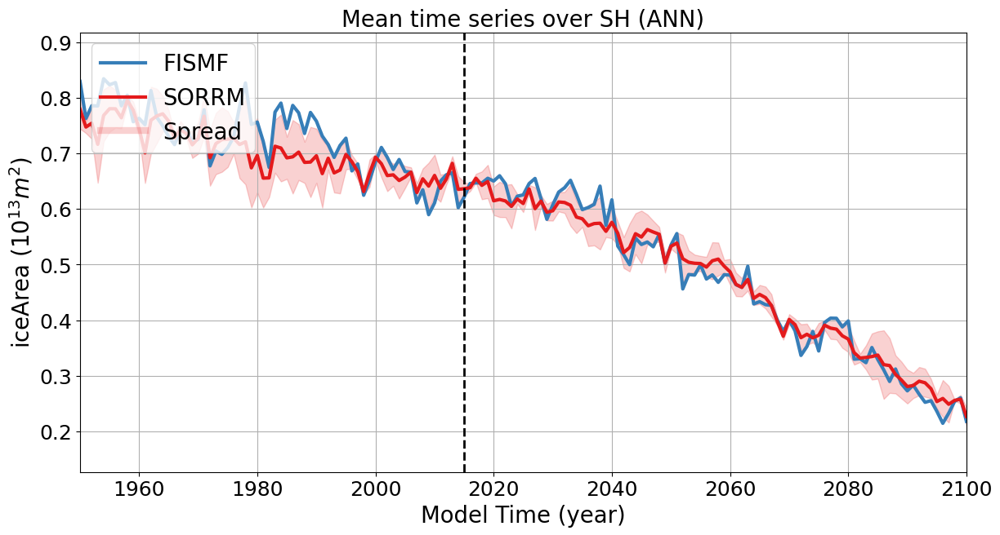

<Figure size 640x480 with 0 Axes>

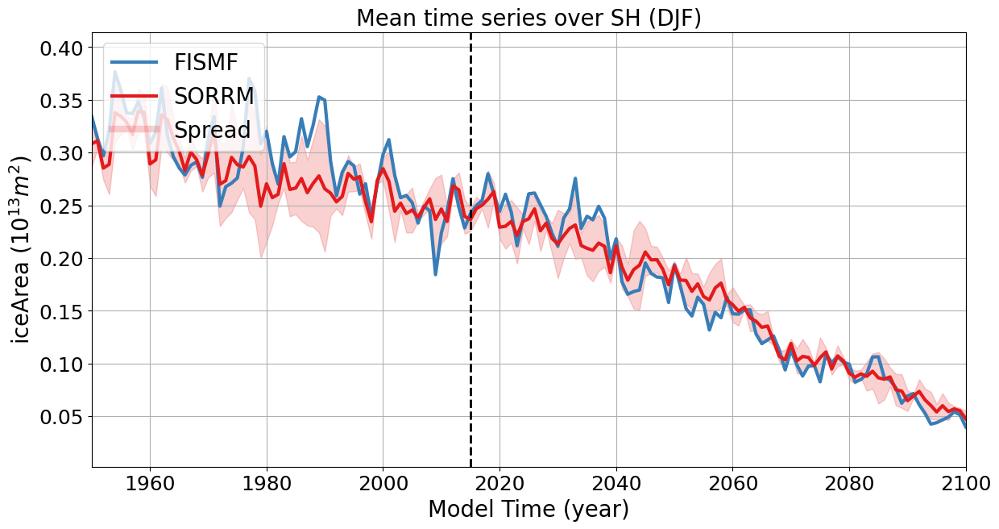

<Figure size 640x480 with 0 Axes>

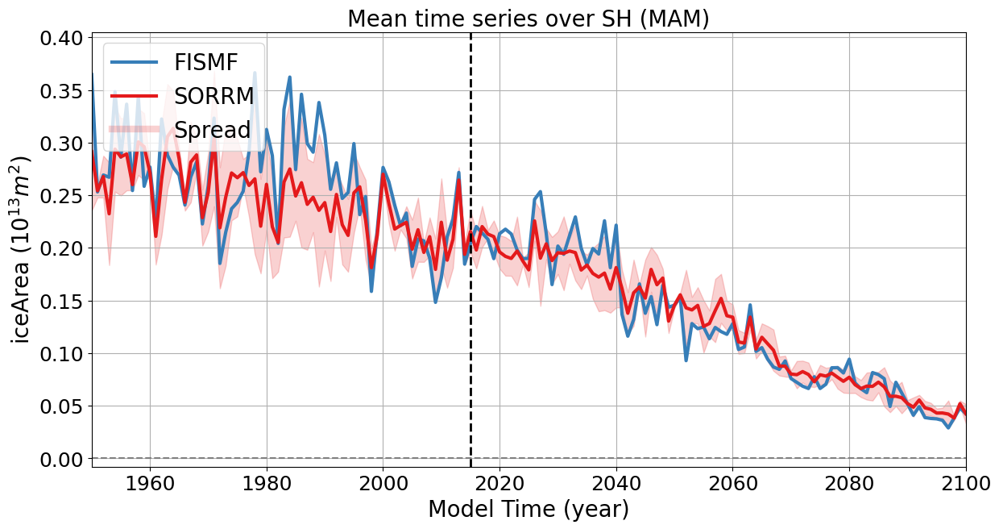

<Figure size 640x480 with 0 Axes>

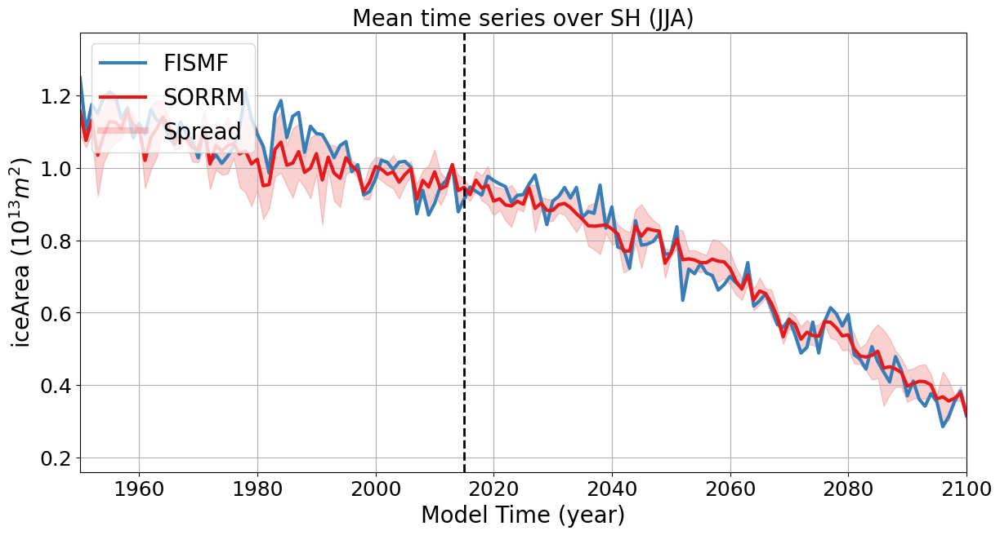

<Figure size 640x480 with 0 Axes>

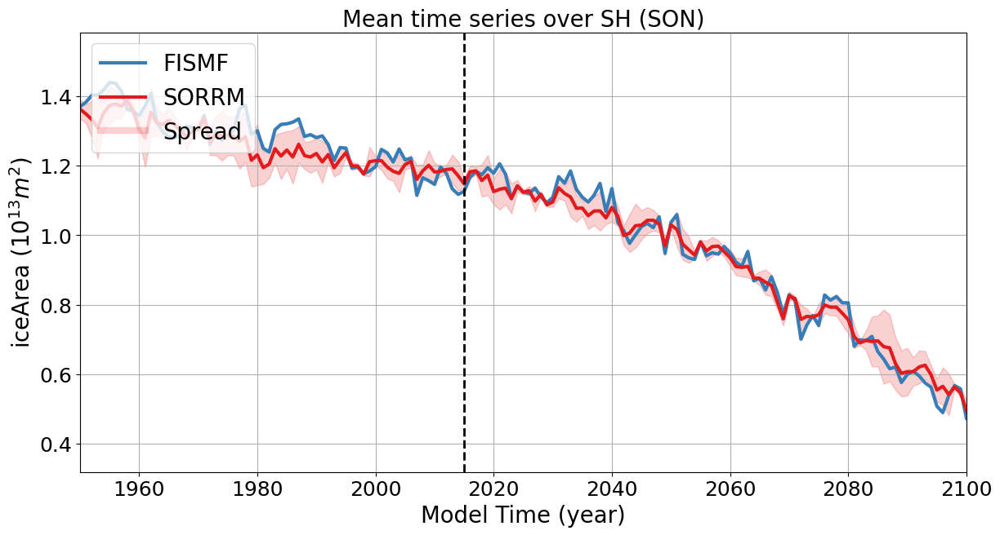

<Figure size 640x480 with 0 Axes>

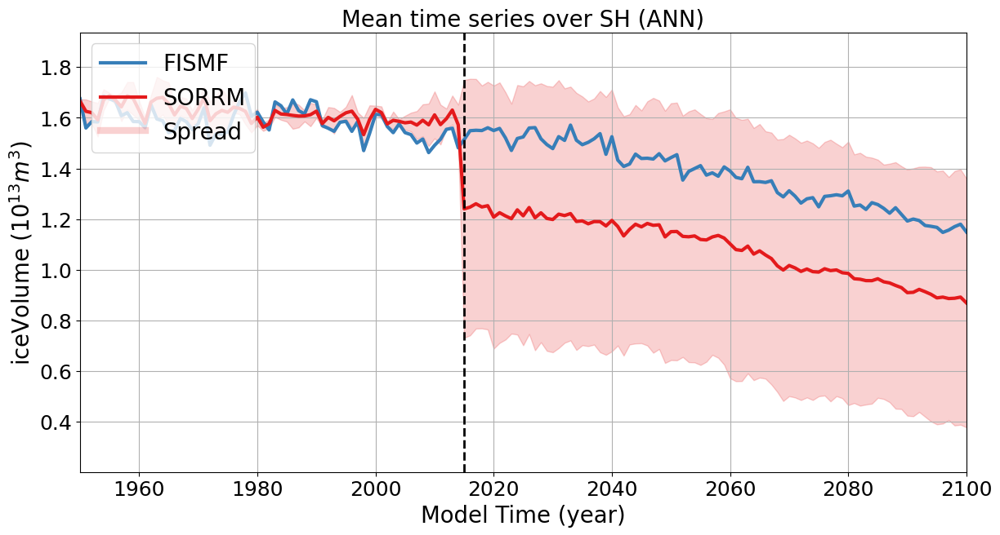

<Figure size 640x480 with 0 Axes>

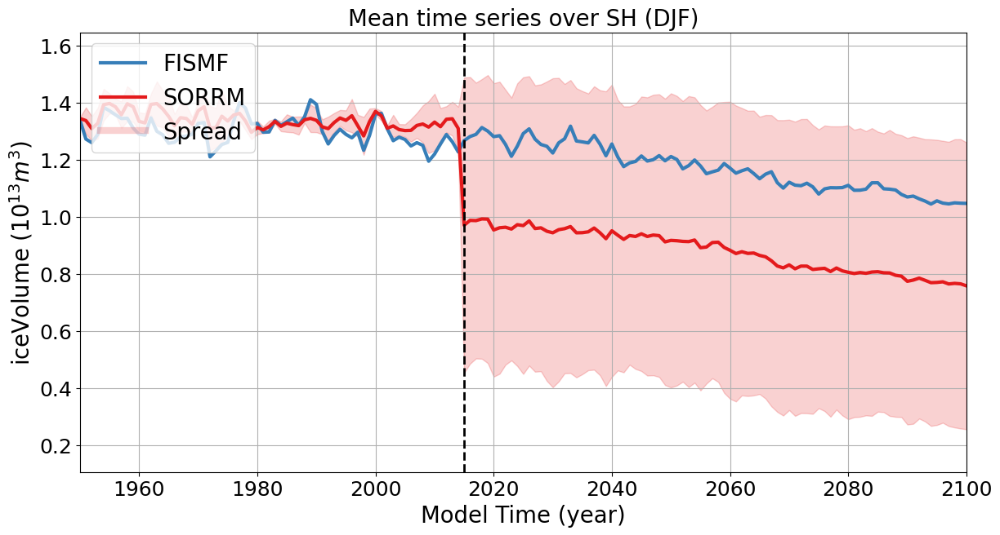

<Figure size 640x480 with 0 Axes>

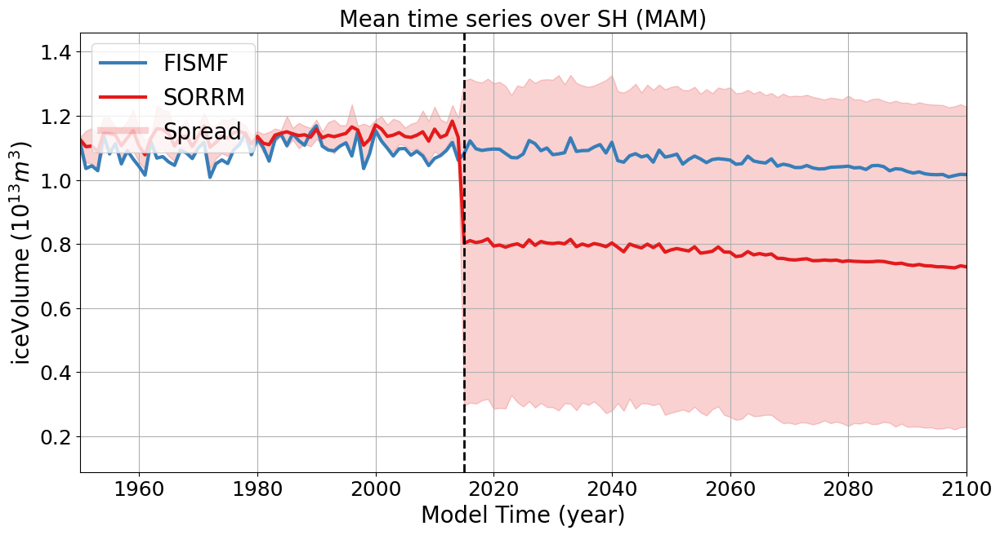

<Figure size 640x480 with 0 Axes>

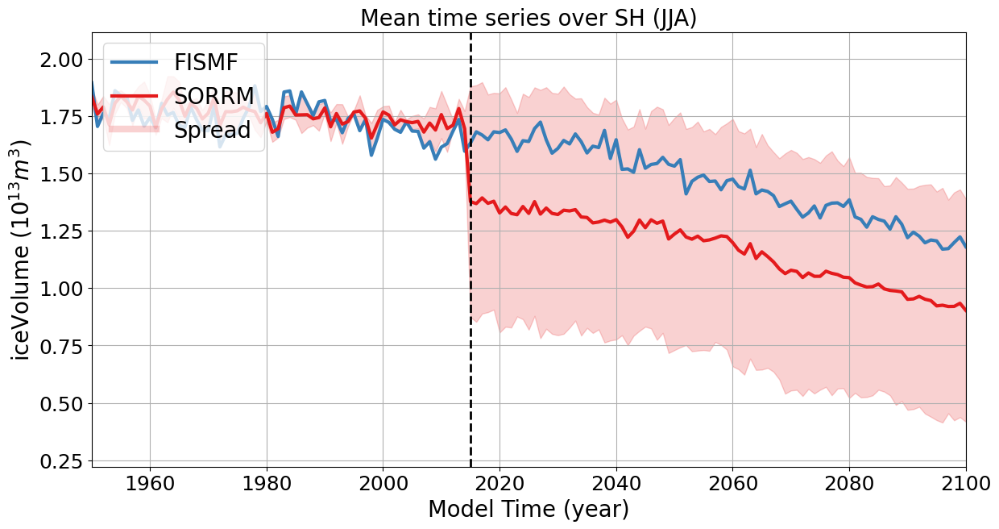

<Figure size 640x480 with 0 Axes>

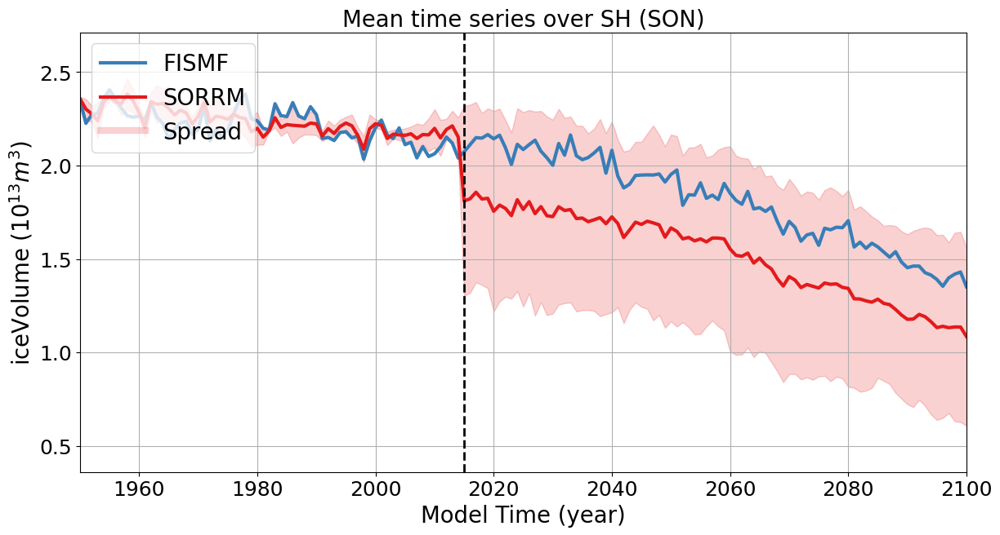

<Figure size 640x480 with 0 Axes>

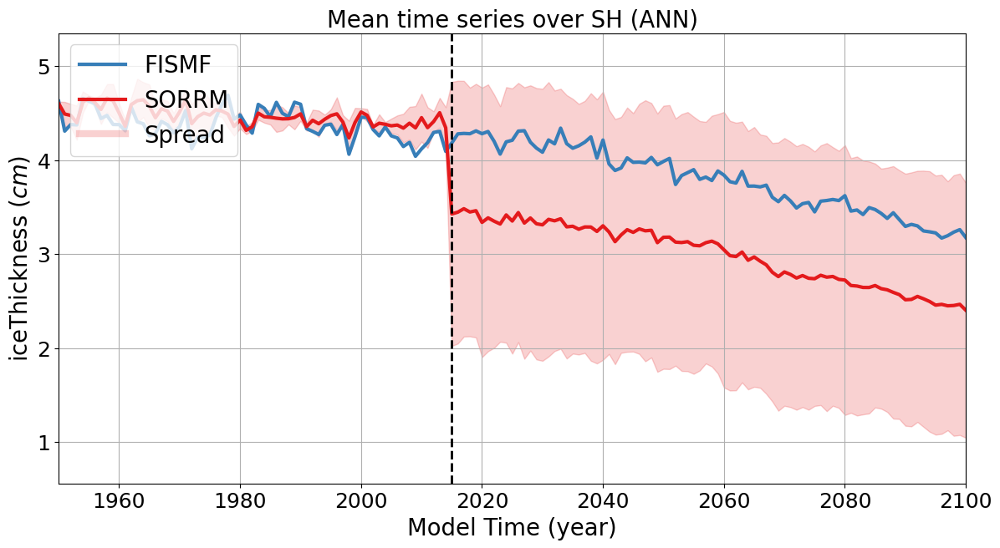

<Figure size 640x480 with 0 Axes>

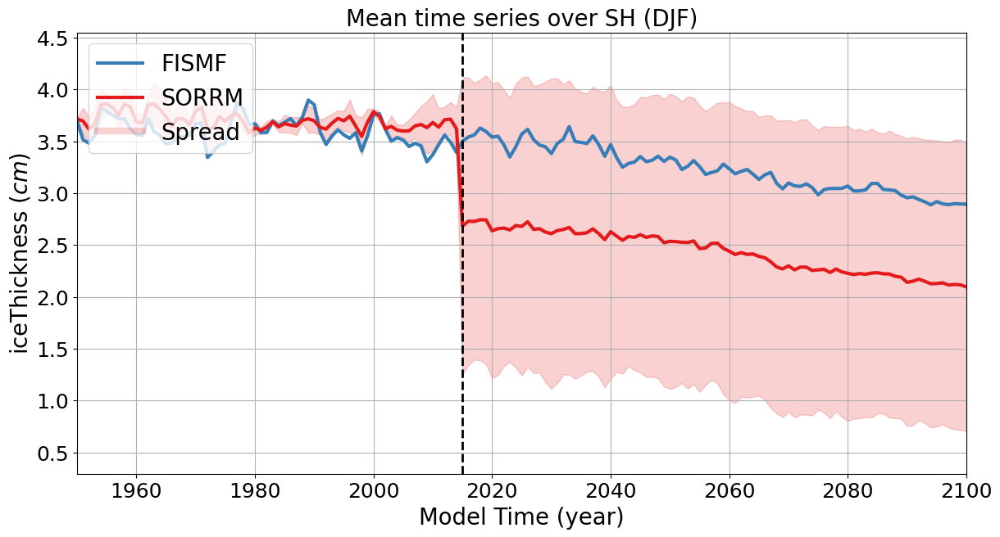

<Figure size 640x480 with 0 Axes>

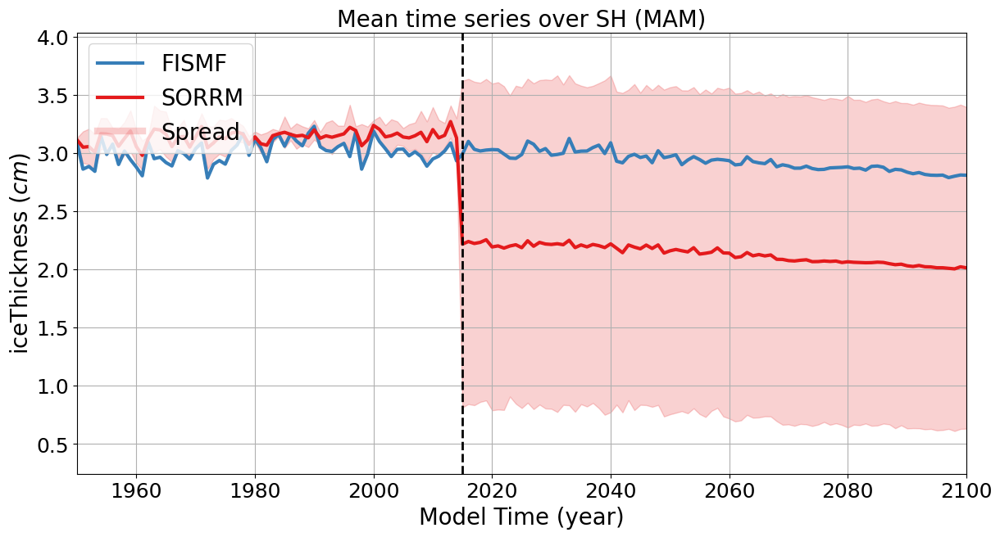

<Figure size 640x480 with 0 Axes>

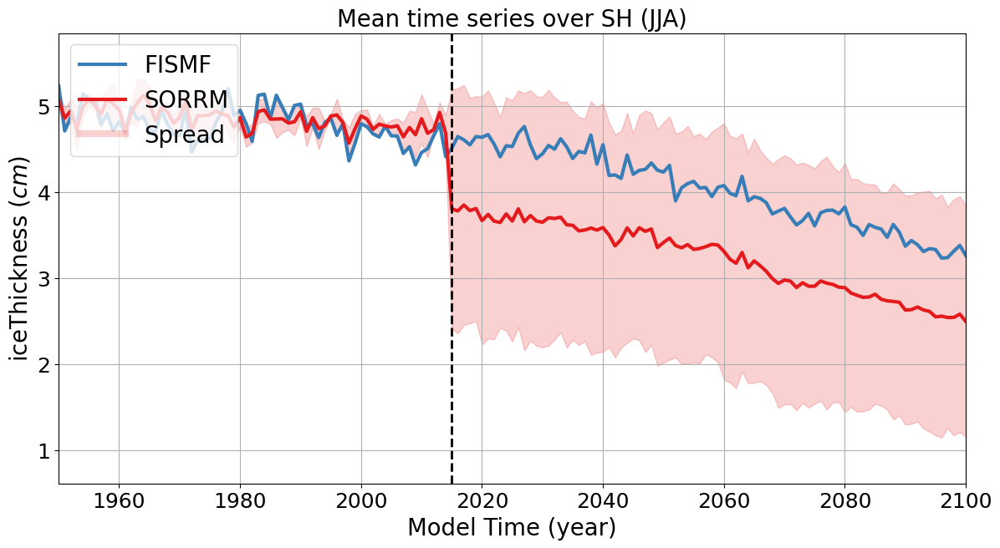

<Figure size 640x480 with 0 Axes>

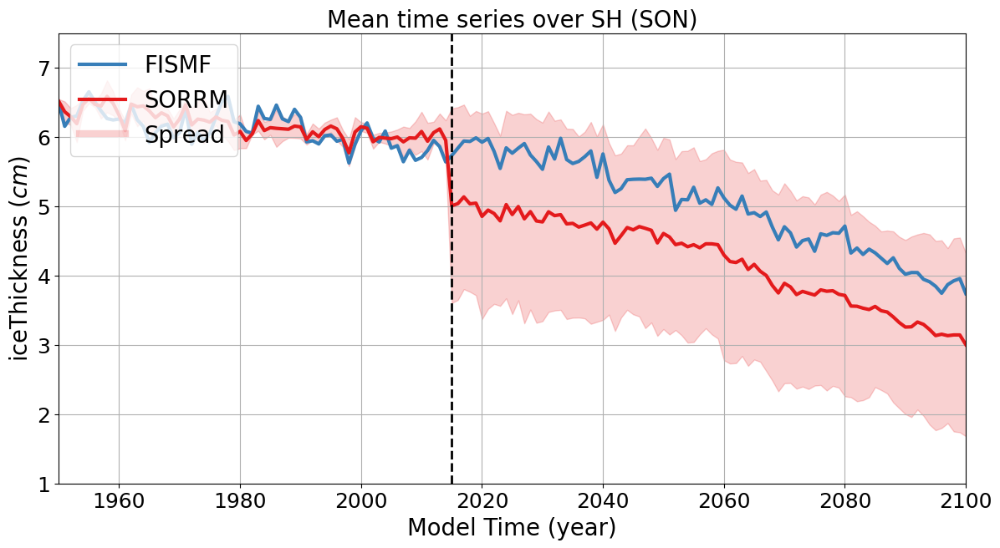

<Figure size 640x480 with 0 Axes>

In [121]:
if __name__ == "__main__":
    results_dir = "/lcrc/group/e3sm/ac.szhang/acme_scratch/e3sm_project/E3SMv21_testings/paper_material"
    top_dir = "/lcrc/group/acme/ac.szhang/acme_scratch/e3sm_project/E3SMv21_testings/paper_material"
    ts_path = os.path.join(top_dir,"fig_data","mpas_ts","raw_index")
    fig_dir = os.path.join(top_dir,"6_regional_analysis","metrics_plots","figure")
    exps = ["v2_1-SORRM.0701","v2_1-SORRM.0751","v2_1-SORRM.0801",'v2_1-SORRM-FISMF.0701']  
    seas = ['ANN','DJF','MAM','JJA','SON']

    if not os.path.exists(fig_dir):
        os.makedirs(fig_dir)
    
    mip = "e3sm"
    case_id = "mpas_ts"
    
    var = 'seaIceAreaVolSH'
    data_dict = {}
    for i,exp in enumerate(exps):
        fil1 =  os.path.join(ts_path,'{}.historical.{}.{}.{}.195001-201412.csv'.format(mip,exp,case_id,var))
        fil2 =  os.path.join(ts_path,'{}.ssp370.{}.{}.{}.201501-210012.csv'.format(mip,exp,case_id,var))
        if 'FISMF' in exp:
            fil1 = fil1.replace('-FISMF','')
        df1 = pd.read_csv(fil1)
        df2 = pd.read_csv(fil2)
        data = pd.concat([df1, df2], ignore_index=True)
        data.drop('time', axis=1, inplace=True)
        for sea in seas: 
            if sea in ['DJF']:
                sub_data  = data[data['month'].isin([12,1,2])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['JJA']:
                sub_data  = data[data['month'].isin([6,7,8])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['MAM']:
                sub_data  = data[data['month'].isin([3,4,5])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['SON']:
                sub_data  = data[data['month'].isin([9,10,11])].copy()
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['ANN']:
                sub_data  = data
                datmn = sub_data.groupby(by=['year'],dropna=True).mean()
            if sea in ['AC']:
                sub_data  = data
                datmn = sub_data.groupby(by=['month'],dropna=True).mean()
            if sea in ['Monthly']:
                sub_data  = data
                datmn = data
            #print(np.array(datmn.index))
            time = np.array(datmn.index) 
            for col in list(datmn.columns)[1:]:
                if col not in data_dict.keys():
                    data_dict[col] = {}
                if sea not in data_dict[col].keys():
                    data_dict[col][sea] = {}
                if exp not in data_dict[col][sea].keys():
                    data_dict[col][sea][exp] = {} 
                data_dict[col][sea][exp] = datmn[col]    
        del(df1,df2,data,datmn)
    
    #plot
    region = "SH"
    var = 'seaIceAreaVolSH'
    for varplt in ['iceArea','iceVolume','iceThickness']: 
        for sea in seas:
            data = data_dict[varplt][sea]
            if varplt == 'iceArea':
                varunt = "$10^{13} m^{2}$"
                for kk in data.keys():
                    data[kk] =  data[kk] * 1e-13
            if varplt == 'iceVolume':
                varunt = "$10^{13} m^{3}$"
                for kk in data.keys():
                    data[kk] =  data[kk] * 1e-13
            if varplt == 'iceThickness':
                varunt = "$cm$" 
                for kk in data.keys():
                    data[kk] =  data[kk] * 1e2
            plot_time_series(varplt,varunt,region,sea,exps,time,data,fig_dir)
            

In [101]:
if __name__ == "__main__":

  results_dir = "/lcrc/group/e3sm/ac.szhang/acme_scratch/e3sm_project/E3SMv21_testings/paper_material"
  data_dir = "/lcrc/group/e3sm/public_html/diagnostic_output/ac.szhang/E3SMv2_1/pcmdi"
  ts_path = os.path.join(data_dir,"diagnostic_results","variability_modes")
  fig_dir = os.path.join(results_dir,"4_sam_analysis","sam_index_ts","figure")
 
  exps = ["v2_1-SORRM.0701","v2_1-SORRM.0751","v2_1-SORRM.0801",'v2_1-SORRM-FISMF.0701']  
  seas = ["monthly"]
  mode = "SAM_PSL_EOF1"
  dir_hist = os.path.join(ts_path,"e3sm/historical/v20241111/SAM/NOAA-20C")
  dir_sspf = os.path.join(ts_path,"e3sm/ssp370/v20241111/SAM/NOAA-20C")
  period_hist = "1950-2014"
  period_sspf = "2015-2100"
  out_dir = os.path.join(results_dir,"4_sam_analysis","time_series")

  # density of reference seawater (kg/m^3)
  rho_sw = 1026.

  # Heat capacity of seawater
  cp_sw  = 3.996e3

  #low pass to remove fluctuations less than 24 months (2 years).
  sample_time = 1 # unit: month
  cutoff_freq = 1.0/24.0 # 2-year filtering

  for sea in seas:
    labels = []
    eof_hst = []
    eof_ssp = []
    var_frc = []
    dts_raw = []
    dts_flt = []
    for exp in exps:
      ekey = exp.split(".")
      if 'FISMF' in exp:
        fil1 = glob.glob(os.path.join(dir_hist,
               '{}_{}_*_{}_*_{}_{}_*cbf.nc'.format(mode,sea,ekey[0].replace('-FISMF',''),ekey[1],period_hist)))
        fil2 = glob.glob(os.path.join(dir_sspf,
               '{}_{}_*_{}_*_{}_{}_*cbf.nc'.format(mode,sea,ekey[0],ekey[1],period_sspf)))
      else:
        fil1 = glob.glob(os.path.join(dir_hist,
               '{}_{}_*_{}_*_{}_{}_*cbf.nc'.format(mode,sea,ekey[0],ekey[1],period_hist)))
        fil2 = glob.glob(os.path.join(dir_sspf,
               '{}_{}_*_{}_*_{}_{}_*cbf.nc'.format(mode,sea,ekey[0],ekey[1],period_sspf)))
      f1   = xr.open_mfdataset(fil1)
      f2   = xr.open_mfdataset(fil2)
      pc1  = f1['pc']
      pc2  = f2['pc']
      eof1 = f1['eof']
      eof2 = f2['eof']
      fra1 = f1['frac'].data * 100.0
      fra2 = f2['frac'].data * 100.0
      pcs  = xr.concat([pc1, pc2], dim="time")

      #Extract the data
      dtmp_raw = np.array(pcs.data).ravel()
      dtmp_flt = low_pass(cutoff_freq,sample_time,dtmp_raw)
      dts_raw.append(dtmp_raw)
      dts_flt.append(dtmp_flt)
      labels.append("{}-{}".format(ekey[0],ekey[1]))
      del(ekey,fil1,fil2,f1,f2,pc1,pc2,eof1,eof2,fra1,fra2,pcs,dtmp_raw,dtmp_flt)
      # plot
    plot_time_series(mode,sea,labels,period_hist,period_sspf,dts_raw,dts_flt,out_dir)
    del(dts_raw,dts_flt,labels)

0.041666666666666664 0.5
0.041666666666666664 0.5
0.041666666666666664 0.5
0.041666666666666664 0.5


AttributeError: 'list' object has no attribute 'upper'